In [7]:
# =========================
# CELL 1 — Calculations
# =========================
import os
from pathlib import Path
import numpy as np
import pandas as pd

# ---- Parameters (non-plot) ----
TAU_RATE_SEC   = 1
PRE_ZERO_SEC   = 3 * TAU_RATE_SEC
stride_sec     = 0.1

ICI_SMOOTH_SEC = 2.5
CV_FWD_SEC     = 5
CV_MIN_SAMPLES = 3
CV_SMOOTH_SEC  = 1.0
GAUSS_TRUNC    = 3.0
RMS_SMOOTH_SEC = 2.5

# ---- Paths / experiments ----
exp_list = [272,273]
figs_path = r"C:\Users\gg3065\Dropbox\Vocalizations_project\Figures"
base_path_audio = r"\\sanesstorage.cns.nyu.edu\archive\ginosar\Processed_data\Audio"
audio_csv_path = os.path.join(base_path_audio, r"events_combined_272_273.csv")

# ---------- Load audio events ----------
df = pd.read_csv(audio_csv_path)
for col in ["start_time_experiment_sec", "stop_time_experiment_sec", "bout_id"]:
    if col in df.columns:
        df[col] = pd.to_numeric(df[col], errors="coerce")

alarm_calls = df[(df["event_type"] == "alarm") & (df["bout_id"].notna())].copy()
if alarm_calls.empty:
    raise ValueError("No alarm rows with non-null bout_id found in the CSV.")
playbacks = df[df["event_type"] == "playback"].copy()

# ---------- Sync helpers ----------
def load_all_sync_files(exp_list):
    sync_data = {}
    for exp in exp_list:
        sync_path = Path(
            fr"\\sanesstorage.cns.nyu.edu\archive\ginosar\Raw_data\experiment_{exp}\concatenated_data_cam_mic_sync\sync.csv"
        )
        if not sync_path.exists():
            raise FileNotFoundError(f"Sync file not found: {sync_path}")
        s = pd.read_csv(sync_path)
        if isinstance(s["video"].iloc[0], str):
            s["video"] = s["video"].apply(eval)
        if isinstance(s["timestamp"].iloc[0], str):
            s["timestamp"] = s["timestamp"].apply(eval)
        exp_start_real = pd.to_datetime(s.iloc[0]["timestamp"][0])
        sync_data[exp] = (exp_start_real, s)
    return sync_data

def get_experiment_start(sync_data_dict, exps):
    return min(sync_data_dict[e][0] for e in exps)

def get_experiment_end(sync_data_dict):
    latest_end = None
    for _, (_, s) in sync_data_dict.items():
        if isinstance(s["timestamp"].iloc[0], str):
            s["timestamp"] = s["timestamp"].apply(eval)
        s["end_time"] = s["timestamp"].apply(lambda x: pd.to_datetime(x[1]))
        mx = s["end_time"].max()
        latest_end = mx if latest_end is None or mx > latest_end else latest_end
    return latest_end

def build_label_df(sync_data_dict, exps):
    rows = []
    for exp in exps:
        _, s = sync_data_dict[exp]
        sd = s.copy()
        sd["start_real"] = sd["timestamp"].apply(lambda ts: pd.to_datetime(ts[0]))
        sd["file_index"] = sd["video"].apply(
            lambda vlist: next((int(v.split("_")[-1]) for v in vlist if "video_center" in v), None)
        )
        sd["exp"] = exp
        sd = sd.dropna(subset=["file_index"])
        sd["label"] = sd["exp"].astype(str) + "_" + sd["file_index"].astype(int).astype(str).str.zfill(3)
        rows.append(sd[["start_real", "label", "file_index", "exp"]])
    return pd.concat(rows, ignore_index=True) if rows else pd.DataFrame(columns=["start_real", "label", "file_index", "exp"])

def build_file_start_map(label_df):
    """
    Returns {(exp, file_index) -> start_real Timestamp}
    """
    if label_df.empty:
        return {}
    m = {}
    for _, r in label_df.iterrows():
        m[(int(r["exp"]), int(r["file_index"]))] = pd.to_datetime(r["start_real"])
    return m

# ---------- Compute experiment anchors ----------
sync_data_dict = load_all_sync_files(exp_list)
experiment_start_real = get_experiment_start(sync_data_dict, exp_list)
experiment_end_real   = get_experiment_end(sync_data_dict)
label_df = build_label_df(sync_data_dict, exp_list)
file_start_map = build_file_start_map(label_df)

# Absolute times for calls
alarm_calls["start_real"] = pd.to_datetime(
    alarm_calls["start_time_experiment_sec"], unit="s", origin=experiment_start_real
)

# ---------- Bout selection & ordering ----------
valid = alarm_calls.groupby("bout_id").filter(lambda g: len(g) > 2)
if valid.empty:
    raise ValueError("No bouts with >2 calls. Relax the criterion if needed.")

idx = valid.groupby("bout_id")["start_time_experiment_sec"].idxmin()
onset_rows = valid.loc[idx, ["bout_id", "start_time_experiment_sec", "exp"]].copy()
onset_rows.rename(columns={"start_time_experiment_sec": "onset_sec",
                           "exp": "onset_exp"}, inplace=True)
onset_rows["onset_real"] = pd.to_datetime(onset_rows["onset_sec"], unit="s",
                                          origin=experiment_start_real)
bout_onsets = onset_rows.sort_values("onset_real").reset_index(drop=True)
bout_onsets["ord"] = np.arange(1, len(bout_onsets) + 1)

bout_ord_by_id    = dict(zip(bout_onsets["bout_id"],  bout_onsets["ord"]))
onset_real_by_id  = dict(zip(bout_onsets["bout_id"],  bout_onsets["onset_real"]))
onset_exp_by_id   = dict(zip(bout_onsets["bout_id"],  bout_onsets["onset_exp"]))
used_bout_ids     = bout_onsets["bout_id"].tolist()

# Will affect coloring in plots
reliable_loc = (min(exp_list) >= 211)

# ---------- Load per-file bout annotations & align to real time ----------
def load_bout_annotations(exp_list, base_dir):
    rows = []
    for exp in exp_list:
        p = Path(base_dir) / str(exp) / f"bout_annotations_{exp}.csv"
        if not p.exists():
            continue
        a = pd.read_csv(p)
        a["exp"] = pd.to_numeric(a.get("exp", exp), errors="coerce").fillna(exp).astype(int)
        a["file_num"] = pd.to_numeric(a["file_num"], errors="coerce").astype("Int64")
        a["start_time_file_sec"] = pd.to_numeric(a["start_time_file_sec"], errors="coerce")
        a["tags"] = a.get("tags", "").fillna("").astype(str)
        # keep only rows with non-empty tags
        a = a[a["tags"].str.strip() != ""].copy()
        if a.empty:
            continue

        # Map (exp, file_num) -> file start real time
        start_reals = []
        for _, r in a.iterrows():
            key = (int(r["exp"]), int(r["file_num"])) if pd.notna(r["file_num"]) else None
            sr = file_start_map.get(key, None)
            start_reals.append(sr)
        a["file_start_real"] = start_reals
        a = a.dropna(subset=["file_start_real"])

        # Absolute annotation time
        a["annot_real"] = pd.to_datetime(a["file_start_real"]) + pd.to_timedelta(a["start_time_file_sec"], unit="s")

        rows.append(a[["exp","file_num","bout_id","tags","annot_real","start_time_file_sec"]])
    if not rows:
        return pd.DataFrame(columns=["exp","file_num","bout_id","tags","annot_real","start_time_file_sec"])
    out = pd.concat(rows, ignore_index=True)

    # Relative to bout onset (for raster figure)
    out["bout_id"] = pd.to_numeric(out.get("bout_id", np.nan), errors="coerce")
    def rel_sec(row):
        b = row["bout_id"]
        if pd.isna(b) or b not in onset_real_by_id:
            return np.nan
        return (row["annot_real"] - onset_real_by_id[b]).total_seconds()
    out["annot_rel_sec"] = out.apply(rel_sec, axis=1)
    return out

bout_annots = load_bout_annotations(exp_list, base_path_audio)


In [27]:
# TEST

import re
from collections import Counter

def split_tags(txt: str):
    parts = re.split(r'[;,/]|(?:\band\b)', str(txt), flags=re.IGNORECASE)
    out, seen = [], set()
    for p in (x.strip() for x in parts):
        key = p.lower()
        if p and key not in seen:
            out.append(p); seen.add(key)
    return out

def tag_role(tag: str) -> str:
    t = str(tag).lower()
    if re.search(r'\bmom\b', t): return 'mom'
    if re.search(r'\bdad\b', t): return 'dad'
    return 'pup'  # everything else (e.g., Fluffy, any Pup variant)

def roles_from_subset(df_sub: pd.DataFrame) -> tuple[list[str], Counter]:
    items = []
    for _, r in df_sub.iterrows():
        items.extend(split_tags(r["tags"]))
    roles = [tag_role(it) for it in items]
    return list(dict.fromkeys(roles)), Counter(roles)  # uniq, order-preserving

rows_roles = []
if bout_annots is not None and not bout_annots.empty:
    ann_times = pd.to_datetime(bout_annots["annot_real"])
    for bout_id in used_bout_ids:
        exp_i   = int(onset_exp_by_id[bout_id])
        t0_real = pd.to_datetime(onset_real_by_id[bout_id])
        w0 = t0_real - pd.Timedelta(seconds=pre_time)   # or PRE_WINDOW_SEC
        w1 = t0_real + pd.Timedelta(seconds=post_time)  # or POST_TIME_LIMIT

        mask = (ann_times >= w0) & (ann_times <= w1) & (bout_annots["exp"].astype(int) == exp_i)
        sub  = bout_annots.loc[mask].sort_values("annot_real")

        roles_list, counts = roles_from_subset(sub)
        role_set = set(roles_list)
        if len(role_set) >= 2:
            bucket = 'multiple'
        elif 'dad' in role_set:
            bucket = 'dad'
        elif 'mom' in role_set:
            bucket = 'mom'
        elif 'pup' in role_set:
            bucket = 'pup'
        else:
            bucket = 'unknown'

        rows_roles.append({
            "bout_id": bout_id,
            "exp": exp_i,
            "onset_real": t0_real,
            "ord": int(bout_ord_by_id[bout_id]),
            "roles_list": roles_list,
            "roles_counts": dict(counts),
            "bucket": bucket,
        })

df_bout_roles = pd.DataFrame(rows_roles).sort_values(["exp","ord"]).reset_index(drop=True)

# Four *exclusive* buckets (dad/mom/pup/multiple). Unknowns are dropped.
ids_dad       = df_bout_roles.loc[df_bout_roles["bucket"]=="dad", "bout_id"].tolist()
ids_mom       = df_bout_roles.loc[df_bout_roles["bucket"]=="mom", "bout_id"].tolist()
ids_pup       = df_bout_roles.loc[df_bout_roles["bucket"]=="pup", "bout_id"].tolist()
ids_multiple  = df_bout_roles.loc[df_bout_roles["bucket"]=="multiple", "bout_id"].tolist()


✅ Saved: C:\Users\gg3065\Dropbox\Vocalizations_project\Figures\calls_over_time_w_rate_exp_272_273_tau_1.pdf
✅ Saved: C:\Users\gg3065\Dropbox\Vocalizations_project\Figures\bout_aligned_exp_272_273.pdf


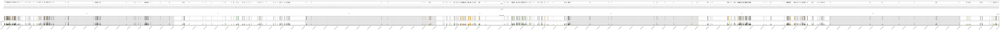

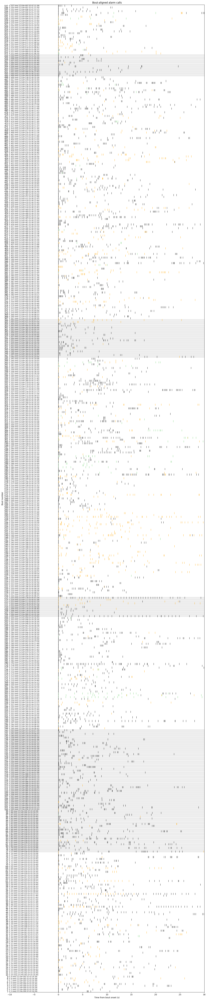

In [8]:
# =========================
# CELL 2 — Plotting (with tag gap axis)
# =========================
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.ticker as mticker
from matplotlib.patches import Rectangle
from matplotlib.gridspec import GridSpec
import numpy as np
import pandas as pd

# ---------- Plot params ----------
pre_time, post_time = 10, 30
num_bins = int((pre_time + post_time) / stride_sec)

# Visuals
ROW_PAD       = 0.05
PER_ROW_INCH  = 0.12
BASE_INCH     = 3.5

# Axis relative heights
BOUT_AX_REL   = 0.30
FILE_AX_REL   = 0.50
TAGS_AX_REL   = 0.80   # <- new vertical gap to host tags
RATE_AX_REL   = 1.20
CALLS_AX_REL  = RATE_AX_REL  # <- make calls panel as tall as rate panel

# Grid lines
HOUR_LINESTYLE = '--'
HOUR_LINEWIDTH = 1.2
HOUR_ALPHA     = 0.35

FILE_LINESTYLE = '-'
FILE_LINEWIDTH = 0.4
FILE_ALPHA     = 0.25

# Colors
preferred_colors = {'arena_1': 'orange', 'arena_2': '#66CC66', 'underground': 'black'}
def call_color(loc):
    return preferred_colors.get(loc, 'tab:blue') if reliable_loc else 'blue'

# ---------- Plotting helpers ----------
def shade_night_between(ax_list, start, end, night_start_hour=20, night_end_hour=8, **span_kwargs):
    if not isinstance(ax_list, (list, tuple, np.ndarray)):
        ax_list = [ax_list]
    current = start.normalize() - pd.Timedelta(days=1)
    last    = end.normalize() + pd.Timedelta(days=1)
    while current <= last:
        ns = current + pd.Timedelta(hours=night_start_hour)
        ne = current + pd.Timedelta(days=1, hours=night_end_hour)
        left, right = max(start, ns), min(end, ne)
        if left < right:
            for ax in ax_list:
                ax.axvspan(left, right, **span_kwargs)
        current += pd.Timedelta(days=1)

def night_segments_for_row(t0_real, window_start_real, window_end_real,
                           night_start_hour=20, night_end_hour=8):
    segs = []
    current = window_start_real.normalize() - pd.Timedelta(days=1)
    last    = window_end_real.normalize() + pd.Timedelta(days=1)
    while current <= last:
        ns = current + pd.Timedelta(hours=night_start_hour)
        ne = current + pd.Timedelta(days=1, hours=night_end_hour)
        left, right = max(window_start_real, ns), min(window_end_real, ne)
        if left < right:
            segs.append(((left - t0_real).total_seconds(), (right - t0_real).total_seconds()))
        current += pd.Timedelta(days=1)
    return segs

def row_yspan(row_idx, pad=ROW_PAD):
    return row_idx + pad, row_idx + 1 - pad

def rate_from_times_causal(times_sec, start_sec, end_sec, dt, tau_sec):
    edges_sec   = np.arange(start_sec, end_sec + dt, dt)
    centers_sec = edges_sec[:-1] + dt / 2.0
    counts, _   = np.histogram(times_sec, bins=edges_sec)
    x = counts.astype(float) / dt
    alpha = 1.0 - np.exp(-dt / tau_sec)
    y = np.empty_like(x, dtype=float)
    if x.size == 0:
        return pd.to_datetime([]), np.array([])
    y[0] = x[0]
    for i in range(1, len(x)):
        y[i] = (1 - alpha) * y[i-1] + alpha * x[i]
    tgrid_real = experiment_start_real + pd.to_timedelta(centers_sec, unit='s')
    return tgrid_real, y

import re

def tag_color(txt: str):
    t = str(txt).lower()
    if re.search(r'\bmom\b', t): return 'red'   # Mom
    if re.search(r'\bdad\b', t): return 'blue'  # Dad
    return 'orange'                              # everything else (e.g., Pup, Fluffy, etc.)

def split_tags(txt: str):
    parts = re.split(r'[;,/]|(?:\band\b)', str(txt), flags=re.IGNORECASE)
    out, seen = [], set()
    for p in (x.strip() for x in parts):
        key = p.lower()
        if p and key not in seen:
            out.append(p); seen.add(key)
    return out

def text_width_in_data(ax, s, fontsize=7):
    fig = ax.figure
    fig.canvas.draw()
    renderer = fig.canvas.get_renderer()
    tmp = ax.text(0, 0, s, fontsize=fontsize)
    bb = tmp.get_window_extent(renderer=renderer); tmp.remove()
    pix_w = bb.width
    ax_pix_w = ax.bbox.width
    x0, x1 = ax.get_xlim()
    return (pix_w / ax_pix_w) * (x1 - x0) if ax_pix_w else 0.1

def file_index_for_time(exp: int, t_real: pd.Timestamp) -> int | None:
    """
    Returns the 0-based audio file index (row in that experiment's sync.csv)
    whose [start,end] interval contains t_real. Uses sync_data_dict from Cell 1.
    """
    _, s = sync_data_dict[exp]  # loaded in Cell 1
    sd = s.copy()
    if isinstance(sd["timestamp"].iloc[0], str):
        sd["timestamp"] = sd["timestamp"].apply(eval)

    starts = sd["timestamp"].apply(lambda ts: pd.to_datetime(ts[0]))
    ends   = sd["timestamp"].apply(lambda ts: pd.to_datetime(ts[1]))
    mask = (starts <= t_real) & (t_real <= ends)
    if not mask.any():
        return None
    # positional index (0..N-1), not the DataFrame index
    return int(np.flatnonzero(mask.values)[0])

def global_spec_db_range(pre_items_subset, low_pct=5, hi_pct=95):
    """Compute robust vmin/vmax across all spectrogram strips in pre_items_subset."""
    vals = []
    for it in pre_items_subset:
        if it is None or "S" not in it:
            continue
        S = it["S"]
        if S.size:
            vals.append(S[np.isfinite(S)])
    if not vals:
        # sensible defaults if nothing is available
        return -120.0, -30.0
    v = np.concatenate(vals)
    if v.size == 0:
        return -120.0, -30.0
    vmin = float(np.percentile(v, low_pct))
    vmax = float(np.percentile(v, hi_pct))
    if np.isclose(vmin, vmax):
        vmin, vmax = float(v.min()), float(v.max())
    return vmin, vmax


# ==========================================================
# FIGURE 1 — raw data as time series (with TAGS gap axis)
# ==========================================================
fig1 = plt.figure(figsize=(200, 6), constrained_layout=True)
gs = GridSpec(
    nrows=5, ncols=1, figure=fig1,
    height_ratios=[BOUT_AX_REL, FILE_AX_REL, TAGS_AX_REL, CALLS_AX_REL, RATE_AX_REL]
)

ax_bout  = fig1.add_subplot(gs[0, 0])                 # bout # (top)
ax_file  = fig1.add_subplot(gs[1, 0], sharex=None)    # file labels
ax_tags  = fig1.add_subplot(gs[2, 0])                 # <- NEW gap axis (for tags)
ax_calls = fig1.add_subplot(gs[3, 0])                 # calls (same height as rate)
ax_rate  = fig1.add_subplot(gs[4, 0], sharex=ax_calls)

# ---- Calls axis (absolute time) ----
shade_night_between([ax_calls], experiment_start_real, experiment_end_real, color='gray', alpha=0.2)

# Hour ticks + include exact start/end
hour_loc    = mdates.HourLocator(interval=1)
hour_nums   = hour_loc.tick_values(experiment_start_real, experiment_end_real)
start_end   = mdates.date2num([experiment_start_real.to_pydatetime(),
                               experiment_end_real.to_pydatetime()])
tick_nums   = np.unique(np.concatenate([hour_nums, start_end]))

major_locator = mticker.FixedLocator(tick_nums)
major_fmt     = mdates.DateFormatter('%m-%d %H:%M')

ax_calls.xaxis.set_major_locator(major_locator)
ax_calls.xaxis.set_major_formatter(major_fmt)

# Minor ticks (file starts) + grid on calls axis
if not label_df.empty:
    file_starts = pd.to_datetime(label_df['start_real'])
    file_starts_num = mdates.date2num(file_starts)
    ax_calls.xaxis.set_minor_locator(mticker.FixedLocator(file_starts_num))
    ax_calls.grid(which='minor', axis='x', linestyle=FILE_LINESTYLE,
                  linewidth=FILE_LINEWIDTH, alpha=FILE_ALPHA)
    ax_calls.tick_params(axis='x', which='minor', length=3, width=0.5)

# Major (hour) grid
ax_calls.grid(which='major', axis='x', linestyle=HOUR_LINESTYLE,
              linewidth=HOUR_LINEWIDTH, alpha=HOUR_ALPHA)

# Plot calls
if reliable_loc:
    for loc in ['arena_1', 'arena_2', 'underground']:
        sub = alarm_calls[alarm_calls["assigned_location"] == loc]
        if len(sub) == 0:
            continue
        ax_calls.vlines(sub["start_real"], 0, 1, color=call_color(loc),
                        label=loc, alpha=0.7, linewidth=0.4)
else:
    ax_calls.vlines(alarm_calls["start_real"], 0, 1, color='tab:blue',
                    label='alarm', alpha=0.7, linewidth=0.4)

# Playbacks
if not playbacks.empty:
    for _, row in playbacks.dropna(subset=["start_time_experiment_sec", "stop_time_experiment_sec"]).iterrows():
        t_start = pd.to_datetime(row["start_time_experiment_sec"], unit='s', origin=experiment_start_real)
        t_stop  = pd.to_datetime(row["stop_time_experiment_sec"],  unit='s', origin=experiment_start_real)
        ax_calls.axvspan(t_start, t_stop, color='red', alpha=0.25, label='Playback')

# Cosmetics (calls)
ax_calls.set_xlim([experiment_start_real, experiment_end_real])
ax_calls.set_ylim(0, 1)
ax_calls.set_yticks([])
ax_calls.set_title("Alarm calls")
ax_calls.tick_params(axis='x', labelbottom=False)  # bottom labels only on rate panel

# Legend (dedup)
h, l = ax_calls.get_legend_handles_labels()
if h:
    uniq = dict(zip(l, h))
    ax_calls.legend(uniq.values(), uniq.keys(), loc='upper left', frameon=False)

# ---- TAGS axis (between file labels and calls) ----
# Share x with calls so positions line up; keep it visually empty except the tags
ax_tags.set_xlim(ax_calls.get_xlim())
ax_tags.set_ylim(0, 1)
ax_tags.set_yticks([])
ax_tags.tick_params(axis='x', which='both', length=0)  # no ticks
for spine in ("top", "right", "left", "bottom"):
    ax_tags.spines[spine].set_visible(False)

# draw tags here (vertical, unobtrusive)
if bout_annots is not None and not bout_annots.empty:
    y_text = 0.5  # centered in the gap
    for _, r in bout_annots.iterrows():
        t = pd.to_datetime(r["annot_real"])
        txt = str(r["tags"]).strip()
        if not txt:
            continue

        ax_tags.text(t, y_text, txt,
             fontsize=7, rotation=90, alpha=0.8,
             ha='left', va='center', clip_on=True, zorder=3,
             color=tag_color(txt))

# ---- File-number axis (on top of tags) ----
if not label_df.empty:
    ax_file.set_xlim(ax_calls.get_xlim())
    ax_file.set_xticks(pd.to_datetime(label_df['start_real']))
    ax_file.set_xticklabels(label_df['label'], rotation=90, fontsize=7)
    ax_file.set_xlabel("Exp_File")
else:
    ax_file.set_xticks([])
ax_file.set_yticks([])
for spine in ("right", "left"):
    ax_file.spines[spine].set_visible(False)

# ---- Bout-number axis (top) ----
ax_bout.set_xlim(ax_calls.get_xlim())
if len(bout_onsets):
    ax_bout.set_xticks(bout_onsets["onset_real"])
    ax_bout.set_xticklabels([str(o) for o in bout_onsets["ord"]], rotation=90, fontsize=7)
else:
    ax_bout.set_xticks([])
ax_bout.set_yticks([])
ax_bout.set_xlabel("Bout #")
for spine in ("right", "left"):
    ax_bout.spines[spine].set_visible(False)

# ---- Rate axis (bottom panel, causal EMA) ----
shade_night_between([ax_rate], experiment_start_real, experiment_end_real, color='gray', alpha=0.2)
ax_rate.xaxis.set_major_locator(major_locator)
ax_rate.xaxis.set_major_formatter(major_fmt)

if not label_df.empty:
    ax_rate.xaxis.set_minor_locator(mticker.FixedLocator(file_starts_num))
    ax_rate.grid(which='minor', axis='x', linestyle=FILE_LINESTYLE,
                 linewidth=FILE_LINEWIDTH, alpha=FILE_ALPHA)
    ax_rate.tick_params(axis='x', which='minor', length=3, width=0.5)

ax_rate.grid(which='major', axis='x', linestyle=HOUR_LINESTYLE,
             linewidth=HOUR_LINEWIDTH, alpha=HOUR_ALPHA)

# Compute & plot rate(s)
start_sec = 0.0
end_sec   = float((experiment_end_real - experiment_start_real).total_seconds())
if reliable_loc:
    for loc, col in [('arena_1', 'orange'), ('arena_2', 'green'), ('underground', 'black')]:
        tsec = alarm_calls.loc[alarm_calls['assigned_location'] == loc,
                               'start_time_experiment_sec'].dropna().values
        if tsec.size == 0:
            continue
        tgrid, rate = rate_from_times_causal(tsec, start_sec, end_sec, stride_sec, TAU_RATE_SEC)
        ax_rate.plot(tgrid, rate, color=col, label=f"{loc} rate", linewidth=1.2, alpha=0.9)
else:
    tsec = alarm_calls['start_time_experiment_sec'].dropna().values
    tgrid, rate = rate_from_times_causal(tsec, start_sec, end_sec, stride_sec, TAU_RATE_SEC)
    ax_rate.plot(tgrid, rate, color='tab:blue', label="all calls rate", linewidth=1.2, alpha=0.9)

# rate cosmetics
y0, y1 = ax_rate.get_ylim()
ax_rate.set_yticks([y0, y1])
ax_rate.set_yticklabels([f"{y0:.2f}", f"{y1:.2f}"])
ax_rate.set_ylabel("Rate (calls/s)")
ax_rate.tick_params(axis='x', which='major', pad=8)
plt.setp(ax_rate.get_xticklabels(), rotation=45, ha='right')

# Save Figure 1
exp_str = "_".join(str(e) for e in exp_list)
out1 = os.path.join(figs_path, f"calls_over_time_w_rate_exp_{exp_str}_tau_{TAU_RATE_SEC}.pdf")
fig1.savefig(out1, bbox_inches="tight")
print(f"✅ Saved: {out1}")

# ==========================================================
# FIGURE 2 — Bout-aligned raster (+ per-row night shading)
#   (unchanged except we REMOVE tag drawing here, since
#    you wanted the tags in the gap above the calls panel)
# ==========================================================
fig_h = BASE_INCH + PER_ROW_INCH * max(1, len(used_bout_ids))
fig2, ax2 = plt.subplots(1, 1, figsize=(14, fig_h), constrained_layout=True)

blank = np.zeros((max(1, len(used_bout_ids)), num_bins))
ax2.imshow(blank, aspect='auto', cmap="Greys", vmin=0, vmax=0,
           extent=[-pre_time, post_time, 0, max(1, len(used_bout_ids))])

# Per-row night shading
for row_idx, bout_id in enumerate(used_bout_ids):
    t0_real = onset_real_by_id[bout_id]
    w0 = t0_real - pd.Timedelta(seconds=pre_time)
    w1 = t0_real + pd.Timedelta(seconds=post_time)
    for rel_left, rel_right in night_segments_for_row(t0_real, w0, w1):
        left, right = max(-pre_time, rel_left), min(post_time, rel_right)
        if left < right:
            y0r, y1r = row_yspan(row_idx)
            rect = Rectangle((left, y0r), right - left, y1r - y0r,
                             facecolor='gray', alpha=0.15, edgecolor='none')
            ax2.add_patch(rect)

# Calls per row
for row_idx, bout_id in enumerate(used_bout_ids):
    g  = valid[valid["bout_id"] == bout_id]
    t0 = g["start_time_experiment_sec"].min()
    y0r, y1r = row_yspan(row_idx)
    for _, r in g.iterrows():
        rel = r["start_time_experiment_sec"] - t0
        if -pre_time <= rel <= post_time:
            loc = str(r.get("assigned_location", ""))
            col = 'tab:blue' if not reliable_loc else preferred_colors.get(loc, 'tab:blue')
            ax2.plot([rel, rel], [y0r, y1r], color=col, lw=1)

# --- Colored, non-overlapping tags per row (time-window based; no bout_id) ---
if bout_annots is not None and not bout_annots.empty:
    right_edge   = -0.02   # just left of time 0 (sec)
    gap_between  = 0.03
    font_sz      = 7

    # build a convenience series once
    ann_times = pd.to_datetime(bout_annots["annot_real"])

    for row_idx, bout_id in enumerate(used_bout_ids):
        # row onset and window (these rows are still built from your current 'valid')
        t0_real = onset_real_by_id[bout_id]
        w0 = t0_real - pd.Timedelta(seconds=pre_time)
        w1 = t0_real + pd.Timedelta(seconds=post_time)

        # pick all annotations whose absolute time falls inside this row's window
        mask = (ann_times >= w0) & (ann_times <= w1)
        sub = bout_annots.loc[mask]
        if sub.empty:
            continue

        # collect unique tag items (preserve first-seen order across time)
        tag_items, seen = [], set()
        sub = sub.sort_values("annot_real")
        for _, r in sub.iterrows():
            for item in split_tags(r["tags"]):
                key = item.lower()
                if key not in seen:
                    tag_items.append(item); seen.add(key)

        if not tag_items:
            continue

        y0r, y1r = row_yspan(row_idx)
        y_text = 0.5 * (y0r + y1r)

        # width-aware layout, right-to-left ending just before 0
        x_cursor = right_edge
        for item in reversed(tag_items):
            w = text_width_in_data(ax2, item, fontsize=font_sz)
            x_cursor -= w
            ax2.text(x_cursor, y_text, item,
                     fontsize=font_sz, alpha=0.95,
                     color=tag_color(item),
                     ha='left', va='center',
                     clip_on=True, zorder=4)
            x_cursor -= gap_between



# Left labels (now includes file number at bout onset)
for row_idx, bout_id in enumerate(used_bout_ids):
    ord_num  = bout_ord_by_id[bout_id]
    onset_dt = pd.to_datetime(onset_real_by_id[bout_id])
    onset_ex = int(onset_exp_by_id[bout_id])

    f_idx = file_index_for_time(onset_ex, onset_dt)
    f_txt = f"{f_idx:03d}" if f_idx is not None else "???"

    label = f"{ord_num} (exp {onset_ex} file {f_txt} {onset_dt.strftime('%m-%d %H:%M')})"
    ax2.text(-pre_time + 0.25, row_idx + 0.5, label,
             ha='left', va='center', fontsize=8, color='black')


ax2.axvline(0, linestyle='--', color='black', alpha=0.6)
ax2.set_xlim(-pre_time, post_time)
ax2.set_xlabel("Time from bout onset (s)")
ax2.set_title("Bout-aligned alarm calls")
ax2.set_yticks(np.arange(len(used_bout_ids)) + 0.5)
ax2.set_yticklabels([bout_ord_by_id[b] for b in used_bout_ids])
ax2.set_ylabel("Bout number")

out2 = os.path.join(figs_path, f"bout_aligned_exp_{exp_str}.pdf")
fig2.savefig(out2, bbox_inches="tight")
print(f"✅ Saved: {out2}")


C:\Users\gg3065\AppData\Local\Temp\ipykernel_36572\1091232165.py:534: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=(0, 0, 1, 0.97))


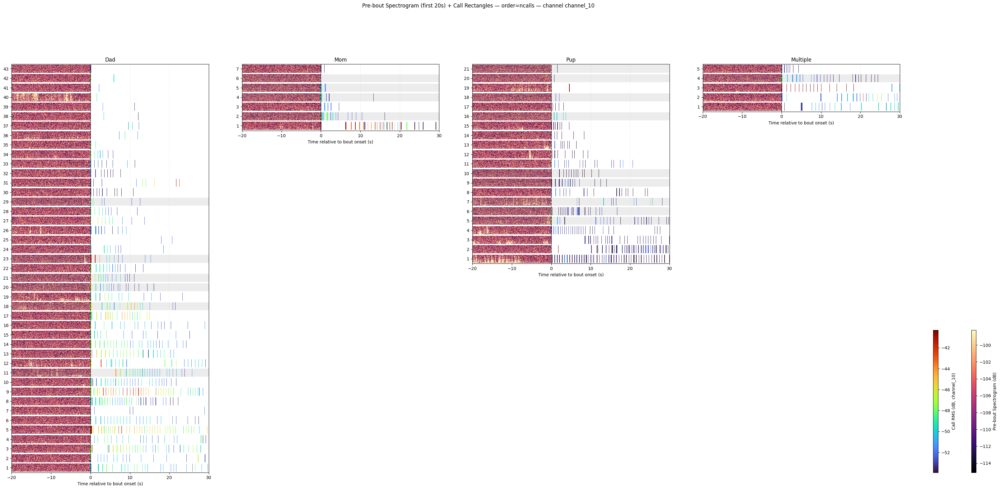

✅ Saved: C:\Users\gg3065\Dropbox\Vocalizations_project\Figures\prebout_4panels_constRow_wide_spec_ncalls_235_237.pdf


In [3]:
# ============================================
# ONE FIGURE: 4 side-by-side rasters
# (Dad / Mom / Pup / Multiple)
# + Pre-bout RMS or Spectrogram (first X sec)
# + Call rectangles colored by per-call RMS
# ============================================

# --------- USER CHOICES ---------
exp_list         = [235, 237]     # experiments to include
PREBOUT_MODE     = 'spec'         # 'spec' or 'rms'
ORDER_BY         = 'ncalls'       # 'onset' | 'firstcall' | 'meanrms' | 'ncalls' | 'meanici' | 'cv'
ORDER_REVERSE    = False          # True -> reverse that order

ARENA_CHANNEL    = "channel_10"   # WAV channel name used in Averaged_wavs_w_annotations
PRE_WINDOW_SEC   = 20.0           # seconds BEFORE bout onset (left of t=0)
POST_TIME_LIMIT  = 30.0           # seconds AFTER onset for rectangles; None => all

# Paths
figs_path        = r"C:\Users\gg3065\Dropbox\Vocalizations_project\Figures"
base_path_audio  = r"\\sanesstorage.cns.nyu.edu\archive\ginosar\Processed_data\Audio"
events_csv_path  = None           # e.g., r"...\events_combined_235_237.csv" (None => auto-find)

# --------- KNOBS ---------
# Spectrogram
SPEC_WIN_SEC     = 0.020          # 20 ms window
SPEC_HOP_SEC     = 0.010          # 10 ms hop
SPEC_FMAX_HZ     = 60000
SPEC_PCT_LOW     = 5              # robust global scale percentiles (across ALL panels)
SPEC_PCT_HI      = 95
C_SPEC_NAME      = 'magma'        # cmap for spectrogram

# Short-time RMS (for PREBOUT_MODE='rms')
ST_RMS_WIN_SEC   = 0.050
ST_RMS_HOP_SEC   = 0.040
EPS              = 1e-12

# Call rectangles from per-call RMS
FALLBACK_RECT_W  = 0.05           # seconds if no duration available
C_RECT_NAME      = 'turbo'        # fallback to 'viridis' if not present

# Row visuals & night shading
ROW_PAD          = 0.08
FIG_W            = 18             # figure width (inches)
FIG_H_PER        = 0.35           # inches per bout row
PANEL_MIN_ROWS   = 4              # ensure panels aren't too short
SHADE_ALPHA      = 0.15
NIGHT_START_HOUR = 20
NIGHT_END_HOUR   = 8

# WAV path patterns (add more if needed)
AUDIO_PATTERNS = [
    r"\\sanesstorage.cns.nyu.edu\archive\ginosar\Processed_data\Audio\{exp}\Averaged_wavs_w_annotations\{channel}_file_{file_num:03d}.wav",
]

# --------- IMPORTS ---------
import os, re, glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.patches import Rectangle
from matplotlib.gridspec import GridSpec
from scipy.io import wavfile
from scipy.signal import spectrogram

# --------- SMALL UTILS ---------
def get_cmap(name, fallback='viridis'):
    try:
        return plt.get_cmap(name)
    except Exception:
        return plt.get_cmap(fallback)

C_SPEC = get_cmap(C_SPEC_NAME)
C_RECT = get_cmap(C_RECT_NAME, fallback='viridis')

def auto_events_csv(base_dir, exps, explicit_path=None):
    if explicit_path and os.path.exists(explicit_path):
        return explicit_path
    combo = os.path.join(base_dir, f"events_combined_{'_'.join(map(str, exps))}.csv")
    if os.path.exists(combo):
        return combo
    cand = sorted(glob.glob(os.path.join(base_dir, "events_combined_*.csv")), key=os.path.getmtime, reverse=True)
    if cand:
        return cand[0]
    raise FileNotFoundError("Could not locate events_combined_*.csv; set events_csv_path explicitly.")

def load_sync_for_exps(exps):
    d = {}
    for exp in exps:
        sp = os.path.join(rf"\\sanesstorage.cns.nyu.edu\archive\ginosar\Raw_data\experiment_{exp}\concatenated_data_cam_mic_sync", "sync.csv")
        if not os.path.exists(sp):
            raise FileNotFoundError(f"sync.csv not found for exp {exp}: {sp}")
        s = pd.read_csv(sp)
        if isinstance(s["timestamp"].iloc[0], str):
            s["timestamp"] = s["timestamp"].apply(eval)
        d[exp] = (pd.to_datetime(s.iloc[0]["timestamp"][0]), s)
    return d

def build_audio_file_start_map(sync_dict):
    m = {}
    for exp, (_, s) in sync_dict.items():
        sd = s.copy()
        if isinstance(sd["timestamp"].iloc[0], str):
            sd["timestamp"] = sd["timestamp"].apply(eval)
        for i, ts in enumerate(sd["timestamp"]):
            m[(int(exp), int(i))] = pd.to_datetime(ts[0])
    return m

def night_segments_for_row(t0_real, window_start_real, window_end_real,
                           night_start_hour=NIGHT_START_HOUR, night_end_hour=NIGHT_END_HOUR):
    segs=[]; current = window_start_real.normalize()-pd.Timedelta(days=1)
    last = window_end_real.normalize()+pd.Timedelta(days=1)
    while current <= last:
        ns = current + pd.Timedelta(hours=night_start_hour)
        ne = current + pd.Timedelta(days=1, hours=night_end_hour)
        left, right = max(window_start_real, ns), min(window_end_real, ne)
        if left < right:
            segs.append(((left - t0_real).total_seconds(), (right - t0_real).total_seconds()))
        current += pd.Timedelta(days=1)
    return segs

def row_yspan(row_idx, pad=ROW_PAD):
    return row_idx + pad, row_idx + 1 - pad

def ici_and_cv_in_window(t_rel, window_sec, cv_min_samples=3):
    t = t_rel[(t_rel >= 0) & (t_rel <= window_sec)]
    if t.size < 2: return np.nan, np.nan
    ici = np.diff(t)
    if ici.size < 1: return np.nan, np.nan
    mean_ici = float(np.mean(ici))
    cv_ici   = float(np.std(ici, ddof=1)/mean_ici) if (ici.size >= max(2, cv_min_samples) and mean_ici > 0) else np.nan
    return mean_ici, cv_ici

def split_tags(txt: str):
    parts = re.split(r'[;,/]|(?:\band\b)', str(txt), flags=re.IGNORECASE)
    out, seen = [], set()
    for p in (x.strip() for x in parts):
        k = p.lower()
        if p and k not in seen:
            out.append(p); seen.add(k)
    return out

def tag_role(s: str) -> str:
    t = str(s).lower()
    if re.search(r'\bmom\b', t): return 'mom'
    if re.search(r'\bdad\b', t): return 'dad'
    return 'pup'  # everything else (Fluffy, any Pup variant)

def wav_path_for(exp, file_num, channel=ARENA_CHANNEL):
    for pat in AUDIO_PATTERNS:
        p = pat.format(exp=int(exp), file_num=int(file_num), channel=channel)
        if os.path.exists(p): return p
    return None

def read_wav_guarded(path):
    try:
        rate, data = wavfile.read(path)
        if data.ndim > 1: data = data[:,0]
        return rate, data.astype(np.float32, copy=False)
    except Exception:
        return None, None

def get_prev_file_segment(exp, file_num, end_sec_in_file, want_sec):
    segs = []; remaining = float(want_sec)
    current_file = int(file_num); current_end = float(end_sec_in_file)
    got_rate = None
    # allow current_file == 0
    while remaining > 1e-9 and current_file >= 0:
        p = wav_path_for(exp, current_file)
        rate, x = read_wav_guarded(p)
        if rate is None or x is None: break
        if got_rate is None: got_rate = rate
        n = len(x); dur = n / rate
        end_s = min(max(current_end, 0.0), dur)
        start_s = max(0.0, end_s - remaining)
        i0 = int(start_s*rate); i1 = int(end_s*rate)
        if i1 > i0:
            segs.append(x[i0:i1].copy())
            remaining -= (end_s - start_s)
        current_file -= 1
        current_end = float('inf')
    if not segs: return np.array([], dtype=np.float32), got_rate
    segs.reverse()
    return np.concatenate(segs, axis=0), got_rate

def short_time_rms_db(x, rate, win_sec=ST_RMS_WIN_SEC, hop_sec=ST_RMS_HOP_SEC, eps=EPS):
    if len(x)==0 or rate is None: return np.array([]), np.array([])
    win = int(round(win_sec*rate)); hop = int(round(hop_sec*rate))
    if win <= 1 or hop <= 0: return np.array([]), np.array([])
    n_frames = 1 + max(0, (len(x)-win)//hop)
    if n_frames <= 0: return np.array([]), np.array([])
    rms = np.empty(n_frames, np.float32); tsec = np.empty(n_frames, np.float32)
    for i in range(n_frames):
        i0 = i*hop; i1 = i0 + win
        seg = x[i0:i1]
        tsec[i] = (i0 + win*0.5)/rate
        rms[i] = 20.0*np.log10(np.sqrt(np.mean(seg*seg))+eps)
    return tsec, rms

def global_spec_db_range(pre_items_all, low_pct=5, hi_pct=95):
    vals = []
    for it in pre_items_all:
        if it is None or "S" not in it: continue
        S = it["S"]
        if S.size: vals.append(S[np.isfinite(S)])
    if not vals: return -120.0, -30.0
    v = np.concatenate(vals)
    if v.size == 0: return -120.0, -30.0
    vmin = float(np.percentile(v, low_pct))
    vmax = float(np.percentile(v, hi_pct))
    if np.isclose(vmin, vmax):
        vmin, vmax = float(v.min()), float(v.max())
    return vmin, vmax

# =======================
# 1) LOAD & PREPARE DATA
# =======================
events_csv = auto_events_csv(base_path_audio, exp_list, events_csv_path)
df = pd.read_csv(events_csv)

for col in ["start_time_experiment_sec", "stop_time_experiment_sec", "bout_id",
            "file_num", "start_time_file_sec", "duration_sec", "exp",
            "RMS_arena_1"]:
    if col in df.columns:
        df[col] = pd.to_numeric(df[col], errors="coerce")

alarm_calls = df[(df.get("event_type","") == "alarm") & (df["bout_id"].notna())].copy()
if alarm_calls.empty:
    raise ValueError("No alarm rows with non-null bout_id found.")

sync_data_dict = load_sync_for_exps(exp_list)
experiment_start_real = min(sync_data_dict[e][0] for e in exp_list)
audio_file_start_map = build_audio_file_start_map(sync_data_dict)

# Bout onsets (as they exist now)
ac = alarm_calls.copy()
ac["bout_id"] = pd.to_numeric(ac["bout_id"], errors="coerce")
ac = ac[ac["bout_id"].notna()].copy()

idx_min = ac.groupby("bout_id")["start_time_experiment_sec"].idxmin()
onsets  = ac.loc[idx_min, ["bout_id", "start_time_experiment_sec", "exp", "file_num", "start_time_file_sec"]].copy()
onsets  = onsets.sort_values("start_time_experiment_sec").reset_index(drop=True)
used_bout_ids = onsets["bout_id"].tolist()
onsets["onset_real"] = pd.to_datetime(onsets["start_time_experiment_sec"], unit="s", origin=experiment_start_real)
onset_real_by_id = dict(zip(onsets["bout_id"], onsets["onset_real"]))
onset_exp_by_id  = dict(zip(onsets["bout_id"], onsets["exp"]))

# Load per-exp annotations & compute absolute time from (exp, file_num, start_time_file_sec)
def load_bout_annotations_time_based(exp_list, base_dir):
    rows = []
    for exp in exp_list:
        p = os.path.join(base_dir, str(exp), f"bout_annotations_{exp}.csv")
        if not os.path.exists(p):
            continue
        a = pd.read_csv(p)
        a["exp"] = pd.to_numeric(a.get("exp", exp), errors="coerce").fillna(exp).astype(int)
        a["file_num"] = pd.to_numeric(a["file_num"], errors="coerce").astype("Int64")
        a["start_time_file_sec"] = pd.to_numeric(a["start_time_file_sec"], errors="coerce")
        a["tags"] = a.get("tags","").fillna("").astype(str)
        a = a[(a["tags"].str.strip()!="") & (a["file_num"].notna())].copy()
        if a.empty:
            continue
        a["file_start_real"] = a.apply(lambda r: audio_file_start_map.get((int(r["exp"]), int(r["file_num"]))), axis=1)
        a = a.dropna(subset=["file_start_real"])
        a["annot_real"] = pd.to_datetime(a["file_start_real"]) + pd.to_timedelta(a["start_time_file_sec"], unit="s")
        rows.append(a[["exp","file_num","start_time_file_sec","tags","annot_real"]])
    if not rows:
        return pd.DataFrame(columns=["exp","file_num","start_time_file_sec","tags","annot_real"])
    return pd.concat(rows, ignore_index=True)

bout_annots = load_bout_annotations_time_based(exp_list, base_path_audio)

# Per-bout calls (rectangles)
per_bout_calls = []
for b in used_bout_ids:
    g = ac[ac["bout_id"] == b].sort_values("start_time_experiment_sec").copy()
    t0 = g["start_time_experiment_sec"].iloc[0]
    g["start_rel"] = g["start_time_experiment_sec"] - t0
    # duration from duration_sec or stop-start
    if "duration_sec" in g.columns and g["duration_sec"].notna().any():
        g["dur"] = pd.to_numeric(g["duration_sec"], errors="coerce")
    elif "stop_time_experiment_sec" in g.columns:
        g["dur"] = pd.to_numeric(g["stop_time_experiment_sec"], errors="coerce") - pd.to_numeric(g["start_time_experiment_sec"], errors="coerce")
    else:
        g["dur"] = np.nan
    if "RMS_arena_1" not in g.columns: g["RMS_arena_1"] = np.nan
    if POST_TIME_LIMIT is not None:
        g = g[g["start_rel"] <= POST_TIME_LIMIT]
    per_bout_calls.append(g[["start_rel","dur","RMS_arena_1"]].copy())

# Global call RMS colorscale shared by all panels
all_rms_vals = pd.concat(per_bout_calls, ignore_index=True)["RMS_arena_1"]
all_rms_vals = pd.to_numeric(all_rms_vals, errors="coerce")
finite_call_rms = all_rms_vals[np.isfinite(all_rms_vals)]
if finite_call_rms.empty:
    CALL_VMIN, CALL_VMAX = -60.0, -30.0
else:
    CALL_VMIN = np.percentile(finite_call_rms, 5)
    CALL_VMAX = np.percentile(finite_call_rms, 95)
    if np.isclose(CALL_VMIN, CALL_VMAX):
        CALL_VMIN, CALL_VMAX = float(finite_call_rms.min()), float(finite_call_rms.max())
rect_norm = mcolors.Normalize(vmin=CALL_VMIN, vmax=CALL_VMAX)

# Tag → role bucketing via absolute time containment
rows_roles = []
if not bout_annots.empty:
    ann_times = pd.to_datetime(bout_annots["annot_real"])
    for b in used_bout_ids:
        exp_i = int(onset_exp_by_id[b])
        t0    = pd.to_datetime(onset_real_by_id[b])
        w0 = t0 - pd.Timedelta(seconds=PRE_WINDOW_SEC)
        w1 = t0 + pd.Timedelta(seconds=POST_TIME_LIMIT if POST_TIME_LIMIT is not None else 0.0)
        m = (ann_times >= w0) & (ann_times <= w1) & (bout_annots["exp"].astype(int) == exp_i)
        sub = bout_annots.loc[m].sort_values("annot_real")
        roles = [tag_role(x) for r in sub["tags"] for x in split_tags(r)]
        role_set = set(roles)
        if len(role_set) >= 2:
            bucket = 'multiple'
        elif 'dad' in role_set:
            bucket = 'dad'
        elif 'mom' in role_set:
            bucket = 'mom'
        elif 'pup' in role_set:
            bucket = 'pup'
        else:
            bucket = 'unknown'
        rows_roles.append({"bout_id": b, "exp": exp_i, "onset_real": t0, "bucket": bucket})

df_bout_roles = pd.DataFrame(rows_roles)
ids_dad   = df_bout_roles.loc[df_bout_roles["bucket"]=="dad", "bout_id"].tolist()
ids_mom   = df_bout_roles.loc[df_bout_roles["bucket"]=="mom", "bout_id"].tolist()
ids_pup   = df_bout_roles.loc[df_bout_roles["bucket"]=="pup", "bout_id"].tolist()
ids_mult  = df_bout_roles.loc[df_bout_roles["bucket"]=="multiple", "bout_id"].tolist()

# Pre-bout extraction (RMS or Spectrogram) for ALL bouts (global scale later)
onsets_req = onsets[["bout_id","exp","file_num","start_time_file_sec","onset_real"]].copy().reset_index(drop=True)
pre_items = []; not_found = 0
for _, r in onsets_req.iterrows():
    exp = int(r["exp"]); fnum = int(r["file_num"]); t0f = float(r["start_time_file_sec"])
    wave, rate = get_prev_file_segment(exp, fnum, t0f, PRE_WINDOW_SEC)
    if wave.size == 0 or rate is None:
        pre_items.append(None); not_found += 1; continue
    if PREBOUT_MODE == 'rms':
        t_local, rms_db = short_time_rms_db(wave, rate, ST_RMS_WIN_SEC, ST_RMS_HOP_SEC, EPS)
        t_rel = t_local - PRE_WINDOW_SEC
        pre_items.append({"t": t_rel, "y": rms_db})
    else:
        nperseg = max(8, int(round(SPEC_WIN_SEC*rate)))
        noverlap = max(0, int(round(SPEC_HOP_SEC*rate))); noverlap = min(noverlap, nperseg-1)
        f, t, Pxx = spectrogram(wave, fs=rate, nperseg=nperseg, noverlap=noverlap, scaling='density', mode='psd')
        keepf = f <= SPEC_FMAX_HZ
        f = f[keepf]; Pxx = Pxx[keepf,:]
        Sdb = 10.0*np.log10(Pxx + EPS)
        t_rel = t - PRE_WINDOW_SEC
        pre_items.append({"t": t_rel, "f": f, "S": Sdb})

# Sorting metrics (global, used to sort inside each panel)
firstcall_rms, mean_rms, call_counts, mean_ici_win, cv_ici_win = [], [], [], [], []
for b in used_bout_ids:
    g = ac[ac["bout_id"] == b].sort_values("start_time_experiment_sec").copy()
    t0 = g["start_time_experiment_sec"].iloc[0]
    t_rel_full = pd.to_numeric(g["start_time_experiment_sec"], errors="coerce").to_numpy() - t0
    m, c = ici_and_cv_in_window(t_rel_full, window_sec=10.0, cv_min_samples=3)
    cv_ici_win.append(c); mean_ici_win.append(m)
    rr = pd.to_numeric(g.get("RMS_arena_1", np.nan), errors="coerce")
    firstcall_rms.append(rr.iloc[0] if len(rr) else np.nan)
    mean_rms.append(np.nanmean(rr) if np.isfinite(rr).any() else np.nan)
    call_counts.append(int(len(g)))

def order_index(name, reverse=False):
    n = len(used_bout_ids); base = np.arange(n)
    if name == 'onset':
        idx = base
    elif name == 'firstcall':
        a = np.asarray(firstcall_rms, float); idx = np.argsort(np.where(np.isfinite(a), -a, np.inf))
    elif name == 'meanrms':
        a = np.asarray(mean_rms, float); idx = np.argsort(np.where(np.isfinite(a), -a, np.inf))
    elif name == 'ncalls':
        a = np.asarray(call_counts, float); idx = np.argsort(np.where(np.isfinite(a), -a, np.inf))
    elif name == 'meanici':
        a = np.asarray(mean_ici_win, float); idx = np.argsort(np.where(np.isfinite(a), a, np.inf))
    elif name == 'cv':
        a = np.asarray(cv_ici_win, float); idx = np.argsort(np.where(np.isfinite(a), -a, np.inf))
    else:
        raise ValueError(f"Unknown ORDER_BY='{name}'")
    return idx[::-1] if reverse else idx

global_order_idx = order_index(ORDER_BY, ORDER_REVERSE)

# Global spectrogram scale shared by all panels
SPEC_VMIN, SPEC_VMAX = (global_spec_db_range(pre_items, SPEC_PCT_LOW, SPEC_PCT_HI)
                        if PREBOUT_MODE == 'spec' else (None, None))

# ----- new knobs (put near your other USER CHOICES / KNOBS) -----
FIG_W            = 40          # wider paper (inches) — was 18
CBAR_WIDTH_RATIO = 0.025       # how wide the two colorbar columns are (relative to panels)
CBAR_HEIGHT_FRAC = 0.35        # fraction of figure height for vertical colorbars (0–1)

# =========================
# 2) PLOT: 4 PANELS SIDE-BY-SIDE (updated layout)
# =========================
buckets = [
    ("Dad",      ids_dad),
    ("Mom",      ids_mom),
    ("Pup",      ids_pup),
    ("Multiple", ids_mult),
]

# constant per-bout row height across panels
max_rows = max(1, *[len(ids) for _, ids in buckets])
fig_h = 2.0 + FIG_H_PER * max_rows

panel_cols = 4
# make colorbar columns skinny via width_ratios
fig = plt.figure(figsize=(FIG_W, fig_h))
gs = GridSpec(
    nrows=max_rows,
    ncols=panel_cols + 2,  # 4 panels + 2 colorbar columns
    width_ratios=[1, 1, 1, 1, CBAR_WIDTH_RATIO, CBAR_WIDTH_RATIO],
    figure=fig,
    wspace=0.25,
    hspace=0.0
)

# helpers for ordering inside each panel
idx_in_master = {b: i for i, b in enumerate(used_bout_ids)}
rank = {int(k): i for i, k in enumerate(list(global_order_idx))}

axes = []
for col, (name, ids_subset) in enumerate(buckets):
    ids = [b for b in ids_subset if b in idx_in_master]
    if len(ids) == 0:
        rows_i = 1
        ax = fig.add_subplot(gs[0:rows_i, col])
        ax.set_axis_off()
        ax.set_title(name)
        axes.append(ax)
        continue

    sorted_ids = sorted(ids, key=lambda b: rank[idx_in_master[b]])
    sorted_master_idx = [idx_in_master[b] for b in sorted_ids]

    local_pre   = [pre_items[i] for i in sorted_master_idx]
    local_calls = [per_bout_calls[i] for i in sorted_master_idx]

    rows_i = len(sorted_ids)
    ax = fig.add_subplot(gs[0:rows_i, col])  # span only as many rows as needed
    axes.append(ax)

    # ----- draw panel content (unchanged from your current loop) -----
    left_lim = -PRE_WINDOW_SEC
    right_lim = POST_TIME_LIMIT if POST_TIME_LIMIT is not None else 0.0

    # night shading
    for r, b in enumerate(sorted_ids):
        t0 = onset_real_by_id[b]
        w0 = t0 - pd.Timedelta(seconds=PRE_WINDOW_SEC)
        w1 = t0 + pd.Timedelta(seconds=POST_TIME_LIMIT if POST_TIME_LIMIT is not None else 0.0)
        for rl, rr in night_segments_for_row(t0, w0, w1):
            L = max(left_lim, rl); R = min(right_lim, rr)
            if L < R:
                y0, y1 = row_yspan(r)
                ax.add_patch(Rectangle((L, y0), R - L, y1 - y0,
                                       facecolor='gray', alpha=SHADE_ALPHA, edgecolor='none'))

    # pre-bout + rectangles
    for r, (b, it, dfc) in enumerate(zip(sorted_ids, local_pre, local_calls)):
        y0, y1 = row_yspan(r)
        # left: pre-bout
        if it is not None:
            if PREBOUT_MODE == 'rms':
                t = it["t"]; y_db = it["y"]
                if np.isfinite(y_db).any():
                    y_norm = (np.clip(y_db, CALL_VMIN, CALL_VMAX) - CALL_VMIN) / max(1e-9, (CALL_VMAX - CALL_VMIN))
                    y_plot = y0 + y_norm * (y1 - y0)
                    m = (t >= -PRE_WINDOW_SEC) & (t <= 0.0) & np.isfinite(y_plot)
                    ax.plot(t[m], y_plot[m], color='tab:purple', lw=1.5, alpha=0.9)
            else:
                t = it["t"]; f = it["f"]; S = it["S"]
                if t.size and f.size:
                    ax.imshow(S, aspect='auto', origin='lower', cmap=C_SPEC,
                              extent=[t.min(), min(0.0, t.max()), y0, y1],
                              vmin=SPEC_VMIN, vmax=SPEC_VMAX, interpolation='nearest')

        # right: rectangles
        for _, row in dfc.iterrows():
            sr = row["start_rel"]; dur = row["dur"]; rms = row["RMS_arena_1"]
            if not np.isfinite(sr) or (POST_TIME_LIMIT is not None and sr > POST_TIME_LIMIT):
                continue
            w = dur if (np.isfinite(dur) and dur > 0) else FALLBACK_RECT_W
            ax.add_patch(Rectangle((sr, y0), w, (y1 - y0),
                                   facecolor=C_RECT(rect_norm(rms) if np.isfinite(rms) else 0.0),
                                   edgecolor='none'))

    # cosmetics
    ax.set_xlim(left_lim, right_lim)
    ax.set_ylim(0, rows_i)
    ax.set_yticks(np.arange(rows_i) + 0.5)
    ax.set_yticklabels(np.arange(1, rows_i + 1))
    ax.axvline(0, ls='--', c='k', alpha=0.6)
    ax.grid(True, axis='x', linestyle='--', alpha=0.25)
    ax.set_title(name)
    ax.set_xlabel("Time relative to bout onset (s)")

# ----- small, shared colorbars (short vertical bars at bottom-right) -----
# place them so they occupy only the bottom CBAR_HEIGHT_FRAC of the full height
start_row = max(0, int(round((1.0 - CBAR_HEIGHT_FRAC) * max_rows)))
end_row   = max_rows

# Call RMS cbar
sm_rect = plt.cm.ScalarMappable(norm=rect_norm, cmap=C_RECT)
cax_rect = fig.add_subplot(gs[start_row:end_row, panel_cols])  # skinny column
cbar_rect = plt.colorbar(sm_rect, cax=cax_rect)
cbar_rect.set_label(f"Call RMS (dB, {ARENA_CHANNEL})")

# Pre-bout spec cbar (only in spec mode)
if PREBOUT_MODE == 'spec':
    sm_spec = plt.cm.ScalarMappable(norm=mcolors.Normalize(vmin=SPEC_VMIN, vmax=SPEC_VMAX), cmap=C_SPEC)
    cax_spec = fig.add_subplot(gs[start_row:end_row, panel_cols + 1])
    cbar_spec = plt.colorbar(sm_spec, cax=cax_spec)
    cbar_spec.set_label("Pre-bout Spectrogram (dB)")

# super-title, save
mode_label = 'RMS' if PREBOUT_MODE == 'rms' else 'Spectrogram'
fig.suptitle(
    f"Pre-bout {mode_label} (first {PRE_WINDOW_SEC:.0f}s) + Call Rectangles — "
    f"order={ORDER_BY}{' (reversed)' if ORDER_REVERSE else ''} — channel {ARENA_CHANNEL}",
    y=0.995, fontsize=12
)
out = os.path.join(
    figs_path,
    f"prebout_4panels_constRow_wide_{PREBOUT_MODE}_{ORDER_BY}{'_rev' if ORDER_REVERSE else ''}_{'_'.join(map(str,exp_list))}.pdf"
)
plt.tight_layout(rect=(0, 0, 1, 0.97))
fig.savefig(out, bbox_inches="tight")
plt.show()
print(f"✅ Saved: {out}")



In [4]:
# ============================================================
# Compare individual calls: Pup vs Dad
# Builds a per-call DataFrame with duration (s), RMS (dB), peak freq (Hz)
# ============================================================

# -------- user choices --------
exp_list              = [235, 237]
ARENA_CHANNEL         = "channel_10"   # which mono "Averaged_wavs_w_annotations" channel to use
base_path_audio       = r"\\sanesstorage.cns.nyu.edu\archive\ginosar\Processed_data\Audio"
events_csv_path       = None           # e.g. r"...\events_combined_235_237.csv" ; None => auto-detect
figs_path             = r"C:\Users\gg3065\Dropbox\Vocalizations_project\Figures"

# Which calls to compare and how
INCLUDE_MULTIPLE_BOUTS = False         # if True, include "multiple" as its own group
USE_ONLY_UNIQUE_BOUTS  = True          # if True, restrict to bouts labeled *only* pup or dad

# Audio + analysis knobs
AUDIO_PATTERNS = [
    r"\\sanesstorage.cns.nyu.edu\archive\ginosar\Processed_data\Audio\{exp}\alarms\Averaged_wavs_w_annotations\{channel}_file_{file_num:03d}.wav",
]
PEAK_F_MIN_HZ   = 200.0                # ignore DC/very low
PEAK_F_MAX_HZ   = 60000.0              # cap search band
FFT_ZERO_PAD    = 2                    # power-of-two zero-padding multiplier (0=none, 1=next pow2, 2=two * next pow2)
FALLBACK_DUR_S  = 0.050                # if a call has no duration, use this (sec)
RMS_EPS         = 1e-12

# Stats/printing
PRINT_GROUP_SUMMARY = True
RUN_STATS_TESTS     = True             # Welch t-test + Mann–Whitney

# -------- imports --------
import os, re, glob, math
import numpy as np
import pandas as pd
from scipy.io import wavfile
from scipy.signal import get_window
from scipy.fft import rfft, rfftfreq
from scipy.stats import ttest_ind, mannwhitneyu
import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)

# -------- helpers --------
def auto_events_csv(base_dir, exps, explicit_path=None):
    if explicit_path and os.path.exists(explicit_path):
        return explicit_path
    combo = os.path.join(base_dir, f"events_combined_{'_'.join(map(str, exps))}.csv")
    if os.path.exists(combo):
        return combo
    cand = sorted(glob.glob(os.path.join(base_dir, "events_combined_*.csv")), key=os.path.getmtime, reverse=True)
    if cand:
        return cand[0]
    raise FileNotFoundError("Could not locate events_combined_*.csv; set events_csv_path explicitly.")

def load_sync_for_exps(exps):
    d = {}
    for exp in exps:
        sp = os.path.join(rf"\\sanesstorage.cns.nyu.edu\archive\ginosar\Raw_data\experiment_{exp}\concatenated_data_cam_mic_sync", "sync.csv")
        if not os.path.exists(sp):
            raise FileNotFoundError(f"sync.csv not found for exp {exp}: {sp}")
        s = pd.read_csv(sp)
        if isinstance(s["timestamp"].iloc[0], str):
            s["timestamp"] = s["timestamp"].apply(eval)
        d[exp] = (pd.to_datetime(s.iloc[0]["timestamp"][0]), s)
    return d

def build_audio_file_start_map(sync_dict):
    m = {}
    for exp, (_, s) in sync_dict.items():
        sd = s.copy()
        if isinstance(sd["timestamp"].iloc[0], str):
            sd["timestamp"] = sd["timestamp"].apply(eval)
        for i, ts in enumerate(sd["timestamp"]):
            m[(int(exp), int(i))] = pd.to_datetime(ts[0])
    return m

def split_tags(txt: str):
    parts = re.split(r'[;,/]|(?:\band\b)', str(txt), flags=re.IGNORECASE)
    out, seen = [], set()
    for p in (x.strip() for x in parts):
        k = p.lower()
        if p and k not in seen:
            out.append(p); seen.add(k)
    return out

def tag_role(s: str) -> str:
    t = str(s).lower()
    if re.search(r'\bmom\b', t): return 'mom'
    if re.search(r'\bdad\b', t): return 'dad'
    return 'pup'  # everything else (Fluffy, Pup variants)

def wav_path_for(exp, file_num, channel=ARENA_CHANNEL):
    for pat in AUDIO_PATTERNS:
        p = pat.format(exp=int(exp), file_num=int(file_num), channel=channel)
        if os.path.exists(p): return p
    return None

def read_wav_guarded(path):
    try:
        rate, data = wavfile.read(path)
        if data.ndim > 1: data = data[:,0]
        # Normalize to float32 if integer dtype
        if np.issubdtype(data.dtype, np.integer):
            info = np.iinfo(data.dtype)
            data = data.astype(np.float32) / max(1.0, float(info.max))
        else:
            data = data.astype(np.float32, copy=False)
        return rate, data
    except Exception:
        return None, None

def slice_audio_segment(exp, file_num, start_time_in_file_s, dur_s):
    """Return (rate, segment) for requested call window; trims to file bounds."""
    p = wav_path_for(exp, file_num, ARENA_CHANNEL)
    if not p:
        return None, np.array([], dtype=np.float32)
    rate, x = read_wav_guarded(p)
    if rate is None or x.size == 0:
        return None, np.array([], dtype=np.float32)
    if dur_s is None or not np.isfinite(dur_s) or dur_s <= 0:
        dur_s = FALLBACK_DUR_S
    start = max(0.0, float(start_time_in_file_s))
    end   = max(start, start + float(dur_s))
    n = len(x); dur_file = n / rate
    if start >= dur_file:
        return rate, np.array([], dtype=np.float32)
    end = min(end, dur_file)
    i0 = int(round(start * rate)); i1 = int(round(end * rate))
    if i1 <= i0: i1 = min(n, i0 + max(1, int(round(FALLBACK_DUR_S * rate))))
    seg = x[i0:i1].copy()
    return rate, seg

def rms_db(sig, eps=RMS_EPS):
    if sig.size == 0: return np.nan
    return 20.0 * np.log10(np.sqrt(np.mean(sig*sig)) + eps)

def next_pow2(n):
    return 1 << (int(n - 1).bit_length())

def peak_frequency_hz(x, fs, fmin=PEAK_F_MIN_HZ, fmax=PEAK_F_MAX_HZ, zero_pad_mult=FFT_ZERO_PAD):
    """Simple spectral peak (by magnitude) within [fmin,fmax] using a Hann window + zero padding."""
    if x.size < 4 or fs is None: return np.nan
    # window
    w = get_window('hann', x.size, fftbins=True).astype(np.float32)
    xw = x * w
    n = len(xw)
    n_fft = n
    if zero_pad_mult is not None and zero_pad_mult >= 1:
        n_fft = next_pow2(n)
        n_fft = n_fft * (2 ** int(zero_pad_mult))  # 1=>x2, 2=>x4, etc.
    X = np.abs(rfft(xw, n=n_fft))
    freqs = rfftfreq(n_fft, d=1.0/fs)
    # band mask
    m = (freqs >= max(0.0, fmin)) & (freqs <= min(fmax, fs/2.0))
    if not np.any(m): return np.nan
    idx = np.argmax(X[m])
    return float(freqs[m][idx])

# -------- 1) Load events + sync + per-exp bout annotations --------
events_csv = auto_events_csv(base_path_audio, exp_list, events_csv_path)
df = pd.read_csv(events_csv)

# numericize common columns
for col in ["start_time_experiment_sec", "stop_time_experiment_sec", "bout_id",
            "file_num", "start_time_file_sec", "duration_sec", "exp",
            "RMS_arena_1"]:
    if col in df.columns:
        df[col] = pd.to_numeric(df[col], errors="coerce")

alarm_calls = df[(df.get("event_type","") == "alarm") & (df["bout_id"].notna())].copy()
if alarm_calls.empty:
    raise ValueError("No alarm rows with non-null bout_id found in events csv.")

sync_data_dict = load_sync_for_exps(exp_list)
experiment_start_real = min(sync_data_dict[e][0] for e in exp_list)
audio_file_start_map = build_audio_file_start_map(sync_data_dict)

# real start time for each call
alarm_calls["start_real"] = pd.to_datetime(
    alarm_calls["start_time_experiment_sec"], unit="s", origin=experiment_start_real
)

# Build bout onsets (as-is)
ac = alarm_calls.copy()
ac["bout_id"] = pd.to_numeric(ac["bout_id"], errors="coerce")
ac = ac[ac["bout_id"].notna()].copy()
idx_min = ac.groupby("bout_id")["start_time_experiment_sec"].idxmin()
onsets  = ac.loc[idx_min, ["bout_id", "start_time_experiment_sec", "exp"]].copy()
onsets["onset_real"] = pd.to_datetime(onsets["start_time_experiment_sec"], unit="s", origin=experiment_start_real)
onset_real_by_id = dict(zip(onsets["bout_id"], onsets["onset_real"]))
onset_exp_by_id  = dict(zip(onsets["bout_id"], onsets["exp"]))

# Load per-exp annotations & compute absolute time (annot_real) from (exp, file_num, start_time_file_sec)
def load_bout_annotations_time_based(exp_list, base_dir):
    rows = []
    for exp in exp_list:
        p = os.path.join(base_dir, str(exp), f"bout_annotations_{exp}.csv")
        if not os.path.exists(p):
            continue
        a = pd.read_csv(p)
        a["exp"] = pd.to_numeric(a.get("exp", exp), errors="coerce").fillna(exp).astype(int)
        a["file_num"] = pd.to_numeric(a["file_num"], errors="coerce").astype("Int64")
        a["start_time_file_sec"] = pd.to_numeric(a["start_time_file_sec"], errors="coerce")
        a["tags"] = a.get("tags","").fillna("").astype(str)
        a = a[(a["tags"].str.strip()!="") & (a["file_num"].notna())].copy()
        if a.empty:
            continue
        a["file_start_real"] = a.apply(lambda r: audio_file_start_map.get((int(r["exp"]), int(r["file_num"]))), axis=1)
        a = a.dropna(subset=["file_start_real"])
        a["annot_real"] = pd.to_datetime(a["file_start_real"]) + pd.to_timedelta(a["start_time_file_sec"], unit="s")
        rows.append(a[["exp","file_num","start_time_file_sec","tags","annot_real"]])
    if not rows:
        return pd.DataFrame(columns=["exp","file_num","start_time_file_sec","tags","annot_real"])
    return pd.concat(rows, ignore_index=True)

bout_annots = load_bout_annotations_time_based(exp_list, base_path_audio)

# -------- 2) Assign each bout a caller bucket (pup/dad/mom/multiple/unknown) --------
PRE_WINDOW_SEC   = 20.0
POST_TIME_LIMIT  = 30.0

rows_roles = []
if not bout_annots.empty:
    ann_times = pd.to_datetime(bout_annots["annot_real"])
    used_bout_ids = sorted(onsets["bout_id"].tolist(), key=lambda b: onset_real_by_id[b])
    for b in used_bout_ids:
        exp_i = int(onset_exp_by_id[b])
        t0    = pd.to_datetime(onset_real_by_id[b])
        w0 = t0 - pd.Timedelta(seconds=PRE_WINDOW_SEC)
        w1 = t0 + pd.Timedelta(seconds=POST_TIME_LIMIT)
        m = (ann_times >= w0) & (ann_times <= w1) & (bout_annots["exp"].astype(int) == exp_i)
        sub = bout_annots.loc[m].sort_values("annot_real")
        roles = [tag_role(x) for r in sub["tags"] for x in split_tags(r)]
        role_set = set(roles)
        if len(role_set) >= 2: bucket = 'multiple'
        elif 'dad' in role_set: bucket = 'dad'
        elif 'mom' in role_set: bucket = 'mom'
        elif 'pup' in role_set: bucket = 'pup'
        else: bucket = 'unknown'
        rows_roles.append({"bout_id": b, "exp": exp_i, "bucket": bucket})

df_bout_roles = pd.DataFrame(rows_roles)

# Optionally restrict to bouts uniquely labeled pup or dad
keep_buckets = {'pup', 'dad'}
if INCLUDE_MULTIPLE_BOUTS:
    keep_buckets |= {'multiple'}  # keep as separate group
if USE_ONLY_UNIQUE_BOUTS:
    # drop 'multiple' automatically
    pass

df_bout_roles = df_bout_roles[df_bout_roles["bucket"].isin(keep_buckets)].copy()

# -------- 3) Build per-call table for selected groups --------
# Merge calls with their bout bucket
calls = alarm_calls.merge(df_bout_roles, on=["bout_id","exp"], how="inner")

# derive duration (s)
if "duration_sec" in calls.columns and calls["duration_sec"].notna().any():
    calls["call_dur_s"] = pd.to_numeric(calls["duration_sec"], errors="coerce")
elif "stop_time_experiment_sec" in calls.columns:
    calls["call_dur_s"] = (pd.to_numeric(calls["stop_time_experiment_sec"], errors="coerce")
                           - pd.to_numeric(calls["start_time_experiment_sec"], errors="coerce"))
else:
    calls["call_dur_s"] = np.nan

# RMS: prefer RMS_arena_1 column; if missing, compute from audio later
if "RMS_arena_1" in calls.columns:
    calls["call_rms_db_evt"] = pd.to_numeric(calls["RMS_arena_1"], errors="coerce")
else:
    calls["call_rms_db_evt"] = np.nan

# -------- 4) Compute audio-derived metrics (RMS if needed, and peak frequency) --------
metrics = []
miss_wav = 0
for _, row in calls.iterrows():
    exp  = int(row["exp"])
    fnum = int(row["file_num"]) if pd.notna(row["file_num"]) else None
    t_in = float(row["start_time_file_sec"]) if pd.notna(row["start_time_file_sec"]) else None
    dur  = float(row["call_dur_s"]) if pd.notna(row["call_dur_s"]) else None
    if fnum is None or t_in is None:
        metrics.append((np.nan, np.nan))
        continue
    fs, seg = slice_audio_segment(exp, fnum, t_in, dur)
    if fs is None or seg.size == 0:
        miss_wav += 1
        metrics.append((np.nan, np.nan))
        continue
    # RMS from audio (if event RMS missing you can choose to use this instead)
    rms_audio = rms_db(seg, eps=RMS_EPS)
    # Peak frequency
    f_peak = peak_frequency_hz(seg, fs, PEAK_F_MIN_HZ, PEAK_F_MAX_HZ, FFT_ZERO_PAD)
    metrics.append((rms_audio, f_peak))

calls["call_rms_db_audio"] = [m[0] for m in metrics]
calls["peak_freq_hz"]      = [m[1] for m in metrics]

# Choose which RMS to use for analysis: prefer event-provided, else audio
calls["call_rms_db"] = np.where(np.isfinite(calls["call_rms_db_evt"]), calls["call_rms_db_evt"], calls["call_rms_db_audio"])

# Final tidy DF
calls_metrics = calls.loc[:, [
    "exp", "bout_id", "bucket", "start_time_experiment_sec", "file_num",
    "start_time_file_sec", "call_dur_s", "call_rms_db", "peak_freq_hz"
]].rename(columns={"bucket":"group"})

# Keep only pup vs dad (and optionally 'multiple')
if INCLUDE_MULTIPLE_BOUTS:
    calls_metrics = calls_metrics[calls_metrics["group"].isin(["pup","dad","multiple"])].copy()
else:
    calls_metrics = calls_metrics[calls_metrics["group"].isin(["pup","dad"])].copy()

# -------- 5) Print summaries + simple stats --------
def group_summary(df, value_col):
    g = df.groupby("group")[value_col]
    return pd.DataFrame({
        "n": g.size(),
        "mean": g.mean(),
        "std": g.std(),
        "median": g.median(),
        "q25": g.quantile(0.25),
        "q75": g.quantile(0.75),
        "min": g.min(),
        "max": g.max(),
    })

if PRINT_GROUP_SUMMARY:
    print("\n=== Call duration (s) ===")
    print(group_summary(calls_metrics, "call_dur_s").round(3))
    print("\n=== Call RMS (dB) ===")
    print(group_summary(calls_metrics, "call_rms_db").round(3))
    print("\n=== Peak frequency (Hz) ===")
    print(group_summary(calls_metrics, "peak_freq_hz").round(1))

if RUN_STATS_TESTS:
    def safe_vec(df, group, col):
        v = df.loc[df["group"]==group, col].to_numpy()
        v = v[np.isfinite(v)]
        return v
    for col, label in [("call_dur_s","duration (s)"),
                       ("call_rms_db","RMS (dB)"),
                       ("peak_freq_hz","peak freq (Hz)")]:
        a = safe_vec(calls_metrics, "pup", col)
        b = safe_vec(calls_metrics, "dad", col)
        if a.size >= 3 and b.size >= 3:
            t_stat, t_p = ttest_ind(a, b, equal_var=False, nan_policy='omit')
            try:
                u_stat, u_p = mannwhitneyu(a, b, alternative='two-sided')
            except ValueError:
                u_stat, u_p = np.nan, np.nan
            print(f"\n[Stats] {label}: n_pup={a.size}, n_dad={b.size}")
            print(f"  Welch t-test: t={t_stat:.3f}, p={t_p:.3g}")
            print(f"  Mann–Whitney U: U={u_stat:.1f}, p={u_p:.3g}")
        else:
            print(f"\n[Stats] {label}: not enough data (pup={a.size}, dad={b.size})")

print(f"\nBuilt calls_metrics with shape {calls_metrics.shape}. Columns: {list(calls_metrics.columns)}")
# If you want to save:
# out_csv = os.path.join(figs_path, f"calls_metrics_pup_vs_dad_{'_'.join(map(str,exp_list))}.csv")
# calls_metrics.to_csv(out_csv, index=False); print(f'✅ Saved: {out_csv}')



=== Call duration (s) ===
          n   mean    std  median    q25    q75   min    max
group                                                       
dad    1328  0.065  0.044   0.052  0.036  0.077  0.01  0.310
pup     533  0.074  0.043   0.063  0.043  0.091  0.01  0.277

=== Call RMS (dB) ===
          n    mean    std  median     q25     q75     min     max
group                                                             
dad    1328 -50.523  2.633 -51.071 -52.498 -49.055 -54.125 -34.495
pup     533 -53.089  2.133 -53.654 -53.863 -53.210 -54.097 -33.562

=== Peak frequency (Hz) ===
          n     mean     std   median      q25      q75     min      max
group                                                                   
dad    1328  22340.0  4869.2  23465.2  22639.3  24303.4   740.1  44708.3
pup     533  20715.5  9092.4  24271.0  20988.5  24948.1  1102.4  57327.3

[Stats] duration (s): n_pup=533, n_dad=1328
  Welch t-test: t=4.455, p=9.33e-06
  Mann–Whitney U: U=415757.0, p=3.6e

Figure: 16.00×14.00 in | Scale=0.688
Small panels used:   2.06×1.79 in   | Scatter panels used: 3.58×2.06 in
Gaps W/H: 0.40/0.45 in | Margins L/R/T/B: 0.60/0.45/0.80/0.65 in


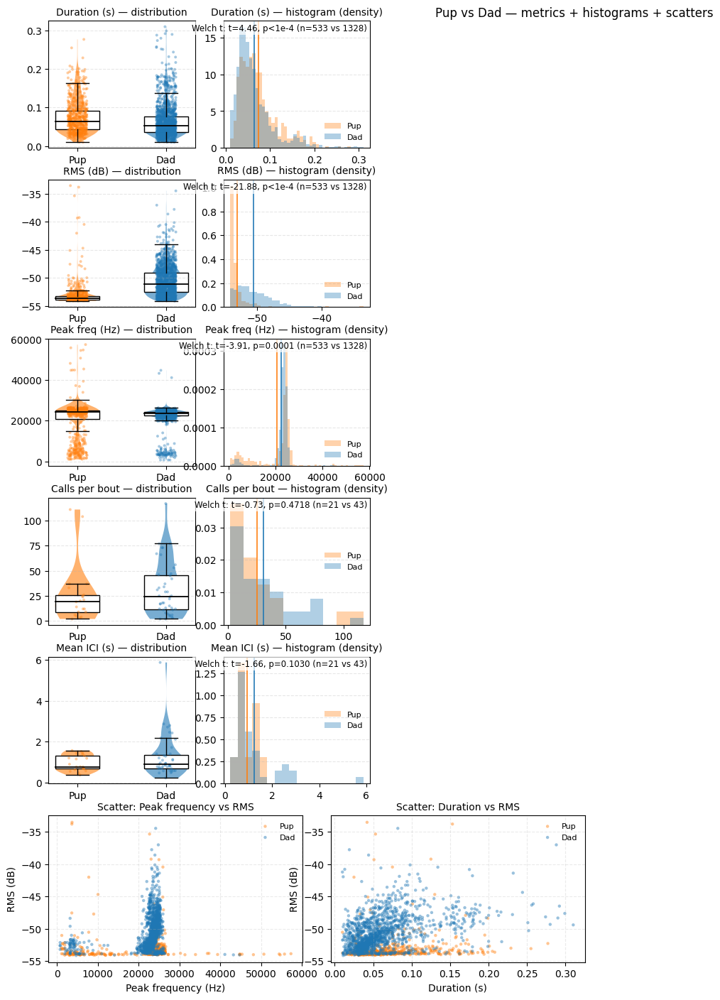

✅ Saved: C:\Users\gg3065\Dropbox\Vocalizations_project\Figures\calls_metrics_compact_grid_separate_sizes.pdf
✅ Saved: C:\Users\gg3065\Dropbox\Vocalizations_project\Figures\calls_metrics_compact_grid_separate_sizes.png


In [5]:
# ============================================================
# Pup vs Dad — compact grid with SEPARATE SIZE CONTROL
#   • 5 "small" rows (3 per-call + 2 per-bout), 2 columns
#   • 1 "scatter" row (2 panels), 2 columns
#   • Independent sizes for small panels vs scatter panels
#   • Full inch-precise control of figure, gaps, margins
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind
import os

# ---------------------- INPUT CHECK ----------------------
assert 'calls_metrics' in globals(), "calls_metrics DataFrame not found. Run the metrics cell first."
req_cols = {'group','bout_id','start_time_experiment_sec','call_dur_s','call_rms_db','peak_freq_hz'}
missing = req_cols - set(calls_metrics.columns)
assert not missing, f"calls_metrics is missing columns: {missing}"

# ---------------------- LAYOUT KNOBS ----------------------
# Whole figure size (inches)
FIG_W, FIG_H = 16.0, 14.0

# White gaps between panels (inches)
GAP_W, GAP_H = 0.40, 0.45

# Outer margins (inches)
MARG_L, MARG_R, MARG_T, MARG_B = 0.60, 0.45, 0.80, 0.65

# Size of "small" panels (inches) — used for the top 5 rows
PAN_SMALL_W, PAN_SMALL_H = 3.0, 2.6

# Size of "scatter" panels (inches) — used for the bottom row
PAN_SCATTER_W, PAN_SCATTER_H = 5.2, 3.0

# Optional aspect locking (set to 1.0 for square-ish; None to disable)
SMALL_BOX_ASPECT   = None
SCATTER_BOX_ASPECT = None

# ---------------------- PLOTTING KNOBS ----------------------
POINT_ALPHA   = 0.4
POINT_SIZE    = 8
VIOLIN_ALPHA  = 0.6
BOX_WIDTH     = 0.5
NBINS_MAX     = 60
SCATTER_SIZE  = 10
SCATTER_ALPHA = 0.45
SCATTER_GROUPS = ['pup', 'dad']   # which groups to show in scatter
DPI_SAVE      = 200
SAVE_PREFIX   = "calls_metrics_compact_grid_separate_sizes"
TITLE         = "Pup vs Dad — metrics + histograms + scatters"

# ---------------------- COLORS & HELPERS ----------------------
def group_color(g: str):
    g = str(g).lower()
    if g == 'dad': return '#1f77b4'      # blue
    if g == 'pup': return '#ff7f0e'      # orange
    if g == 'multiple': return '#7f7f7f' # gray
    if g == 'mom': return '#d62728'      # red
    return '#8c564b'                     # fallback

def fd_bins(x, nbins_max=NBINS_MAX):
    x = np.asarray(x, float)
    x = x[np.isfinite(x)]
    if x.size < 2: return 10
    iqr = np.subtract(*np.percentile(x, [75, 25]))
    if iqr <= 0: return min(10, nbins_max)
    h = 2 * iqr * x.size ** (-1/3)
    if h <= 0: return min(10, nbins_max)
    nb = int(np.ceil((x.max() - x.min()) / h))
    return max(10, min(nb, nbins_max))

def _clean_arrays_from_dict(data_dict):
    labels = list(data_dict.keys())
    arrays = []
    for g in labels:
        arr = np.asarray(data_dict[g], float)
        arr = arr[np.isfinite(arr)]
        arrays.append(arr)
    return labels, arrays

def violin_box_points(ax, data_dict, title):
    labels, arrays = _clean_arrays_from_dict(data_dict)

    # violin
    if any(a.size for a in arrays):
        vparts = ax.violinplot(arrays, showmeans=False, showmedians=False, showextrema=False)
        for i, body in enumerate(vparts['bodies']):
            body.set_facecolor(group_color(labels[i]))
            body.set_alpha(VIOLIN_ALPHA)
            body.set_edgecolor('none')

    # simple box + whiskers
    for i, vals in enumerate(arrays, start=1):
        if vals.size == 0: continue
        q1, med, q3 = np.percentile(vals, [25, 50, 75])
        iqr = q3 - q1
        whisk_lo = np.min(vals[vals >= (q1 - 1.5*iqr)]) if np.any(vals >= (q1 - 1.5*iqr)) else q1
        whisk_hi = np.max(vals[vals <= (q3 + 1.5*iqr)]) if np.any(vals <= (q3 + 1.5*iqr)) else q3
        ax.add_patch(plt.Rectangle((i-BOX_WIDTH/2, q1), BOX_WIDTH, iqr,
                                   facecolor='white', edgecolor='black', linewidth=1))
        ax.plot([i-BOX_WIDTH/2, i+BOX_WIDTH/2], [med, med], color='black', linewidth=1.3)
        ax.plot([i, i], [whisk_lo, q1], color='black', linewidth=1)
        ax.plot([i, i], [q3, whisk_hi], color='black', linewidth=1)
        ax.plot([i-BOX_WIDTH/4, i+BOX_WIDTH/4], [whisk_lo, whisk_lo], color='black', linewidth=1)
        ax.plot([i-BOX_WIDTH/4, i+BOX_WIDTH/4], [whisk_hi, whisk_hi], color='black', linewidth=1)

    # jittered points
    rng = np.random.default_rng(42)
    for i, vals in enumerate(arrays, start=1):
        if vals.size == 0: continue
        xj = i + (rng.random(vals.size) - 0.5) * 0.22
        ax.scatter(xj, vals, s=POINT_SIZE, alpha=POINT_ALPHA, color=group_color(labels[i-1]), edgecolors='none')

    ax.set_xticks(np.arange(1, len(labels)+1))
    ax.set_xticklabels([g.capitalize() for g in labels])
    ax.set_title(title, fontsize=10)
    ax.grid(True, axis='y', linestyle='--', alpha=0.3)

def histogram_overlay_with_t(ax, data_dict, title, nbins_max=NBINS_MAX):
    labels, arrays = _clean_arrays_from_dict(data_dict)
    # common bins
    all_vals = np.concatenate([a for a in arrays if a.size]) if any(a.size for a in arrays) else np.array([])
    if all_vals.size:
        nb = fd_bins(all_vals, nbins_max)
        hist_range = (np.nanmin(all_vals), np.nanmax(all_vals))
    else:
        nb, hist_range = 10, None
    # plot
    for g, arr in zip(labels, arrays):
        if arr.size == 0: continue
        ax.hist(arr, bins=nb, range=hist_range, density=True, alpha=0.35,
                label=g.capitalize(), color=group_color(g), edgecolor='none')
        m = np.nanmean(arr)
        if np.isfinite(m):
            ax.axvline(m, color=group_color(g), linestyle='-', linewidth=1.3, alpha=0.9)
    # Welch t-test Pup vs Dad (if present)
    def pick(name):
        for lbl, arr in zip(labels, arrays):
            if lbl.lower() == name: return arr
        return np.array([])
    pup, dad = pick('pup'), pick('dad')
    if pup.size >= 2 and dad.size >= 2:
        tstat, p = ttest_ind(pup, dad, equal_var=False, nan_policy='omit')
        p_txt = "p<1e-4" if p < 1e-4 else f"p={p:.4f}"
        tt_line = f"Welch t: t={tstat:.2f}, {p_txt} (n={pup.size} vs {dad.size})"
        ax.text(0.98, 0.98, tt_line, transform=ax.transAxes,
                ha='right', va='top', fontsize=8.5, color='black',
                bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', pad=2.0))
    ax.set_title(title, fontsize=10)
    ax.grid(True, axis='y', linestyle='--', alpha=0.3)
    if len(labels) > 0:
        ax.legend(frameon=False, fontsize=8)

# ---------------------- INCH LAYOUT (two heights) ----------------------
def build_axes_grid_two_sizes(
    n_small_rows, n_scatter_rows, ncols,
    FIG_W, FIG_H,
    # sizes:
    PAN_SMALL_W, PAN_SMALL_H,
    PAN_SCATTER_W, PAN_SCATTER_H,
    # spacing:
    GAP_W=0.30, GAP_H=0.30,
    MARG_L=0.6, MARG_R=0.4, MARG_T=0.6, MARG_B=0.6,
    # optional square-ish aspect per section
    SMALL_BOX_ASPECT=None,
    SCATTER_BOX_ASPECT=None,
    facecolor=None
):
    """
    Builds a grid where the top n_small_rows use PAN_SMALL_(W,H),
    and the bottom n_scatter_rows use PAN_SCATTER_(W,H).
    Returns:
      fig, axes_small (n_small_rows x ncols), axes_scatter (n_scatter_rows x ncols)
    If requested sizes don't fit, both sections are uniformly scaled down
    with a single common scale so relative sizes remain consistent.
    """
    import numpy as _np
    # requested total width for ncols (use the wider of the two panel widths)
    req_w = ncols * max(PAN_SMALL_W, PAN_SCATTER_W) + (ncols - 1) * GAP_W
    req_h = (n_small_rows * PAN_SMALL_H +
             n_scatter_rows * PAN_SCATTER_H +
             (n_small_rows + n_scatter_rows - 1) * GAP_H)

    avail_w = FIG_W - (MARG_L + MARG_R)
    avail_h = FIG_H - (MARG_T + MARG_B)

    scale = min(1.0, avail_w / max(1e-9, req_w), avail_h / max(1e-9, req_h))

    psw = PAN_SMALL_W * scale
    psh = PAN_SMALL_H * scale
    pcw = PAN_SCATTER_W * scale
    pch = PAN_SCATTER_H * scale
    gapw = GAP_W
    gaph = GAP_H

    fig = plt.figure(figsize=(FIG_W, FIG_H), constrained_layout=False, facecolor=facecolor)
    axes_small   = _np.empty((n_small_rows, ncols), dtype=object)
    axes_scatter = _np.empty((n_scatter_rows, ncols), dtype=object)

    print(f"Figure: {FIG_W:.2f}×{FIG_H:.2f} in | Scale={scale:.3f}")
    print(f"Small panels used:   {psw:.2f}×{psh:.2f} in   | Scatter panels used: {pcw:.2f}×{pch:.2f} in")
    print(f"Gaps W/H: {gapw:.2f}/{gaph:.2f} in | Margins L/R/T/B: {MARG_L:.2f}/{MARG_R:.2f}/{MARG_T:.2f}/{MARG_B:.2f} in")

    # bottom-left corner (inches) of the whole grid
    cur_bottom = MARG_B

    # TOTAL height of all rows + gaps to place from bottom
    total_rows = n_small_rows + n_scatter_rows
    total_height = (n_small_rows * psh +
                    n_scatter_rows * pch +
                    (total_rows - 1) * gaph)
    # start bottom so that the whole stack fits above MARG_B
    start_bottom = MARG_B
    # draw rows from bottom up; we’ll compute each row’s bottom
    # Row indices for axes_small: 0..n_small_rows-1 (top to bottom in return array)
    # but we’ll place visually from top → bottom
    # For simplicity, we compute from top down:
    top_y = FIG_H - MARG_T

    # place SMALL rows (top block)
    for r in range(n_small_rows):
        # top of this small row:
        row_top_in = top_y - r * (psh + gaph)
        bottom_in = row_top_in - psh
        for c in range(ncols):
            left_in = MARG_L + c * (psw + gapw)
            ax = fig.add_axes([left_in/FIG_W, bottom_in/FIG_H, psw/FIG_W, psh/FIG_H])
            if SMALL_BOX_ASPECT is not None:
                ax.set_box_aspect(SMALL_BOX_ASPECT)
            axes_small[r, c] = ax

    # place SCATTER rows (immediately below the last small row)
    # bottom of the first scatter row:
    first_scatter_bottom = top_y - n_small_rows * (psh + gaph) - pch
    for r in range(n_scatter_rows):
        bottom_in = first_scatter_bottom - r * (pch + gaph)
        for c in range(ncols):
            left_in = MARG_L + c * (pcw + gapw)
            ax = fig.add_axes([left_in/FIG_W, bottom_in/FIG_H, pcw/FIG_W, pch/FIG_H])
            if SCATTER_BOX_ASPECT is not None:
                ax.set_box_aspect(SCATTER_BOX_ASPECT)
            axes_scatter[r, c] = ax

    return fig, axes_small, axes_scatter

# ---------------------- DATA PREP ----------------------
all_groups = list(pd.unique(calls_metrics['group'].astype(str)))
preferred  = ['pup','dad','multiple','mom']
groups = [g for g in preferred if g in all_groups] + [g for g in all_groups if g not in preferred]

# per-call data
per_call_specs = [
    ("Duration (s)",    "call_dur_s"),
    ("RMS (dB)",        "call_rms_db"),
    ("Peak freq (Hz)",  "peak_freq_hz"),
]
per_call_data = [
    (title, {g: calls_metrics.loc[(calls_metrics['group']==g) & np.isfinite(calls_metrics[col]), col].to_numpy()
             for g in groups})
    for (title, col) in per_call_specs
]

# per-bout data
# bout group map
bout_group = (
    calls_metrics[['bout_id','group']]
    .drop_duplicates('bout_id')
    .set_index('bout_id')['group']
)
# calls per bout
calls_per_bout = (
    calls_metrics.groupby('bout_id', as_index=True)
    .size()
    .rename('calls_per_bout')
    .to_frame()
)
# mean ICI per bout via diffs
_tmp = (
    calls_metrics[['bout_id','start_time_experiment_sec']]
    .dropna()
    .sort_values(['bout_id','start_time_experiment_sec'])
)
_tmp['dt'] = _tmp.groupby('bout_id')['start_time_experiment_sec'].diff()
mean_ici = (
    _tmp.groupby('bout_id')['dt'].mean()
    .rename('mean_ici_s')
    .to_frame()
)
bout_metrics = calls_per_bout.join(mean_ici, how='outer')
bout_metrics['group'] = bout_group.reindex(bout_metrics.index).values
bout_metrics = bout_metrics.reset_index().query('group in @groups')

per_bout_specs = [
    ("Calls per bout",  "calls_per_bout"),
    ("Mean ICI (s)",    "mean_ici_s"),
]
per_bout_data = [
    (title, {g: bout_metrics.loc[(bout_metrics['group']==g) & np.isfinite(bout_metrics[col]), col].to_numpy()
             for g in groups})
    for (title, col) in per_bout_specs
]

# scatter data
df_sc_peak_rms = calls_metrics.loc[
    calls_metrics['group'].str.lower().isin(SCATTER_GROUPS),
    ['group','call_rms_db','peak_freq_hz']
].dropna()
df_sc_dur_rms = calls_metrics.loc[
    calls_metrics['group'].str.lower().isin(SCATTER_GROUPS),
    ['group','call_rms_db','call_dur_s']
].dropna()

# ---------------------- LAYOUT & PLOTTING ----------------------
n_small_rows  = len(per_call_data) + len(per_bout_data)  # 5 rows
n_scatter_rows = 1                                       # 1 row of 2 scatters
n_cols = 2

fig, axes_small, axes_scatter = build_axes_grid_two_sizes(
    n_small_rows=n_small_rows,
    n_scatter_rows=n_scatter_rows,
    ncols=n_cols,
    FIG_W=FIG_W, FIG_H=FIG_H,
    PAN_SMALL_W=PAN_SMALL_W, PAN_SMALL_H=PAN_SMALL_H,
    PAN_SCATTER_W=PAN_SCATTER_W, PAN_SCATTER_H=PAN_SCATTER_H,
    GAP_W=GAP_W, GAP_H=GAP_H,
    MARG_L=MARG_L, MARG_R=MARG_R, MARG_T=MARG_T, MARG_B=MARG_B,
    SMALL_BOX_ASPECT=SMALL_BOX_ASPECT,
    SCATTER_BOX_ASPECT=SCATTER_BOX_ASPECT
)

# Fill small panels
rows_iter = list(per_call_data) + list(per_bout_data)
for r, (title, data_dict) in enumerate(rows_iter):
    ax1 = axes_small[r, 0]
    ax2 = axes_small[r, 1]
    violin_box_points(ax1, data_dict, f"{title} — distribution")
    histogram_overlay_with_t(ax2, data_dict, f"{title} — histogram (density)")

# Scatter panels (single row)
axL, axR = axes_scatter[0, 0], axes_scatter[0, 1]

# Left scatter: Peak freq vs RMS
for g in SCATTER_GROUPS:
    sub = df_sc_peak_rms.loc[df_sc_peak_rms['group'].str.lower()==g]
    if len(sub) == 0: continue
    axL.scatter(
        sub['peak_freq_hz'].to_numpy(dtype=float),
        sub['call_rms_db'].to_numpy(dtype=float),
        s=SCATTER_SIZE, alpha=SCATTER_ALPHA, color=group_color(g),
        edgecolors='none', label=g.capitalize()
    )
axL.set_xlabel("Peak frequency (Hz)")
axL.set_ylabel("RMS (dB)")
axL.set_title("Scatter: Peak frequency vs RMS", fontsize=10)
axL.grid(True, linestyle='--', alpha=0.25)
if set(df_sc_peak_rms['group'].str.lower().unique()) & set(SCATTER_GROUPS):
    axL.legend(frameon=False, fontsize=8, loc='best')

# Right scatter: Duration vs RMS
for g in SCATTER_GROUPS:
    sub = df_sc_dur_rms.loc[df_sc_dur_rms['group'].str.lower()==g]
    if len(sub) == 0: continue
    axR.scatter(
        sub['call_dur_s'].to_numpy(dtype=float),
        sub['call_rms_db'].to_numpy(dtype=float),
        s=SCATTER_SIZE, alpha=SCATTER_ALPHA, color=group_color(g),
        edgecolors='none', label=g.capitalize()
    )
axR.set_xlabel("Duration (s)")
axR.set_ylabel("RMS (dB)")
axR.set_title("Scatter: Duration vs RMS", fontsize=10)
axR.grid(True, linestyle='--', alpha=0.25)
if set(df_sc_dur_rms['group'].str.lower().unique()) & set(SCATTER_GROUPS):
    axR.legend(frameon=False, fontsize=8, loc='best')

# Figure title + save
fig.text(0.5, 1 - (MARG_T - 0.2)/FIG_H, TITLE, ha='center', va='top', fontsize=12)
out_pdf = os.path.join(figs_path, f"{SAVE_PREFIX}.pdf") if 'figs_path' in globals() else f"{SAVE_PREFIX}.pdf"
out_png = os.path.join(figs_path, f"{SAVE_PREFIX}.png") if 'figs_path' in globals() else f"{SAVE_PREFIX}.png"
fig.savefig(out_pdf, dpi=DPI_SAVE, bbox_inches='tight')
fig.savefig(out_png, dpi=DPI_SAVE, bbox_inches='tight')
plt.show()
print(f"✅ Saved: {out_pdf}\n✅ Saved: {out_png}")


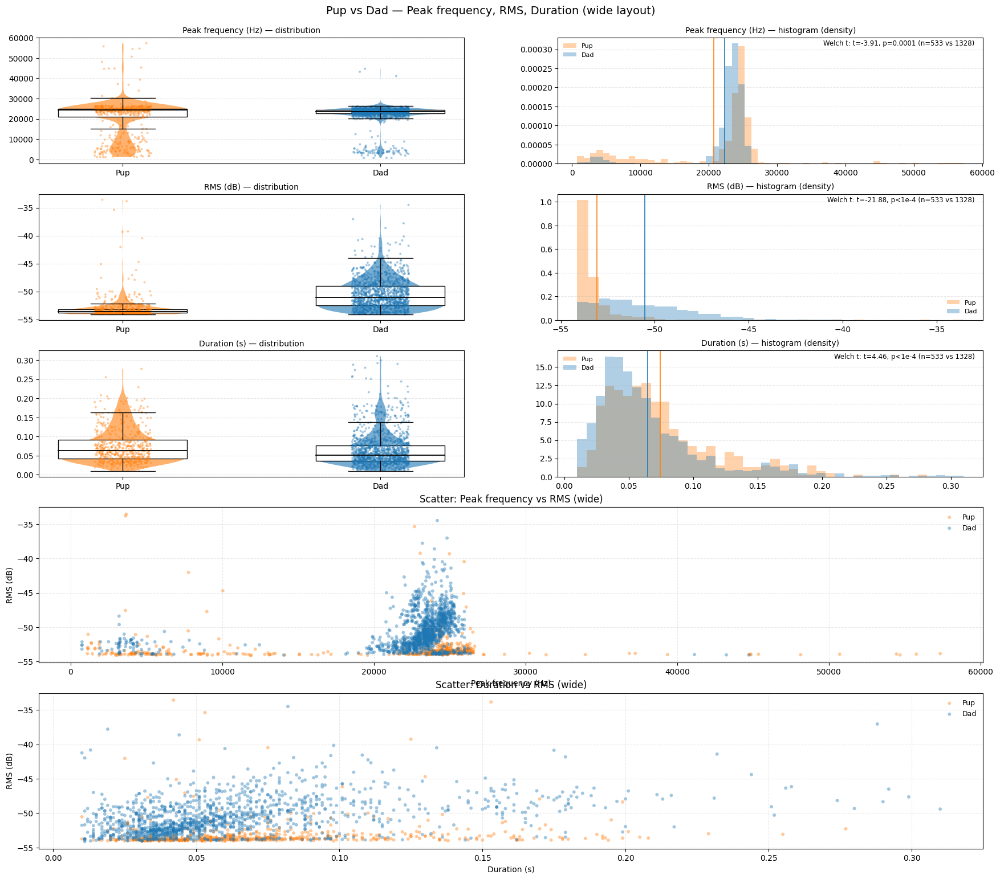

✅ Saved: C:\Users\gg3065\Dropbox\Vocalizations_project\Figures\calls_peak_rms_duration_wide.pdf
✅ Saved: C:\Users\gg3065\Dropbox\Vocalizations_project\Figures\calls_peak_rms_duration_wide.png


In [6]:
# ============================================================
# Peak freq, RMS, Duration — WIDE LAYOUT
#   Rows 1–3: each metric gets (violin/box) + (histogram)
#   Rows 4–5: two wide scatters (Peak↔RMS, Duration↔RMS)
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

assert 'calls_metrics' in globals(), "calls_metrics DataFrame not found."

# --- Choose groups + prep dicts (keep your color scheme) ---
all_groups = list(pd.unique(calls_metrics['group'].astype(str)))
preferred  = ['pup','dad','multiple','mom']
groups = [g for g in preferred if g in all_groups] + [g for g in all_groups if g not in preferred]

peak_dict = {
    g: calls_metrics.loc[(calls_metrics['group']==g) & np.isfinite(calls_metrics['peak_freq_hz']), 'peak_freq_hz'].to_numpy()
    for g in groups
}
rms_dict  = {
    g: calls_metrics.loc[(calls_metrics['group']==g) & np.isfinite(calls_metrics['call_rms_db']), 'call_rms_db'].to_numpy()
    for g in groups
}
dur_dict  = {
    g: calls_metrics.loc[(calls_metrics['group']==g) & np.isfinite(calls_metrics['call_dur_s']), 'call_dur_s'].to_numpy()
    for g in groups
}

# For scatters, usually just pup/dad
SCATTER_GROUPS = ['pup', 'dad']
mask_sc = calls_metrics['group'].str.lower().isin([g.lower() for g in SCATTER_GROUPS])

df_sc_peak_rms = calls_metrics.loc[mask_sc, ['group','peak_freq_hz','call_rms_db']].dropna()
df_sc_dur_rms  = calls_metrics.loc[mask_sc, ['group','call_dur_s','call_rms_db']].dropna()

# --- Figure geometry: extra wide & tall to spread nicely ---
FIG_W, FIG_H = 18.0, 16.0
LEFT, RIGHT, TOP, BOT = 0.06, 0.98, 0.96, 0.07
WSPACE, HSPACE = 0.22, 0.22

fig = plt.figure(figsize=(FIG_W, FIG_H))
gs  = GridSpec(
    nrows=5, ncols=2, figure=fig,
    height_ratios=[3.0, 3.0, 3.0, 3.7, 3.7],  # roomy, with bigger scatters
    width_ratios=[1.0, 1.0],
    left=LEFT, right=RIGHT, top=TOP, bottom=BOT,
    wspace=WSPACE, hspace=HSPACE
)

# ---- Row 1: Peak frequency
ax_pf_dist = fig.add_subplot(gs[0, 0])
ax_pf_hist = fig.add_subplot(gs[0, 1])
violin_box_points(ax_pf_dist, peak_dict, "Peak frequency (Hz) — distribution")
histogram_overlay_with_t(ax_pf_hist, peak_dict, "Peak frequency (Hz) — histogram (density)")

# ---- Row 2: RMS
ax_rms_dist = fig.add_subplot(gs[1, 0])
ax_rms_hist = fig.add_subplot(gs[1, 1])
violin_box_points(ax_rms_dist, rms_dict, "RMS (dB) — distribution")
histogram_overlay_with_t(ax_rms_hist, rms_dict, "RMS (dB) — histogram (density)")

# ---- Row 3: Duration
ax_dur_dist = fig.add_subplot(gs[2, 0])
ax_dur_hist = fig.add_subplot(gs[2, 1])
violin_box_points(ax_dur_dist, dur_dict, "Duration (s) — distribution")
histogram_overlay_with_t(ax_dur_hist, dur_dict, "Duration (s) — histogram (density)")

# ---- Row 4: Wide scatter (Peak freq vs RMS)
ax_sc1 = fig.add_subplot(gs[3, :])
for g in SCATTER_GROUPS:
    sub = df_sc_peak_rms.loc[df_sc_peak_rms['group'].str.lower()==g.lower()]
    if len(sub) == 0:
        continue
    ax_sc1.scatter(
        sub['peak_freq_hz'].to_numpy(dtype=float),
        sub['call_rms_db'].to_numpy(dtype=float),
        s=18, alpha=0.42, edgecolors='none', color=group_color(g),
        label=g.capitalize()
    )
ax_sc1.set_xlabel("Peak frequency (Hz)")
ax_sc1.set_ylabel("RMS (dB)")
ax_sc1.set_title("Scatter: Peak frequency vs RMS (wide)")
ax_sc1.grid(True, linestyle='--', alpha=0.28)
if set(df_sc_peak_rms['group'].str.lower().unique()) & set([g.lower() for g in SCATTER_GROUPS]):
    ax_sc1.legend(frameon=False, fontsize=9, loc='best')

# ---- Row 5: Wide scatter (Duration vs RMS)
ax_sc2 = fig.add_subplot(gs[4, :])
for g in SCATTER_GROUPS:
    sub = df_sc_dur_rms.loc[df_sc_dur_rms['group'].str.lower()==g.lower()]
    if len(sub) == 0:
        continue
    ax_sc2.scatter(
        sub['call_dur_s'].to_numpy(dtype=float),
        sub['call_rms_db'].to_numpy(dtype=float),
        s=18, alpha=0.42, edgecolors='none', color=group_color(g),
        label=g.capitalize()
    )
ax_sc2.set_xlabel("Duration (s)")
ax_sc2.set_ylabel("RMS (dB)")
ax_sc2.set_title("Scatter: Duration vs RMS (wide)")
ax_sc2.grid(True, linestyle='--', alpha=0.28)
if set(df_sc_dur_rms['group'].str.lower().unique()) & set([g.lower() for g in SCATTER_GROUPS]):
    ax_sc2.legend(frameon=False, fontsize=9, loc='best')

# ---- Global title + save
fig.suptitle("Pup vs Dad — Peak frequency, RMS, Duration (wide layout)", y=0.995, fontsize=14)
out_pdf = os.path.join(figs_path, "calls_peak_rms_duration_wide.pdf") if 'figs_path' in globals() else "calls_peak_rms_duration_wide.pdf"
out_png = os.path.join(figs_path, "calls_peak_rms_duration_wide.png") if 'figs_path' in globals() else "calls_peak_rms_duration_wide.png"
fig.savefig(out_pdf, dpi=220, bbox_inches='tight')
fig.savefig(out_png, dpi=220, bbox_inches='tight')
plt.show()
print(f"✅ Saved: {out_pdf}\n✅ Saved: {out_png}")


Figure: 20.00×18.00 in | Panel req: 5.00×5.00 in → used: 1.98×1.98 (scale=0.395)
Gaps W/H: 0.90/0.95 in | Margins L/R/T/B: 0.60/0.40/0.80/0.60 in


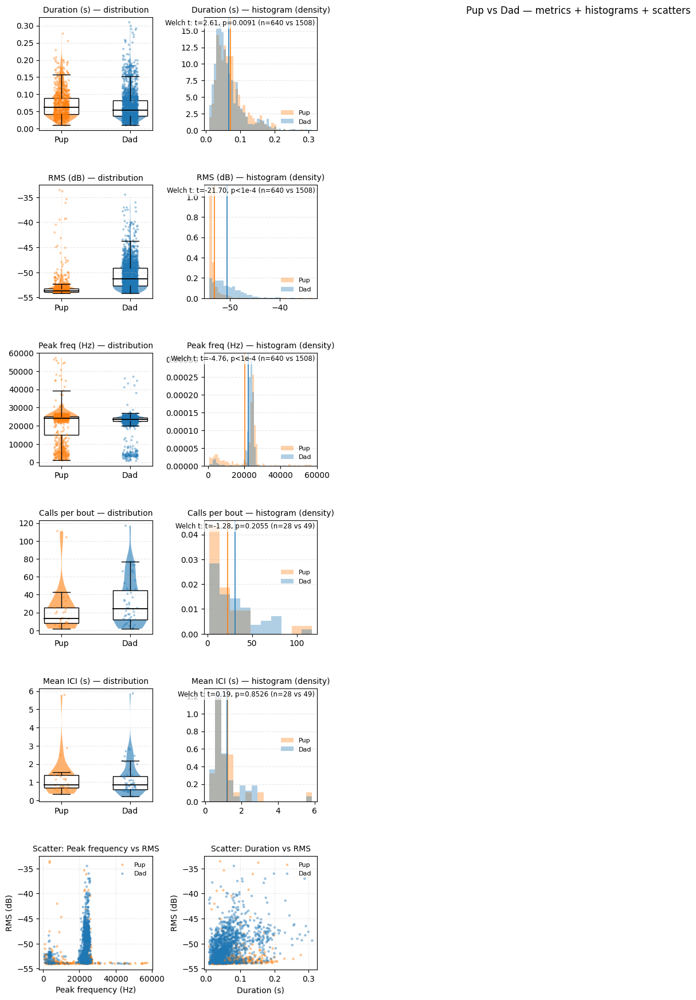

✅ Saved: C:\Users\gg3065\Dropbox\Vocalizations_project\Figures\calls_metrics_compact_grid.pdf
✅ Saved: C:\Users\gg3065\Dropbox\Vocalizations_project\Figures\calls_metrics_compact_grid.png


In [63]:
# ============================================================
# Pup vs Dad — metrics + histograms (with Welch t-tests) + 2 scatters
# FULL INCH-CONTROL LAYOUT: figure size, panel size, white gaps & margins
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind
import os

# ---------------------- LAYOUT KNOBS (tweak these) ----------------------
# Whole figure size (inches)
FIG_W, FIG_H = 20,18

# Size of each panel (inches). All panels are identical size.
PAN_W, PAN_H = 5, 5

# White space between panels (inches)
GAP_W, GAP_H = 0.90, 0.95

# Outer margins (inches)
MARG_L, MARG_R, MARG_T, MARG_B = 0.6, 0.4, 0.8, 0.6

# Make axes boxes “square-ish” in display space (1.0 = square). Set to None to disable.
PANEL_BOX_ASPECT = 1.0

# ---------------------- PLOTTING KNOBS ----------------------
POINT_ALPHA   = 0.4
POINT_SIZE    = 8
VIOLIN_ALPHA  = 0.6
BOX_WIDTH     = 0.5
NBINS_MAX     = 60
SCATTER_SIZE  = 10
SCATTER_ALPHA = 0.45
SCATTER_GROUPS = ['pup', 'dad']   # which groups appear in the scatter panels
DPI_SAVE      = 200
SAVE_PREFIX   = "calls_metrics_compact_grid"
TITLE         = "Pup vs Dad — metrics + histograms + scatters"

# ---------------------- INPUTS & CHECKS ----------------------
assert 'calls_metrics' in globals(), "calls_metrics DataFrame not found. Run the metrics cell first."
req_cols = {'group','bout_id','start_time_experiment_sec','call_dur_s','call_rms_db','peak_freq_hz'}
missing = req_cols - set(calls_metrics.columns)
assert not missing, f"calls_metrics is missing columns: {missing}"

# ---------------------- UTILITIES ----------------------
def group_color(g: str):
    g = str(g).lower()
    if g == 'dad': return '#1f77b4'      # blue
    if g == 'pup': return '#ff7f0e'      # orange
    if g == 'multiple': return '#7f7f7f' # gray
    if g == 'mom': return '#d62728'      # red
    return '#8c564b'                     # fallback

def fd_bins(x, nbins_max=NBINS_MAX):
    x = np.asarray(x, float)
    x = x[np.isfinite(x)]
    if x.size < 2: return 10
    iqr = np.subtract(*np.percentile(x, [75, 25]))
    if iqr <= 0: return min(10, nbins_max)
    h = 2 * iqr * x.size ** (-1/3)
    if h <= 0: return min(10, nbins_max)
    nb = int(np.ceil((x.max() - x.min()) / h))
    return max(10, min(nb, nbins_max))

def _clean_arrays_from_dict(data_dict):
    labels = list(data_dict.keys())
    arrays = []
    for g in labels:
        arr = np.asarray(data_dict[g], float)
        arr = arr[np.isfinite(arr)]
        arrays.append(arr)
    return labels, arrays

def violin_box_points(ax, data_dict, title):
    labels, arrays = _clean_arrays_from_dict(data_dict)

    # violin
    if any(a.size for a in arrays):
        vparts = ax.violinplot(arrays, showmeans=False, showmedians=False, showextrema=False)
        for i, body in enumerate(vparts['bodies']):
            body.set_facecolor(group_color(labels[i]))
            body.set_alpha(VIOLIN_ALPHA)
            body.set_edgecolor('none')

    # box (simple)
    for i, vals in enumerate(arrays, start=1):
        if vals.size == 0: continue
        q1, med, q3 = np.percentile(vals, [25, 50, 75])
        iqr = q3 - q1
        whisk_lo = np.min(vals[vals >= (q1 - 1.5*iqr)]) if np.any(vals >= (q1 - 1.5*iqr)) else q1
        whisk_hi = np.max(vals[vals <= (q3 + 1.5*iqr)]) if np.any(vals <= (q3 + 1.5*iqr)) else q3
        ax.add_patch(plt.Rectangle((i-BOX_WIDTH/2, q1), BOX_WIDTH, iqr,
                                   facecolor='white', edgecolor='black', linewidth=1))
        ax.plot([i-BOX_WIDTH/2, i+BOX_WIDTH/2], [med, med], color='black', linewidth=1.3)
        ax.plot([i, i], [whisk_lo, q1], color='black', linewidth=1)
        ax.plot([i, i], [q3, whisk_hi], color='black', linewidth=1)
        ax.plot([i-BOX_WIDTH/4, i+BOX_WIDTH/4], [whisk_lo, whisk_lo], color='black', linewidth=1)
        ax.plot([i-BOX_WIDTH/4, i+BOX_WIDTH/4], [whisk_hi, whisk_hi], color='black', linewidth=1)

    # jittered points
    rng = np.random.default_rng(42)
    for i, vals in enumerate(arrays, start=1):
        if vals.size == 0: continue
        xj = i + (rng.random(vals.size) - 0.5) * 0.22
        ax.scatter(xj, vals, s=POINT_SIZE, alpha=POINT_ALPHA, color=group_color(labels[i-1]), edgecolors='none')

    ax.set_xticks(np.arange(1, len(labels)+1))
    ax.set_xticklabels([g.capitalize() for g in labels])
    ax.set_title(title, fontsize=10)
    ax.grid(True, axis='y', linestyle='--', alpha=0.3)

def histogram_overlay_with_t(ax, data_dict, title, nbins_max=NBINS_MAX):
    labels, arrays = _clean_arrays_from_dict(data_dict)

    # common binning across groups
    all_vals = np.concatenate([a for a in arrays if a.size]) if any(a.size for a in arrays) else np.array([])
    if all_vals.size:
        nb = fd_bins(all_vals, nbins_max)
        hist_range = (np.nanmin(all_vals), np.nanmax(all_vals))
    else:
        nb, hist_range = 10, None

    # plot
    for g, arr in zip(labels, arrays):
        if arr.size == 0: continue
        ax.hist(arr, bins=nb, range=hist_range, density=True, alpha=0.35,
                label=g.capitalize(), color=group_color(g), edgecolor='none')
        m = np.nanmean(arr)
        if np.isfinite(m):
            ax.axvline(m, color=group_color(g), linestyle='-', linewidth=1.3, alpha=0.9)

    # Welch t-test (Pup vs Dad)
    def pick(name):
        for lbl, arr in zip(labels, arrays):
            if lbl.lower() == name: return arr
        return np.array([])
    pup, dad = pick('pup'), pick('dad')
    if pup.size >= 2 and dad.size >= 2:
        tstat, p = ttest_ind(pup, dad, equal_var=False, nan_policy='omit')
        p_txt = "p<1e-4" if p < 1e-4 else f"p={p:.4f}"
        tt_line = f"Welch t: t={tstat:.2f}, {p_txt} (n={pup.size} vs {dad.size})"
        ax.text(0.98, 0.98, tt_line, transform=ax.transAxes,
                ha='right', va='top', fontsize=8.5, color='black',
                bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', pad=2.0))

    ax.set_title(title, fontsize=10)
    ax.grid(True, axis='y', linestyle='--', alpha=0.3)
    ax.legend(frameon=False, fontsize=8)

def build_axes_grid_by_inches(
    nrows, ncols,
    FIG_W, FIG_H,            # figure size (inches)
    PAN_W, PAN_H,            # desired panel size (inches)
    GAP_W=0.30, GAP_H=0.30,  # white gaps between panels (inches)
    MARG_L=0.6, MARG_R=0.4,
    MARG_T=0.6, MARG_B=0.6,
    box_aspect=None,
    facecolor=None
):
    """
    Returns: (fig, axes) where axes is (nrows, ncols) array of Axes.
    If requested panel sizes don't fit, they are scaled down uniformly.
    """
    import numpy as _np
    # Available area for all panels
    avail_w = FIG_W - (MARG_L + MARG_R) - (ncols - 1) * GAP_W
    avail_h = FIG_H - (MARG_T + MARG_B) - (nrows - 1) * GAP_H

    req_w = ncols * PAN_W
    req_h = nrows * PAN_H

    scale_w = min(1.0, avail_w / max(1e-9, req_w))
    scale_h = min(1.0, avail_h / max(1e-9, req_h))
    scale = min(scale_w, scale_h)

    pan_w = PAN_W * scale
    pan_h = PAN_H * scale

    fig = plt.figure(figsize=(FIG_W, FIG_H), constrained_layout=False, facecolor=facecolor)
    axes = _np.empty((nrows, ncols), dtype=object)

    print(f"Figure: {FIG_W:.2f}×{FIG_H:.2f} in | Panel req: {PAN_W:.2f}×{PAN_H:.2f} in → used: {pan_w:.2f}×{pan_h:.2f} (scale={scale:.3f})")
    print(f"Gaps W/H: {GAP_W:.2f}/{GAP_H:.2f} in | Margins L/R/T/B: {MARG_L:.2f}/{MARG_R:.2f}/{MARG_T:.2f}/{MARG_B:.2f} in")

    for r in range(nrows):
        for c in range(ncols):
            left_in   = MARG_L + c * (pan_w + GAP_W)
            bottom_in = MARG_B + (nrows - 1 - r) * (pan_h + GAP_H)
            left, bottom = left_in / FIG_W, bottom_in / FIG_H
            width, height = pan_w / FIG_W, pan_h / FIG_H
            ax = fig.add_axes([left, bottom, width, height])
            if box_aspect is not None:
                ax.set_box_aspect(box_aspect)
            axes[r, c] = ax
    return fig, axes

# ---------------------- DATA PREP ----------------------
# group order
all_groups = list(pd.unique(calls_metrics['group'].astype(str)))
preferred  = ['pup','dad','multiple','mom']
groups = [g for g in preferred if g in all_groups] + [g for g in all_groups if g not in preferred]

# per-call data
per_call_specs = [
    ("Duration (s)",    "call_dur_s"),
    ("RMS (dB)",        "call_rms_db"),
    ("Peak freq (Hz)",  "peak_freq_hz"),
]
per_call_data = [
    (title, {g: calls_metrics.loc[(calls_metrics['group']==g) & np.isfinite(calls_metrics[col]), col].to_numpy()
             for g in groups})
    for (title, col) in per_call_specs
]

# per-bout data (no deprecation warnings, no overlapping 'group' columns)
# map bout_id → group
bout_group = (
    calls_metrics[['bout_id','group']]
    .drop_duplicates('bout_id')
    .set_index('bout_id')['group']
)
# calls per bout
calls_per_bout = (
    calls_metrics.groupby('bout_id', as_index=True)
    .size()
    .rename('calls_per_bout')
    .to_frame()
)
# mean ICI per bout
_tmp = (
    calls_metrics[['bout_id','start_time_experiment_sec']]
    .dropna()
    .sort_values(['bout_id','start_time_experiment_sec'])
)
_tmp['dt'] = _tmp.groupby('bout_id')['start_time_experiment_sec'].diff()
mean_ici = (
    _tmp.groupby('bout_id')['dt'].mean()
    .rename('mean_ici_s')
    .to_frame()
)
bout_metrics = calls_per_bout.join(mean_ici, how='outer')           # index=bout_id
bout_metrics['group'] = bout_group.reindex(bout_metrics.index).values
bout_metrics = bout_metrics.reset_index().query('group in @groups')

per_bout_specs = [
    ("Calls per bout",  "calls_per_bout"),
    ("Mean ICI (s)",    "mean_ici_s"),
]
per_bout_data = [
    (title, {g: bout_metrics.loc[(bout_metrics['group']==g) & np.isfinite(bout_metrics[col]), col].to_numpy()
             for g in groups})
    for (title, col) in per_bout_specs
]

# scatter data (one row containing two panels)
df_sc_peak_rms = calls_metrics.loc[
    calls_metrics['group'].str.lower().isin(SCATTER_GROUPS),
    ['group','call_rms_db','peak_freq_hz']
].dropna()

df_sc_dur_rms = calls_metrics.loc[
    calls_metrics['group'].str.lower().isin(SCATTER_GROUPS),
    ['group','call_rms_db','call_dur_s']
].dropna()

# ---------------------- LAYOUT & PLOTTING ----------------------
# rows: 3 per-call + 2 per-bout + 1 scatter row = 6 rows, 2 columns
n_small_rows = len(per_call_data) + len(per_bout_data)  # 5
n_rows_total = n_small_rows + 1                         # +1 row with two scatter panels
n_cols = 2

fig, axes = build_axes_grid_by_inches(
    nrows=n_rows_total, ncols=n_cols,
    FIG_W=FIG_W, FIG_H=FIG_H,
    PAN_W=PAN_W, PAN_H=PAN_H,
    GAP_W=GAP_W, GAP_H=GAP_H,
    MARG_L=MARG_L, MARG_R=MARG_R, MARG_T=MARG_T, MARG_B=MARG_B,
    box_aspect=PANEL_BOX_ASPECT
)

# small panels
rows_iter = list(per_call_data) + list(per_bout_data)
for r, (title, data_dict) in enumerate(rows_iter):
    ax1 = axes[r, 0]
    ax2 = axes[r, 1]
    violin_box_points(ax1, data_dict, f"{title} — distribution")
    histogram_overlay_with_t(ax2, data_dict, f"{title} — histogram (density)")

# scatter row
r_sc = n_small_rows

# Left scatter: Peak freq vs RMS
axL = axes[r_sc, 0]
for g in SCATTER_GROUPS:
    sub = df_sc_peak_rms.loc[df_sc_peak_rms['group'].str.lower()==g]
    if len(sub) == 0: continue
    axL.scatter(
        sub['peak_freq_hz'].to_numpy(dtype=float),
        sub['call_rms_db'].to_numpy(dtype=float),
        s=SCATTER_SIZE, alpha=SCATTER_ALPHA, color=group_color(g), edgecolors='none', label=g.capitalize()
    )
axL.set_xlabel("Peak frequency (Hz)")
axL.set_ylabel("RMS (dB)")
axL.set_title("Scatter: Peak frequency vs RMS", fontsize=10)
axL.grid(True, linestyle='--', alpha=0.25)
if set(df_sc_peak_rms['group'].str.lower().unique()) & set(SCATTER_GROUPS):
    axL.legend(frameon=False, fontsize=8, loc='best')

# Right scatter: Duration vs RMS
axR = axes[r_sc, 1]
for g in SCATTER_GROUPS:
    sub = df_sc_dur_rms.loc[df_sc_dur_rms['group'].str.lower()==g]
    if len(sub) == 0: continue
    axR.scatter(
        sub['call_dur_s'].to_numpy(dtype=float),
        sub['call_rms_db'].to_numpy(dtype=float),
        s=SCATTER_SIZE, alpha=SCATTER_ALPHA, color=group_color(g), edgecolors='none', label=g.capitalize()
    )
axR.set_xlabel("Duration (s)")
axR.set_ylabel("RMS (dB)")
axR.set_title("Scatter: Duration vs RMS", fontsize=10)
axR.grid(True, linestyle='--', alpha=0.25)
if set(df_sc_peak_rms['group'].str.lower().unique()) & set(SCATTER_GROUPS):
    axR.legend(frameon=False, fontsize=8, loc='best')

# title + save
fig.text(0.5, 1 - (MARG_T - 0.2)/FIG_H, TITLE, ha='center', va='top', fontsize=12)
out_pdf = os.path.join(figs_path, f"{SAVE_PREFIX}.pdf") if 'figs_path' in globals() else f"{SAVE_PREFIX}.pdf"
out_png = os.path.join(figs_path, f"{SAVE_PREFIX}.png") if 'figs_path' in globals() else f"{SAVE_PREFIX}.png"
fig.savefig(out_pdf, dpi=DPI_SAVE, bbox_inches='tight')
fig.savefig(out_png, dpi=DPI_SAVE, bbox_inches='tight')
plt.show()
print(f"✅ Saved: {out_pdf}\n✅ Saved: {out_png}")


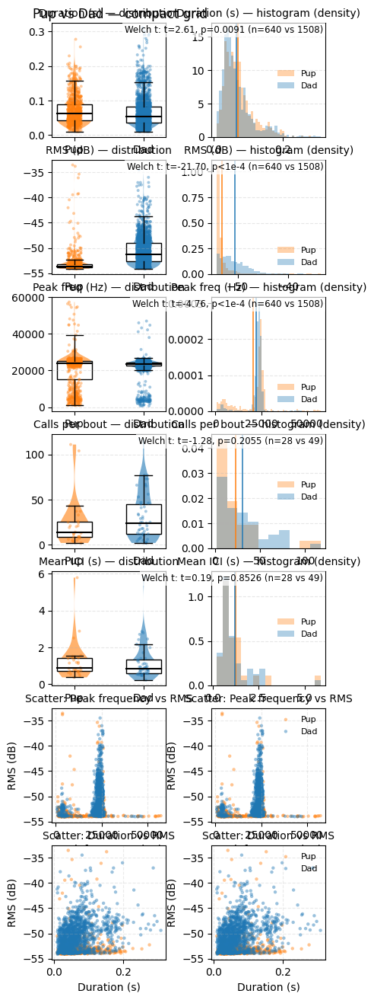

✅ Saved: C:\Users\gg3065\Dropbox\Vocalizations_project\Figures\compact_calls_metrics_grid.pdf
✅ Saved: C:\Users\gg3065\Dropbox\Vocalizations_project\Figures\compact_calls_metrics_grid.png
(Tweak PAN_W/PAN_H for panel size • GAP_W/GAP_H for spacing • PANEL_ASPECT for square-ish boxes)


In [55]:
# ============================================================
# Pup vs Dad — compact grid (ALL PANELS SAME SIZE, easy sizing)
# - Violins + Hist (with Welch t-tests)
# - Two scatter panels (Peak Freq vs RMS, Duration vs RMS)
# - Simple knobs to control panel size/aspect and spacing
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from scipy.stats import ttest_ind
import os

# ---------- SIZING / STYLE KNOBS ----------
PAN_W = 1.5          # width (inches) of each panel
PAN_H = 1.5          # height (inches) of each panel
PANEL_ASPECT = 1.0   # 1.0 makes each axes box square-ish in screen space
GAP_W = 0.60         # horizontal gap between panels (inches)
GAP_H = 0.30         # vertical gap between panels (inches)
MARG_L = 0.01         # figure margins (inches)
MARG_R = 0.2
MARG_T = 0.6
MARG_B = 0.6

# Plot cosmetics
POINT_ALPHA = 0.4
POINT_SIZE = 8
VIOLIN_ALPHA = 0.6
BOX_WIDTH = 0.5
NBINS_MAX = 60
SCATTER_SIZE = 10
SCATTER_ALPHA = 0.45
SCATTER_GROUPS = ['pup', 'dad']
DPI_SAVE = 200
SAVE_PREFIX = "compact_calls_metrics_grid"

# ---------- INPUTS ----------
assert 'calls_metrics' in globals(), "calls_metrics DataFrame not found. Run the metrics cell first."
req_cols = {'group','bout_id','start_time_experiment_sec','call_dur_s','call_rms_db','peak_freq_hz'}
missing = req_cols - set(calls_metrics.columns)
assert not missing, f"calls_metrics is missing columns: {missing}"

# ---------- helpers ----------
def group_color(g: str):
    g = str(g).lower()
    if g == 'dad': return '#1f77b4'
    if g == 'pup': return '#ff7f0e'
    if g == 'multiple': return '#7f7f7f'
    if g == 'mom': return '#d62728'
    return '#8c564b'

def fd_bins(x, nbins_max=NBINS_MAX):
    x = np.asarray(x, float)
    x = x[np.isfinite(x)]
    if x.size < 2: return 10
    iqr = np.subtract(*np.percentile(x, [75, 25]))
    if iqr <= 0: return min(10, nbins_max)
    h = 2 * iqr * x.size ** (-1/3)
    if h <= 0: return min(10, nbins_max)
    nb = int(np.ceil((x.max() - x.min()) / h))
    return max(10, min(nb, nbins_max))

def _clean_arrays_from_dict(data_dict):
    labels = list(data_dict.keys())
    arrays = []
    for g in labels:
        arr = np.asarray(data_dict[g], float)
        arr = arr[np.isfinite(arr)]
        arrays.append(arr)
    return labels, arrays

def violin_box_points(ax, data_dict, title):
    labels, arrays = _clean_arrays_from_dict(data_dict)
    # violin
    if any(a.size for a in arrays):
        vparts = ax.violinplot(arrays, showmeans=False, showmedians=False, showextrema=False)
        for i, body in enumerate(vparts['bodies']):
            body.set_facecolor(group_color(labels[i]))
            body.set_alpha(VIOLIN_ALPHA)
            body.set_edgecolor('none')
    # box
    for i, vals in enumerate(arrays, start=1):
        if vals.size == 0: continue
        q1, med, q3 = np.percentile(vals, [25, 50, 75])
        iqr = q3 - q1
        whisk_lo = np.min(vals[vals >= (q1 - 1.5*iqr)]) if np.any(vals >= (q1 - 1.5*iqr)) else q1
        whisk_hi = np.max(vals[vals <= (q3 + 1.5*iqr)]) if np.any(vals <= (q3 + 1.5*iqr)) else q3
        ax.add_patch(plt.Rectangle((i-BOX_WIDTH/2, q1), BOX_WIDTH, iqr,
                                   facecolor='white', edgecolor='black', linewidth=1))
        ax.plot([i-BOX_WIDTH/2, i+BOX_WIDTH/2], [med, med], color='black', linewidth=1.5)
        ax.plot([i, i], [whisk_lo, q1], color='black', linewidth=1)
        ax.plot([i, i], [q3, whisk_hi], color='black', linewidth=1)
        ax.plot([i-BOX_WIDTH/4, i+BOX_WIDTH/4], [whisk_lo, whisk_lo], color='black', linewidth=1)
        ax.plot([i-BOX_WIDTH/4, i+BOX_WIDTH/4], [whisk_hi, whisk_hi], color='black', linewidth=1)
    # jittered points
    rng = np.random.default_rng(42)
    for i, vals in enumerate(arrays, start=1):
        if vals.size == 0: continue
        xj = i + (rng.random(vals.size) - 0.5) * 0.2
        ax.scatter(xj, vals, s=POINT_SIZE, alpha=POINT_ALPHA, color=group_color(labels[i-1]), edgecolors='none')
    ax.set_xticks(np.arange(1, len(labels)+1))
    ax.set_xticklabels([g.capitalize() for g in labels])
    ax.set_title(title, fontsize=10)
    ax.grid(True, axis='y', linestyle='--', alpha=0.3)

def histogram_overlay_with_t(ax, data_dict, title, nbins_max=NBINS_MAX):
    labels, arrays = _clean_arrays_from_dict(data_dict)
    # common binning
    all_vals = np.concatenate([a for a in arrays if a.size]) if any(a.size for a in arrays) else np.array([])
    if all_vals.size:
        nb = fd_bins(all_vals, nbins_max)
        hist_range = (np.nanmin(all_vals), np.nanmax(all_vals))
    else:
        nb, hist_range = 10, None
    # plot
    for g, arr in zip(labels, arrays):
        if arr.size == 0: continue
        ax.hist(arr, bins=nb, range=hist_range, density=True, alpha=0.35,
                label=g.capitalize(), color=group_color(g), edgecolor='none')
        m = np.nanmean(arr)
        if np.isfinite(m):
            ax.axvline(m, color=group_color(g), linestyle='-', linewidth=1.2, alpha=0.9)
    # Welch t-test (Pup vs Dad)
    def pick(name):
        for lbl, arr in zip(labels, arrays):
            if lbl.lower() == name: return arr
        return np.array([])
    pup, dad = pick('pup'), pick('dad')
    if pup.size >= 2 and dad.size >= 2:
        tstat, p = ttest_ind(pup, dad, equal_var=False, nan_policy='omit')
        p_txt = "p<1e-4" if p < 1e-4 else f"p={p:.4f}"
        tt_line = f"Welch t: t={tstat:.2f}, {p_txt} (n={pup.size} vs {dad.size})"
        ax.text(0.98, 0.98, tt_line, transform=ax.transAxes,
                ha='right', va='top', fontsize=8.5, color='black',
                bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', pad=2.0))
    ax.set_title(title, fontsize=10)
    ax.grid(True, axis='y', linestyle='--', alpha=0.3)
    ax.legend(frameon=False, fontsize=8)

# ---------- assemble data ----------
# groups present and order
all_groups = list(pd.unique(calls_metrics['group'].astype(str)))
preferred = ['pup','dad','multiple','mom']
groups = [g for g in preferred if g in all_groups] + [g for g in all_groups if g not in preferred]

# per-call metrics
per_call_specs = [
    ("Duration (s)",    "call_dur_s"),
    ("RMS (dB)",        "call_rms_db"),
    ("Peak freq (Hz)",  "peak_freq_hz"),
]
per_call_data = [
    (title, {g: calls_metrics.loc[(calls_metrics['group']==g) & np.isfinite(calls_metrics[col]), col].to_numpy()
             for g in groups})
    for (title, col) in per_call_specs
]

# per-bout metrics (no deprecation warnings, no overlapping columns)
# bout_id -> group
bout_group = (
    calls_metrics[['bout_id','group']]
    .drop_duplicates('bout_id')
    .set_index('bout_id')['group']
)
# calls per bout
calls_per_bout = (
    calls_metrics.groupby('bout_id', as_index=True)
    .size()
    .rename('calls_per_bout')
    .to_frame()
)
# mean ICI per bout
_tmp = (
    calls_metrics[['bout_id','start_time_experiment_sec']]
    .dropna()
    .sort_values(['bout_id','start_time_experiment_sec'])
)
_tmp['dt'] = _tmp.groupby('bout_id')['start_time_experiment_sec'].diff()
mean_ici = (
    _tmp.groupby('bout_id')['dt'].mean()
    .rename('mean_ici_s')
    .to_frame()
)
bout_metrics = calls_per_bout.join(mean_ici, how='outer')
bout_metrics['group'] = bout_group.reindex(bout_metrics.index).values
bout_metrics = bout_metrics.reset_index().query('group in @groups')

per_bout_specs = [
    ("Calls per bout",  "calls_per_bout"),
    ("Mean ICI (s)",    "mean_ici_s"),
]
per_bout_data = [
    (title, {g: bout_metrics.loc[(bout_metrics['group']==g) & np.isfinite(bout_metrics[col]), col].to_numpy()
             for g in groups})
    for (title, col) in per_bout_specs
]

# scatter data
df_sc1 = calls_metrics.loc[
    calls_metrics['group'].str.lower().isin(SCATTER_GROUPS),
    ['group','call_rms_db','peak_freq_hz']
].dropna()

df_sc2 = calls_metrics.loc[
    calls_metrics['group'].str.lower().isin(SCATTER_GROUPS),
    ['group','call_rms_db','call_dur_s']
].dropna()

# ---------- layout: all panels same size ----------
# rows: 5 small (3 per-call + 2 per-bout) + 2 scatters = 7 total rows
n_small_rows = len(per_call_data) + len(per_bout_data)  # 5
n_rows_total = n_small_rows + 2
n_cols = 2
# Figure size derived from panel size + gaps + margins
FIG_W = MARG_L + n_cols*PAN_W + (n_cols-1)*GAP_W + MARG_R
FIG_H = MARG_B + n_rows_total*PAN_H + (n_rows_total-1)*GAP_H + MARG_T

fig = plt.figure(figsize=(FIG_W, FIG_H))
gs = GridSpec(
    nrows=n_rows_total, ncols=n_cols, figure=fig,
    height_ratios=[1]*n_rows_total,   # ALL equal
    width_ratios=[1, 1],              # ALL equal
    hspace=0.0, wspace=0.0            # we'll handle gaps with margins/axes positions
)

# Helper to place axes with explicit inches spacing
def add_ax_at(row, col, title=None):
    # compute left/bottom in inches → fraction
    left_in  = MARG_L + col*(PAN_W + GAP_W)
    bottom_in= MARG_B + (n_rows_total-1-row)*(PAN_H + GAP_H)
    left   = left_in / FIG_W
    bottom = bottom_in / FIG_H
    ax_w   = PAN_W / FIG_W
    ax_h   = PAN_H / FIG_H
    ax = fig.add_axes([left, bottom, ax_w, ax_h])
    if PANEL_ASPECT is not None:
        ax.set_box_aspect(PANEL_ASPECT)  # visually square-ish
    if title:
        ax.set_title(title, fontsize=10)
    return ax

# --- small panels (violins + hists)
rows_iter = list(per_call_data) + list(per_bout_data)
for r, (title, data_dict) in enumerate(rows_iter):
    ax1 = add_ax_at(r, 0)  # violin
    ax2 = add_ax_at(r, 1)  # hist + t
    violin_box_points(ax1, data_dict, f"{title} — distribution")
    histogram_overlay_with_t(ax2, data_dict, f"{title} — histogram (density)")

# --- scatter #1: Peak frequency vs RMS (per call)
r_sc1 = n_small_rows
ax_sc1 = add_ax_at(r_sc1, 0)
ax_sc1b = add_ax_at(r_sc1, 1)
# merge two neighbors visually by turning off the right spines/ticks of left axis and plotting on both
# (simpler: plot identical content on both panels so each stays same size)
for ax in (ax_sc1, ax_sc1b):
    for g in SCATTER_GROUPS:
        sub = df_sc1.loc[df_sc1['group'].str.lower()==g]
        if len(sub) == 0: continue
        ax.scatter(
            sub['peak_freq_hz'].to_numpy(dtype=float),
            sub['call_rms_db'].to_numpy(dtype=float),
            s=SCATTER_SIZE, alpha=SCATTER_ALPHA,
            color=group_color(g), edgecolors='none', label=g.capitalize()
        )
    ax.grid(True, linestyle='--', alpha=0.25)
    ax.set_xlabel("Peak frequency (Hz)")
    ax.set_ylabel("RMS (dB)")
# legend on the right panel only
handles, labels = ax_sc1b.get_legend_handles_labels()
if handles:
    ax_sc1b.legend(handles, labels, frameon=False, fontsize=8, loc='best')
ax_sc1.set_title("Scatter: Peak frequency vs RMS", fontsize=10)
ax_sc1b.set_title("Scatter: Peak frequency vs RMS", fontsize=10)

# --- scatter #2: Duration vs RMS (per call)
r_sc2 = n_small_rows + 1
ax_sc2 = add_ax_at(r_sc2, 0)
ax_sc2b = add_ax_at(r_sc2, 1)
for ax in (ax_sc2, ax_sc2b):
    for g in SCATTER_GROUPS:
        sub = df_sc2.loc[df_sc2['group'].str.lower()==g]
        if len(sub) == 0: continue
        ax.scatter(
            sub['call_dur_s'].to_numpy(dtype=float),
            sub['call_rms_db'].to_numpy(dtype=float),
            s=SCATTER_SIZE, alpha=SCATTER_ALPHA,
            color=group_color(g), edgecolors='none', label=g.capitalize()
        )
    ax.grid(True, linestyle='--', alpha=0.25)
    ax.set_xlabel("Duration (s)")
    ax.set_ylabel("RMS (dB)")
handles2, labels2 = ax_sc2b.get_legend_handles_labels()
if handles2:
    ax_sc2b.legend(handles2, labels2, frameon=False, fontsize=8, loc='best')
ax_sc2.set_title("Scatter: Duration vs RMS", fontsize=10)
ax_sc2b.set_title("Scatter: Duration vs RMS", fontsize=10)

# --- figure title + save
fig.suptitle("Pup vs Dad — compact grid", fontsize=12, y=1 - (MARG_T - 0.2)/FIG_H)
plt.show()

# Save
out_pdf = os.path.join(figs_path, f"{SAVE_PREFIX}.pdf") if 'figs_path' in globals() else f"{SAVE_PREFIX}.pdf"
out_png = os.path.join(figs_path, f"{SAVE_PREFIX}.png") if 'figs_path' in globals() else f"{SAVE_PREFIX}.png"
fig.savefig(out_pdf, bbox_inches='tight', dpi=DPI_SAVE)
fig.savefig(out_png, bbox_inches='tight', dpi=DPI_SAVE)
print(f"✅ Saved: {out_pdf}\n✅ Saved: {out_png}\n"
      f"(Tweak PAN_W/PAN_H for panel size • GAP_W/GAP_H for spacing • PANEL_ASPECT for square-ish boxes)")


C:\Users\gg3065\AppData\Local\Temp\ipykernel_29828\1780383448.py:321: UserWarning: The figure layout has changed to tight
  plt.tight_layout(rect=(0,0,1,0.97))


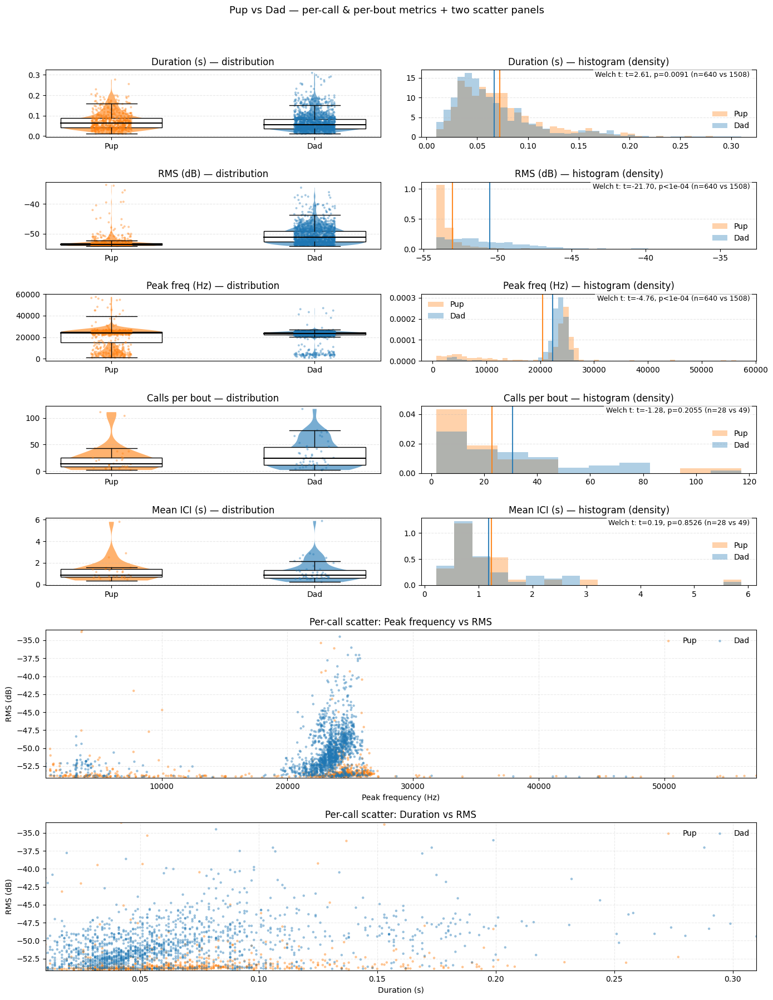

✅ Saved: C:\Users\gg3065\Dropbox\Vocalizations_project\Figures\calls_metrics_pup_vs_dad_WITH_bout_metrics_and_two_scatters.pdf
✅ Saved: C:\Users\gg3065\Dropbox\Vocalizations_project\Figures\calls_metrics_pup_vs_dad_WITH_bout_metrics_and_two_scatters.png


In [52]:
# ============================================================
# Pup vs Dad — per-call + per-bout + 2 SCATTERS
# - Adds Welch t-tests to histograms
# - Adds two wide bottom panels:
#     (1) Per-call scatter: Peak frequency (Hz) vs RMS (dB)
#     (2) Per-call scatter: Duration (s) vs RMS (dB)
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from scipy.stats import ttest_ind
import os

# --- sanity check
assert 'calls_metrics' in globals(), "calls_metrics DataFrame not found. Run the metrics cell first."
req_cols = {'group','bout_id','start_time_experiment_sec','call_dur_s','call_rms_db','peak_freq_hz'}
missing = req_cols - set(calls_metrics.columns)
assert not missing, f"calls_metrics is missing columns: {missing}"

# --------- knobs ---------
FIG_W = 14
FIG_H = 18                       # overall size; bottom scatter panels get extra height
POINT_ALPHA = 0.4
POINT_SIZE = 8
VIOLIN_ALPHA = 0.6
BOX_WIDTH = 0.5
NBINS_MAX = 60                   # cap bins for histograms
SCATTER_SIZE = 10
SCATTER_ALPHA = 0.45
SCATTER_GROUPS = ['pup', 'dad']  # which groups to show in scatter
DPI_SAVE = 200
SAVE_PREFIX = "calls_metrics_pup_vs_dad_WITH_bout_metrics_and_two_scatters"

# Colors by group
def group_color(g: str):
    g = str(g).lower()
    if g == 'dad': return '#1f77b4'      # blue
    if g == 'pup': return '#ff7f0e'      # orange
    if g == 'multiple': return '#7f7f7f' # gray (if present)
    if g == 'mom': return '#d62728'      # red (unlikely here)
    return '#8c564b'                     # fallback

# Group order (if present)
all_groups = list(pd.unique(calls_metrics['group'].astype(str)))
preferred = ['pup','dad','multiple','mom']
groups = [g for g in preferred if g in all_groups] + [g for g in all_groups if g not in preferred]

# ---------- helper: Freedman–Diaconis bins ----------
def fd_bins(x, nbins_max=NBINS_MAX):
    x = np.asarray(x, float)
    x = x[np.isfinite(x)]
    if x.size < 2:
        return 10
    iqr = np.subtract(*np.percentile(x, [75, 25]))
    if iqr <= 0:
        return min(10, nbins_max)
    h = 2 * iqr * x.size ** (-1/3)
    if h <= 0:
        return min(10, nbins_max)
    nb = int(np.ceil((x.max() - x.min()) / h))
    return max(10, min(nb, nbins_max))

# ---------- per-bout metrics (warning-free, no column overlap) ----------
# bout_id -> group (unique per bout in your selection)
bout_group = (
    calls_metrics[['bout_id','group']]
    .drop_duplicates('bout_id')
    .set_index('bout_id')['group']
)

# calls per bout (no 'group' column here)
calls_per_bout = (
    calls_metrics.groupby('bout_id', as_index=True)
    .size()
    .rename('calls_per_bout')
    .to_frame()
)

# mean ICI per bout WITHOUT .apply (avoids deprecation warning)
_tmp = (
    calls_metrics[['bout_id','start_time_experiment_sec']]
    .dropna()
    .sort_values(['bout_id','start_time_experiment_sec'])
)
_tmp['dt'] = _tmp.groupby('bout_id')['start_time_experiment_sec'].diff()
mean_ici = (
    _tmp.groupby('bout_id')['dt']
        .mean()
        .rename('mean_ici_s')
        .to_frame()
)

# join frames that have NO 'group', then add group ONCE
bout_metrics = calls_per_bout.join(mean_ici, how='outer')   # index=bout_id
bout_metrics['group'] = bout_group.reindex(bout_metrics.index).values

# tidy + only groups we’re plotting
bout_metrics = (
    bout_metrics
    .reset_index()
    .query('group in @groups')
)

# ---------- plotting helpers ----------
def _clean_arrays_from_dict(data_dict):
    labels = list(data_dict.keys())
    arrays = []
    for g in labels:
        arr = np.asarray(data_dict[g], float)
        arr = arr[np.isfinite(arr)]
        arrays.append(arr)
    return labels, arrays

def violin_box_points(ax, data_dict, title):
    labels, arrays = _clean_arrays_from_dict(data_dict)

    # violin
    if any(a.size for a in arrays):
        vparts = ax.violinplot(arrays, showmeans=False, showmedians=False, showextrema=False)
        for i, body in enumerate(vparts['bodies']):
            body.set_facecolor(group_color(labels[i]))
            body.set_alpha(VIOLIN_ALPHA)
            body.set_edgecolor('none')

    # box (simple)
    for i, vals in enumerate(arrays, start=1):
        if vals.size == 0:
            continue
        q1, med, q3 = np.percentile(vals, [25, 50, 75])
        iqr = q3 - q1
        whisk_lo = np.min(vals[vals >= (q1 - 1.5*iqr)]) if np.any(vals >= (q1 - 1.5*iqr)) else q1
        whisk_hi = np.max(vals[vals <= (q3 + 1.5*iqr)]) if np.any(vals <= (q3 + 1.5*iqr)) else q3
        ax.add_patch(plt.Rectangle((i-BOX_WIDTH/2, q1), BOX_WIDTH, iqr,
                                   facecolor='white', edgecolor='black', linewidth=1))
        ax.plot([i-BOX_WIDTH/2, i+BOX_WIDTH/2], [med, med], color='black', linewidth=1.5)
        ax.plot([i, i], [whisk_lo, q1], color='black', linewidth=1)
        ax.plot([i, i], [q3, whisk_hi], color='black', linewidth=1)
        ax.plot([i-BOX_WIDTH/4, i+BOX_WIDTH/4], [whisk_lo, whisk_lo], color='black', linewidth=1)
        ax.plot([i-BOX_WIDTH/4, i+BOX_WIDTH/4], [whisk_hi, whisk_hi], color='black', linewidth=1)

    # jittered points
    rng = np.random.default_rng(42)
    for i, vals in enumerate(arrays, start=1):
        if vals.size == 0:
            continue
        xj = i + (rng.random(vals.size) - 0.5) * 0.2
        ax.scatter(xj, vals, s=POINT_SIZE, alpha=POINT_ALPHA, color=group_color(labels[i-1]), edgecolors='none')

    ax.set_xticks(np.arange(1, len(labels)+1))
    ax.set_xticklabels([g.capitalize() for g in labels])
    ax.set_title(title)
    ax.grid(True, axis='y', linestyle='--', alpha=0.3)

def histogram_overlay_with_t(ax, data_dict, title, nbins_max=NBINS_MAX):
    labels, arrays = _clean_arrays_from_dict(data_dict)

    # common binning across groups
    all_vals = np.concatenate([a for a in arrays if a.size]) if any(a.size for a in arrays) else np.array([])
    if all_vals.size:
        nb = fd_bins(all_vals, nbins_max)
        hist_range = (np.nanmin(all_vals), np.nanmax(all_vals))
    else:
        nb, hist_range = 10, None

    # plot
    for g, arr in zip(labels, arrays):
        if arr.size == 0:
            continue
        ax.hist(arr, bins=nb, range=hist_range, density=True, alpha=0.35,
                label=g.capitalize(), color=group_color(g), edgecolor='none')
        m = np.nanmean(arr)
        if np.isfinite(m):
            ax.axvline(m, color=group_color(g), linestyle='-', linewidth=1.5, alpha=0.9)

    # Welch's t-test: Pup vs Dad
    def pick(name):
        for lbl, arr in zip(labels, arrays):
            if lbl.lower() == name:
                return arr
        return np.array([])

    pup = pick('pup')
    dad = pick('dad')

    if pup.size >= 2 and dad.size >= 2:
        tstat, p = ttest_ind(pup, dad, equal_var=False, nan_policy='omit')
        p_txt = f"p<{1e-4:.0e}" if p < 1e-4 else f"p={p:.4f}"
        tt_line = f"Welch t: t={tstat:.2f}, {p_txt} (n={pup.size} vs {dad.size})"
        ax.text(0.98, 0.98, tt_line, transform=ax.transAxes,
                ha='right', va='top', fontsize=9, color='black',
                bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', pad=2.5))

    ax.set_title(title)
    ax.grid(True, axis='y', linestyle='--', alpha=0.3)
    ax.legend(frameon=False)

# ---------- assemble data dicts ----------
# per-call metrics
per_call_specs = [
    ("Duration (s)",    "call_dur_s"),
    ("RMS (dB)",        "call_rms_db"),
    ("Peak freq (Hz)",  "peak_freq_hz"),
]
per_call_data = [
    (
        title,
        {g: calls_metrics.loc[(calls_metrics['group']==g) & np.isfinite(calls_metrics[col]), col].to_numpy()
         for g in groups}
    )
    for (title, col) in per_call_specs
]

# per-bout metrics
per_bout_specs = [
    ("Calls per bout",  "calls_per_bout"),
    ("Mean ICI (s)",    "mean_ici_s"),
]
per_bout_data = [
    (
        title,
        {g: bout_metrics.loc[(bout_metrics['group']==g) & np.isfinite(bout_metrics[col]), col].to_numpy()
         for g in groups}
    )
    for (title, col) in per_bout_specs
]

# ---------- figure layout ----------
# small grid + two full-width scatter rows
n_small_rows = len(per_call_data) + len(per_bout_data)  # 5
height_ratios = [1.0]*n_small_rows + [2.2, 2.2]         # both scatters taller

fig = plt.figure(figsize=(FIG_W, FIG_H), constrained_layout=True)
gs = GridSpec(nrows=n_small_rows + 2, ncols=2, height_ratios=height_ratios, figure=fig)

# small panels
rows_iter = list(per_call_data) + list(per_bout_data)
for r, (title, data_dict) in enumerate(rows_iter):
    ax1 = fig.add_subplot(gs[r, 0])
    ax2 = fig.add_subplot(gs[r, 1])
    violin_box_points(ax1, data_dict, f"{title} — distribution")
    histogram_overlay_with_t(ax2, data_dict, f"{title} — histogram (density)")

# --------- SCATTER #1: Peak frequency vs RMS (per call) ---------
ax_scatter1 = fig.add_subplot(gs[-2, :])

df_sc1 = calls_metrics.loc[
    calls_metrics['group'].str.lower().isin(SCATTER_GROUPS),
    ['group','call_rms_db','peak_freq_hz']
].dropna()

# common x/y limits across groups
if not df_sc1.empty:
    x_all = df_sc1['peak_freq_hz'].to_numpy(dtype=float)
    y_all = df_sc1['call_rms_db'].to_numpy(dtype=float)
    x_min, x_max = np.nanmin(x_all), np.nanmax(x_all)
    y_min, y_max = np.nanmin(y_all), np.nanmax(y_all)
else:
    x_min = y_min = 0.0
    x_max = y_max = 1.0

for g in SCATTER_GROUPS:
    sub = df_sc1.loc[df_sc1['group'].str.lower()==g]
    if len(sub) == 0:
        continue
    ax_scatter1.scatter(
        sub['peak_freq_hz'].to_numpy(dtype=float),
        sub['call_rms_db'].to_numpy(dtype=float),
        s=SCATTER_SIZE, alpha=SCATTER_ALPHA,
        color=group_color(g), edgecolors='none', label=g.capitalize()
    )

ax_scatter1.set_xlim(x_min, x_max)
ax_scatter1.set_ylim(y_min, y_max)
ax_scatter1.set_xlabel("Peak frequency (Hz)")
ax_scatter1.set_ylabel("RMS (dB)")
ax_scatter1.set_title("Per-call scatter: Peak frequency vs RMS")
ax_scatter1.grid(True, linestyle='--', alpha=0.25)
ax_scatter1.legend(frameon=False, ncols=len(SCATTER_GROUPS))

# --------- SCATTER #2: Duration vs RMS (per call) ---------
ax_scatter2 = fig.add_subplot(gs[-1, :])

df_sc2 = calls_metrics.loc[
    calls_metrics['group'].str.lower().isin(SCATTER_GROUPS),
    ['group','call_rms_db','call_dur_s']
].dropna()

# common x/y limits across groups
if not df_sc2.empty:
    x_all = df_sc2['call_dur_s'].to_numpy(dtype=float)
    y_all = df_sc2['call_rms_db'].to_numpy(dtype=float)
    x_min2, x_max2 = np.nanmin(x_all), np.nanmax(x_all)
    y_min2, y_max2 = np.nanmin(y_all), np.nanmax(y_all)
else:
    x_min2 = y_min2 = 0.0
    x_max2 = y_max2 = 1.0

for g in SCATTER_GROUPS:
    sub = df_sc2.loc[df_sc2['group'].str.lower()==g]
    if len(sub) == 0:
        continue
    ax_scatter2.scatter(
        sub['call_dur_s'].to_numpy(dtype=float),
        sub['call_rms_db'].to_numpy(dtype=float),
        s=SCATTER_SIZE, alpha=SCATTER_ALPHA,
        color=group_color(g), edgecolors='none', label=g.capitalize()
    )

ax_scatter2.set_xlim(x_min2, x_max2)
ax_scatter2.set_ylim(y_min2, y_max2)
ax_scatter2.set_xlabel("Duration (s)")
ax_scatter2.set_ylabel("RMS (dB)")
ax_scatter2.set_title("Per-call scatter: Duration vs RMS")
ax_scatter2.grid(True, linestyle='--', alpha=0.25)
ax_scatter2.legend(frameon=False, ncols=len(SCATTER_GROUPS))

# tidy + save
fig.suptitle("Pup vs Dad — per-call & per-bout metrics + two scatter panels", y=0.995, fontsize=13)
plt.tight_layout(rect=(0,0,1,0.97))

out_pdf = os.path.join(figs_path, f"{SAVE_PREFIX}.pdf") if 'figs_path' in globals() else f"{SAVE_PREFIX}.pdf"
out_png = os.path.join(figs_path, f"{SAVE_PREFIX}.png") if 'figs_path' in globals() else f"{SAVE_PREFIX}.png"
fig.savefig(out_pdf, bbox_inches="tight", dpi=DPI_SAVE)
fig.savefig(out_png, bbox_inches="tight", dpi=DPI_SAVE)
plt.show()
print(f"✅ Saved: {out_pdf}\n✅ Saved: {out_png}")


In [31]:
# DBG parameters

# ============================================================
# Per-bout DEBUG PNGs (4 aligned panels):
#   1) Call ticks (includes LAST call)
#   2) Call rate (Hz) — CAUSAL EMA with decaying exponential (your function),
#      warmed with PRE_ZERO_SEC seconds of true zeros; masked after LAST call
#   3) ICI (s) — Gaussian kernel regression on ICI midpoints, masked after LAST call
#   4) CV (forward) — Gaussian regression of forward-window CV
# Saves one PNG per bout into DEBUG_OUT_DIR
# ============================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# -------- EXPECTED INPUTS IN SESSION --------
# alarm_calls: DataFrame with ['bout_id','start_time_experiment_sec','exp'(optional)]
# pre_time, post_time, stride_sec
# experiment_start_real: Timestamp  (used by your rate_from_times_causal return)
# rate_from_times_causal(...) must be defined exactly as your version
# figs_path (for output); exp_list (optional, for folder naming)

# ---- Output folder ----
exp_str = "_".join(map(str, sorted(set(locals().get("exp_list", []))))) if "exp_list" in locals() else "unknown_exps"
DEBUG_OUT_DIR = os.path.join(locals().get("figs_path", os.getcwd()),
                             f"debug_bout_kernels_rate_{exp_str}")
os.makedirs(DEBUG_OUT_DIR, exist_ok=True)

# ---- Parameters ----
# Plot styling
LW_MAIN         = 1.5
SHOW_RAW_POINTS = False  # scatter raw ICI/CV points


# ---------- Stable bout list (>2 calls) ----------
ac = alarm_calls.copy()
ac["bout_id"] = pd.to_numeric(ac["bout_id"], errors="coerce")
ac["start_time_experiment_sec"] = pd.to_numeric(ac["start_time_experiment_sec"], errors="coerce")

valid = ac.groupby("bout_id").filter(lambda g: len(g) > 2)
if valid.empty:
    raise ValueError("No bouts with > 2 calls found in 'alarm_calls'.")

idx = valid.groupby("bout_id")["start_time_experiment_sec"].idxmin()
onsets = valid.loc[idx, ["bout_id", "start_time_experiment_sec"]].copy()
onsets.rename(columns={"start_time_experiment_sec": "onset_sec"}, inplace=True)
onsets = onsets.sort_values("onset_sec").reset_index(drop=True)
onsets["ord"] = np.arange(1, len(onsets) + 1)

used_bout_ids = onsets["bout_id"].tolist()
ord_by_id     = dict(zip(onsets["bout_id"], onsets["ord"]))

# ---------- Kernels (no binning) ----------
def gaussian_kernel_regression(x, y, xgrid, sigma_sec, truncate=3.0, min_weight=1e-9):
    """
    Smooth irregular (x,y) onto xgrid with Gaussian weights (seconds).
    Returns NaN where support is insufficient.
    """
    x = np.asarray(x, float); y = np.asarray(y, float); xgrid = np.asarray(xgrid, float)
    out = np.full_like(xgrid, np.nan, dtype=float)
    if x.size == 0 or sigma_sec <= 0:
        return out
    sig2 = float(sigma_sec)**2
    R = truncate * float(sigma_sec)
    order = np.argsort(x)
    xs = x[order]; ys = y[order]
    for i, xc in enumerate(xgrid):
        m = (xs >= xc - R) & (xs <= xc + R) & np.isfinite(ys)
        if not np.any(m):
            continue
        dx = xs[m] - xc
        w = np.exp(-0.5 * (dx*dx) / sig2)
        s = w.sum()
        if s > min_weight:
            out[i] = np.dot(w, ys[m]) / s
    return out

# ---------- Common display grids ----------
t_grid_pos  = np.arange(0.0, post_time + 1e-9, stride_sec)  # ICI/CV smoothing grid (t >= 0 only)

# ---------- Main loop — one PNG per bout ----------
for b_id in used_bout_ids:
    g = valid[valid["bout_id"] == b_id].copy().sort_values("start_time_experiment_sec")
    t_all_abs = g["start_time_experiment_sec"].to_numpy()
    exp_val = int(g["exp"].iloc[0]) if "exp" in g.columns and pd.notna(g["exp"].iloc[0]) else None

    if t_all_abs.size == 0:
        continue

    # --- Bout-aligned call times (INCLUDE last call for visualization) ---
    t0 = t_all_abs.min()
    t_rel = t_all_abs - t0                           # includes last call
    last_rel = t_rel.max()

    # Ticks inside plotting window
    tick_mask = (t_rel >= -pre_time) & (t_rel <= post_time)
    calls_in_window = t_rel[tick_mask]

    # === RATE (Hz): CAUSAL EMA with pre-zero warmup ===
    # Feed zeros by starting before 0 (negative start) — your function bins everything;
    # there are simply no calls in the negative part, so those bins are zero.
    tgrid_real, y_rate_full = rate_from_times_causal(
        times_sec=t_rel,
        start_sec=-PRE_ZERO_SEC,   # <--- pre-bout zeros fed to the EMA
        end_sec=post_time,
        dt=stride_sec,
        tau_sec=TAU_RATE_SEC
    )
    # Convert returned timestamps to *relative seconds* from onset;
    # your function builds tgrid_real = experiment_start_real + centers_sec,
    # so (tgrid_real - experiment_start_real).total_seconds() == centers_sec
    centers_rel = (tgrid_real - experiment_start_real).total_seconds()

    # Keep only the plotting window [-pre_time, post_time]
    m_win = (centers_rel >= -pre_time) & (centers_rel <= post_time)
    x_rate = centers_rel[m_win]
    y_rate = y_rate_full[m_win]

    # Mask after the last call so the line stops there
    y_rate[x_rate > last_rel] = np.nan

    # --- ICI midpoints & values (no binning) ---
    if t_all_abs.size >= 2:
        ici_vals = np.diff(t_all_abs)                            # seconds
        mid_abs  = (t_all_abs[:-1] + t_all_abs[1:]) / 2.0        # midpoints (absolute)
        mrel_full = mid_abs - t0                                 # relative midpoints
        # keep only midpoints within [0, min(post_time, last_rel)]
        m_hi = min(post_time, last_rel)
        m_mask = (mrel_full >= 0.0) & (mrel_full <= m_hi)
        mrel = mrel_full[m_mask]
        ici  = ici_vals[m_mask]
    else:
        mrel = np.array([]); ici = np.array([])

    # Smooth ICI and then MASK after last call so the line stops there
    ici_smooth = gaussian_kernel_regression(mrel, ici, t_grid_pos,
                                            sigma_sec=ICI_SMOOTH_SEC, truncate=GAUSS_TRUNC)
    ici_smooth[t_grid_pos > last_rel] = np.nan

    # --- CV at ICI midpoints (forward window) ---
    cv_x = []; cv_y = []
    if t_all_abs.size >= 3:
        for m in mrel_full:                                     # use full midpoints for proper look-ahead
            if m > post_time:
                continue
            subset = ici_vals[(mrel_full >= m) & (mrel_full <= m + CV_FWD_SEC)]
            if subset.size >= max(CV_MIN_SAMPLES, 2) and subset.mean() > 0:
                cv_x.append(m)
                cv_y.append(subset.std(ddof=1) / subset.mean())
    cv_x = np.asarray(cv_x, float); cv_y = np.asarray(cv_y, float)
    keep = (cv_x >= 0.0) & (cv_x <= post_time)
    cv_x = cv_x[keep]; cv_y = cv_y[keep]
    cv_smooth = gaussian_kernel_regression(cv_x, cv_y, t_grid_pos,
                                           sigma_sec=CV_SMOOTH_SEC, truncate=GAUSS_TRUNC)
    # (Optional) also stop CV line after last call:
    # cv_smooth[t_grid_pos > last_rel] = np.nan

    # -------------------------
    # Plot (4 rows, shared x)
    # -------------------------
    fig, (ax_ticks, ax_rate_ax, ax_ici, ax_cv) = plt.subplots(
        4, 1, figsize=(12, 9), sharex=True,
        gridspec_kw={"height_ratios": [1.0, 1.2, 1.2, 1.2]}
    )

    # (1) Call ticks (includes last call)
    ax_ticks.axvline(0, ls='--', c='k', alpha=0.5, lw=1)
    if calls_in_window.size:
        ax_ticks.vlines(calls_in_window, 0, 1, color='black', linewidth=0.9, alpha=0.9)
    ax_ticks.set_xlim(-pre_time, post_time)
    ax_ticks.set_yticks([]); ax_ticks.set_ylabel("Calls")
    ax_ticks.grid(True, linestyle='--', alpha=0.25)

    # (2) Rate (Hz), masked after last call — CAUSAL EMA
    ax_rate_ax.axvline(0, ls='--', c='k', alpha=0.5, lw=1)
    ax_rate_ax.plot(x_rate, y_rate, color='tab:purple', lw=LW_MAIN,
                    label=f"EMA rate (τ={TAU_RATE_SEC:.2f}s, warmup={PRE_ZERO_SEC:.1f}s)")
    ax_rate_ax.set_ylabel("Rate (Hz)")
    ax_rate_ax.grid(True, linestyle='--', alpha=0.25)
    ax_rate_ax.legend(frameon=False, loc='upper right')

    # (3) ICI (s), masked after last call
    ax_ici.axvline(0, ls='--', c='k', alpha=0.5, lw=1)
    ax_ici.plot(t_grid_pos, ici_smooth, color='tab:blue', lw=LW_MAIN,
                label=f"ICI σ={ICI_SMOOTH_SEC:.1f}s")
    if SHOW_RAW_POINTS and mrel.size:
        ax_ici.scatter(mrel, ici, s=10, color='gray', alpha=0.4, linewidths=0, label="raw ICI")
    ax_ici.set_ylabel("ICI (s)")
    ax_ici.grid(True, linestyle='--', alpha=0.25)
    ax_ici.legend(frameon=False, loc='upper right')

    # (4) CV (forward)
    ax_cv.axvline(0, ls='--', c='k', alpha=0.5, lw=1)
    ax_cv.plot(t_grid_pos, cv_smooth, color='tab:green', lw=LW_MAIN,
               label=f"CV (W={CV_FWD_SEC:.1f}s, σ={CV_SMOOTH_SEC:.1f}s)")
    if SHOW_RAW_POINTS and cv_x.size:
        ax_cv.scatter(cv_x, cv_y, s=10, color='gray', alpha=0.4, linewidths=0, label="raw CV")
    ax_cv.set_ylim(0, 2)  # fix CV axis
    ax_cv.set_yticks([0, 0.5, 1.0, 1.5, 2.0])
    ax_cv.set_xlabel("Time from bout onset (s)")
    ax_cv.set_ylabel("CV of ICI")
    ax_cv.grid(True, linestyle='--', alpha=0.25)
    ax_cv.legend(frameon=False, loc='upper right')

    # Title
    ord_num = ord_by_id.get(b_id, None)
    title_bits = [f"Bout ID {int(b_id)}"]
    if ord_num is not None:
        title_bits.insert(0, f"Bout #{ord_num}")
    if exp_val is not None:
        title_bits.append(f"(exp {exp_val})")
    fig.suptitle(" ".join(title_bits), y=0.98)

    plt.tight_layout()
    # Save PNG
    fname = f"bout_debug_{('ord%03d_' % ord_num) if ord_num is not None else ''}id{int(b_id)}"
    if exp_val is not None:
        fname = f"exp{exp_val}_" + fname
    out_path = os.path.join(DEBUG_OUT_DIR, fname + ".png")
    fig.savefig(out_path, dpi=150, bbox_inches="tight")
    plt.close(fig)
    print(f"✅ saved {out_path}")

print(f"\nAll done. PNGs are in: {DEBUG_OUT_DIR}")


✅ saved C:\Users\gg3065\Dropbox\Vocalizations_project\Figures\debug_bout_kernels_rate_97_98_99_109_110_111_112_113_114_115_116\exp97_bout_debug_ord001_id1.png
✅ saved C:\Users\gg3065\Dropbox\Vocalizations_project\Figures\debug_bout_kernels_rate_97_98_99_109_110_111_112_113_114_115_116\exp97_bout_debug_ord002_id2.png
✅ saved C:\Users\gg3065\Dropbox\Vocalizations_project\Figures\debug_bout_kernels_rate_97_98_99_109_110_111_112_113_114_115_116\exp97_bout_debug_ord003_id3.png
✅ saved C:\Users\gg3065\Dropbox\Vocalizations_project\Figures\debug_bout_kernels_rate_97_98_99_109_110_111_112_113_114_115_116\exp97_bout_debug_ord004_id4.png
✅ saved C:\Users\gg3065\Dropbox\Vocalizations_project\Figures\debug_bout_kernels_rate_97_98_99_109_110_111_112_113_114_115_116\exp97_bout_debug_ord005_id5.png
✅ saved C:\Users\gg3065\Dropbox\Vocalizations_project\Figures\debug_bout_kernels_rate_97_98_99_109_110_111_112_113_114_115_116\exp97_bout_debug_ord006_id6.png
✅ saved C:\Users\gg3065\Dropbox\Vocalizations_

C:\Users\gg3065\AppData\Local\Temp\ipykernel_29828\2630463564.py:212: UserWarning: The figure layout has changed to tight
  plt.tight_layout(rect=(0,0,1,0.97))


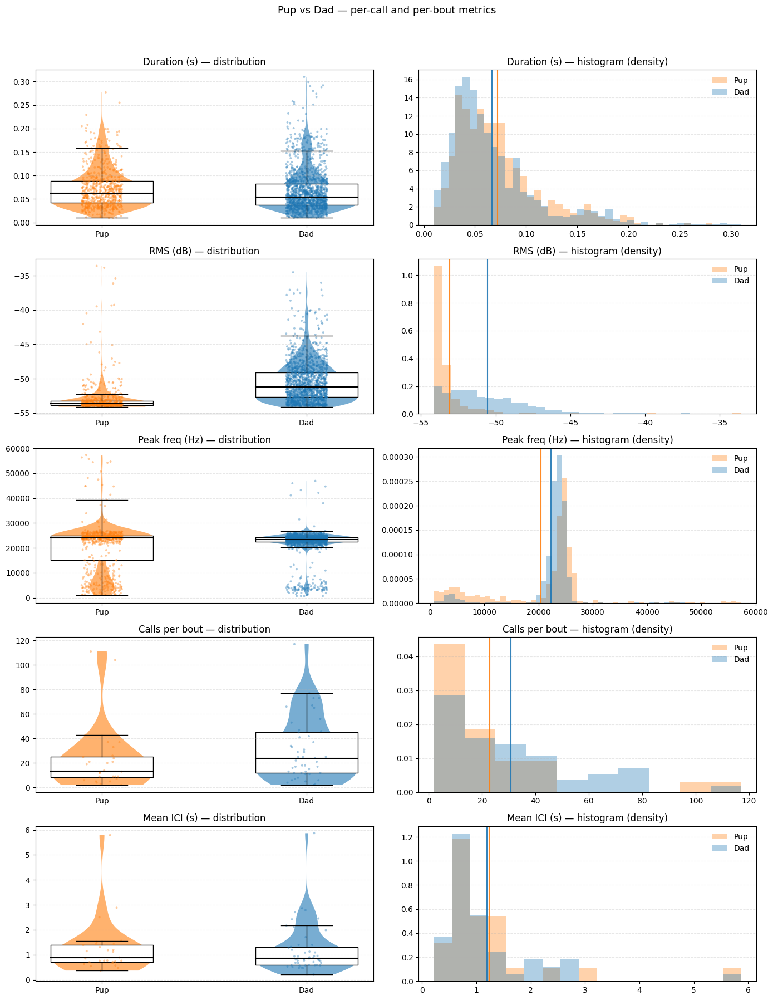

✅ Saved: C:\Users\gg3065\Dropbox\Vocalizations_project\Figures\calls_metrics_pup_vs_dad_WITH_bout_metrics_percall_perbout.pdf
✅ Saved: C:\Users\gg3065\Dropbox\Vocalizations_project\Figures\calls_metrics_pup_vs_dad_WITH_bout_metrics_percall_perbout.png


In [48]:
# ============================================================
# Pup vs Dad — per-call + per-bout metrics (no ECDFs)
# Rows: [Duration, RMS, Peak freq, Calls/bout, Mean ICI]
# Cols: [violin+box+points, histogram (density)]
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os

# --- sanity check
assert 'calls_metrics' in globals(), "calls_metrics DataFrame not found. Run the metrics cell first."
req_cols = {'group','bout_id','start_time_experiment_sec','call_dur_s','call_rms_db','peak_freq_hz'}
missing = req_cols - set(calls_metrics.columns)
assert not missing, f"calls_metrics is missing columns: {missing}"

# --------- knobs ---------
FIG_W = 14
FIG_H = 18
POINT_ALPHA = 0.4
POINT_SIZE = 8
VIOLIN_ALPHA = 0.6
BOX_WIDTH = 0.5
NBINS_MAX = 60               # cap bins for histograms
DPI_SAVE = 200
SAVE_PREFIX = "calls_metrics_pup_vs_dad_WITH_bout_metrics"

# Colors by group
def group_color(g: str):
    g = str(g).lower()
    if g == 'dad': return '#1f77b4'      # blue
    if g == 'pup': return '#ff7f0e'      # orange
    if g == 'multiple': return '#7f7f7f' # gray (if present)
    if g == 'mom': return '#d62728'      # red (unlikely here)
    return '#8c564b'                     # fallback

# Group order (if present)
all_groups = list(pd.unique(calls_metrics['group'].astype(str)))
preferred = ['pup','dad','multiple','mom']
groups = [g for g in preferred if g in all_groups] + [g for g in all_groups if g not in preferred]

# ---------- helper: Freedman–Diaconis bins ----------
def fd_bins(x, nbins_max=NBINS_MAX):
    x = np.asarray(x, float)
    x = x[np.isfinite(x)]
    if x.size < 2:
        return 10
    iqr = np.subtract(*np.percentile(x, [75, 25]))
    if iqr <= 0:
        return min(10, nbins_max)
    h = 2 * iqr * x.size ** (-1/3)
    if h <= 0:
        return min(10, nbins_max)
    nb = int(np.ceil((x.max() - x.min()) / h))
    return max(10, min(nb, nbins_max))

# ---------- per-bout metrics (warning-free, no column overlap) ----------
# bout_id -> group (unique per bout in your selection)
bout_group = (
    calls_metrics[['bout_id','group']]
    .drop_duplicates('bout_id')
    .set_index('bout_id')['group']
)

# calls per bout (no 'group' column here)
calls_per_bout = (
    calls_metrics.groupby('bout_id', as_index=True)
    .size()
    .rename('calls_per_bout')
    .to_frame()
)

# mean ICI per bout WITHOUT .apply (avoids deprecation warning)
_tmp = (
    calls_metrics[['bout_id','start_time_experiment_sec']]
    .dropna()
    .sort_values(['bout_id','start_time_experiment_sec'])
)
_tmp['dt'] = _tmp.groupby('bout_id')['start_time_experiment_sec'].diff()
mean_ici = (
    _tmp.groupby('bout_id')['dt']
        .mean()
        .rename('mean_ici_s')
        .to_frame()
)

# join frames that have NO 'group', then add group ONCE
bout_metrics = calls_per_bout.join(mean_ici, how='outer')   # index=bout_id
bout_metrics['group'] = bout_group.reindex(bout_metrics.index).values

# tidy + only groups we’re plotting
bout_metrics = (
    bout_metrics
    .reset_index()
    .query('group in @groups')
)

# ---------- plotting helpers (fixed to use data_dict values) ----------
def _clean_arrays_from_dict(data_dict):
    labels = list(data_dict.keys())
    arrays = []
    for g in labels:
        arr = np.asarray(data_dict[g], float)
        arr = arr[np.isfinite(arr)]
        arrays.append(arr)
    return labels, arrays

def violin_box_points(ax, data_dict, title):
    labels, arrays = _clean_arrays_from_dict(data_dict)

    # violin
    if any(a.size for a in arrays):
        vparts = ax.violinplot(arrays, showmeans=False, showmedians=False, showextrema=False)
        for i, body in enumerate(vparts['bodies']):
            body.set_facecolor(group_color(labels[i]))
            body.set_alpha(VIOLIN_ALPHA)
            body.set_edgecolor('none')

    # box (simple)
    for i, vals in enumerate(arrays, start=1):
        if vals.size == 0:
            continue
        q1, med, q3 = np.percentile(vals, [25, 50, 75])
        iqr = q3 - q1
        whisk_lo = np.min(vals[vals >= (q1 - 1.5*iqr)]) if np.any(vals >= (q1 - 1.5*iqr)) else q1
        whisk_hi = np.max(vals[vals <= (q3 + 1.5*iqr)]) if np.any(vals <= (q3 + 1.5*iqr)) else q3
        ax.add_patch(plt.Rectangle((i-BOX_WIDTH/2, q1), BOX_WIDTH, iqr,
                                   facecolor='white', edgecolor='black', linewidth=1))
        ax.plot([i-BOX_WIDTH/2, i+BOX_WIDTH/2], [med, med], color='black', linewidth=1.5)
        ax.plot([i, i], [whisk_lo, q1], color='black', linewidth=1)
        ax.plot([i, i], [q3, whisk_hi], color='black', linewidth=1)
        ax.plot([i-BOX_WIDTH/4, i+BOX_WIDTH/4], [whisk_lo, whisk_lo], color='black', linewidth=1)
        ax.plot([i-BOX_WIDTH/4, i+BOX_WIDTH/4], [whisk_hi, whisk_hi], color='black', linewidth=1)

    # jittered points
    rng = np.random.default_rng(42)
    for i, vals in enumerate(arrays, start=1):
        if vals.size == 0:
            continue
        xj = i + (rng.random(vals.size) - 0.5) * 0.2
        ax.scatter(xj, vals, s=POINT_SIZE, alpha=POINT_ALPHA, color=group_color(labels[i-1]), edgecolors='none')

    ax.set_xticks(np.arange(1, len(labels)+1))
    ax.set_xticklabels([g.capitalize() for g in labels])
    ax.set_title(title)
    ax.grid(True, axis='y', linestyle='--', alpha=0.3)

def histogram_overlay(ax, data_dict, title, nbins_max=NBINS_MAX):
    labels, arrays = _clean_arrays_from_dict(data_dict)
    all_vals = np.concatenate([a for a in arrays if a.size]) if any(a.size for a in arrays) else np.array([])
    if all_vals.size:
        nb = fd_bins(all_vals, nbins_max)
        hist_range = (np.nanmin(all_vals), np.nanmax(all_vals))
    else:
        nb, hist_range = 10, None
    for g, arr in zip(labels, arrays):
        if arr.size == 0:
            continue
        ax.hist(arr, bins=nb, range=hist_range, density=True, alpha=0.35,
                label=g.capitalize(), color=group_color(g), edgecolor='none')
        m = np.nanmean(arr)
        if np.isfinite(m):
            ax.axvline(m, color=group_color(g), linestyle='-', linewidth=1.5, alpha=0.9)
    ax.set_title(title)
    ax.grid(True, axis='y', linestyle='--', alpha=0.3)
    ax.legend(frameon=False)

# ---------- assemble data dicts ----------
# per-call metrics
per_call_specs = [
    ("Duration (s)",    "call_dur_s"),
    ("RMS (dB)",        "call_rms_db"),
    ("Peak freq (Hz)",  "peak_freq_hz"),
]
per_call_data = [
    (
        title,
        {g: calls_metrics.loc[(calls_metrics['group']==g) & np.isfinite(calls_metrics[col]), col].to_numpy()
         for g in groups}
    )
    for (title, col) in per_call_specs
]

# per-bout metrics
per_bout_specs = [
    ("Calls per bout",  "calls_per_bout"),
    ("Mean ICI (s)",    "mean_ici_s"),
]
per_bout_data = [
    (
        title,
        {g: bout_metrics.loc[(bout_metrics['group']==g) & np.isfinite(bout_metrics[col]), col].to_numpy()
         for g in groups}
    )
    for (title, col) in per_bout_specs
]

# ---------- plot grid: 5 rows x 2 cols ----------
nrows = len(per_call_data) + len(per_bout_data)  # 3 + 2 = 5
fig, axes = plt.subplots(nrows=nrows, ncols=2, figsize=(FIG_W, FIG_H), constrained_layout=True)

rows_iter = list(per_call_data) + list(per_bout_data)
for r, (title, data_dict) in enumerate(rows_iter):
    ax1 = axes[r, 0]
    ax2 = axes[r, 1]
    violin_box_points(ax1, data_dict, f"{title} — distribution")
    histogram_overlay(ax2, data_dict, f"{title} — histogram (density)")

# tidy + save
fig.suptitle("Pup vs Dad — per-call and per-bout metrics", y=0.995, fontsize=13)
plt.tight_layout(rect=(0,0,1,0.97))

out_pdf = os.path.join(figs_path, f"{SAVE_PREFIX}_percall_perbout.pdf") if 'figs_path' in globals() else f"{SAVE_PREFIX}_percall_perbout.pdf"
out_png = os.path.join(figs_path, f"{SAVE_PREFIX}_percall_perbout.png") if 'figs_path' in globals() else f"{SAVE_PREFIX}_percall_perbout.png"
fig.savefig(out_pdf, bbox_inches="tight", dpi=DPI_SAVE)
fig.savefig(out_png, bbox_inches="tight", dpi=DPI_SAVE)
plt.show()
print(f"✅ Saved: {out_pdf}\n✅ Saved: {out_png}")


In [49]:
# ================================
# CELL 1 — COMPUTATIONS ONLY 
# ================================

import numpy as np
import pandas as pd

# -------- knobs (override via globals if desired) --------
POST_TIME_LIMIT    = locals().get("POST_TIME_LIMIT", 30.0)
WINDOW_SEC         = locals().get("WINDOW_SEC", 30.0)
MIN_CALLS_PER_BOUT = locals().get("MIN_CALLS_PER_BOUT", 2)
P_LO, P_HI         = locals().get("P_LO", 5), locals().get("P_HI", 95)

# smoothing / window parameters for overlays
ICI_SMOOTH_SEC   = locals().get("ICI_SMOOTH_SEC", 1.0)
CV_FWD_SEC       = locals().get("CV_FWD_SEC", 5.0)
CV_MIN_SAMPLES   = locals().get("CV_MIN_SAMPLES", 3)
CV_SMOOTH_SEC    = locals().get("CV_SMOOTH_SEC", 1.0)
GAUSS_TRUNC      = locals().get("GAUSS_TRUNC", 3.0)

# EMA rate parameters
TAU_RATE_SEC     = locals().get("TAU_RATE_SEC", 1.5)
PRE_ZERO_SEC     = locals().get("PRE_ZERO_SEC", None)

# -------- required from your prep cell --------
assert "valid" in locals(),         "Need `valid` (filtered alarm_calls) in scope."
assert "used_bout_ids" in locals(), "Need `used_bout_ids` (ordered list of bout_ids) in scope."
assert "bout_ord_by_id" in locals(), "Need `bout_ord_by_id` mapping in scope."
assert "pre_time" in locals() and "post_time" in locals(), "Need pre_time/post_time in scope."
assert "stride_sec" in locals(),    "Need stride_sec (dt) in scope."
assert "rate_from_times_causal" in globals(), "Define `rate_from_times_causal` first."

# -------- helpers --------
def calls_for_bout(df_bout, post_time_limit=None):
    g = df_bout.sort_values('start_time_experiment_sec').copy()
    t0 = g['start_time_experiment_sec'].iloc[0]
    start_rel = pd.to_numeric(g['start_time_experiment_sec'], errors='coerce') - t0
    if 'duration_sec' in g.columns and g['duration_sec'].notna().any():
        dur = pd.to_numeric(g['duration_sec'], errors='coerce')
    elif 'stop_time_experiment_sec' in g.columns:
        dur = (pd.to_numeric(g['stop_time_experiment_sec'], errors='coerce')
               - pd.to_numeric(g['start_time_experiment_sec'], errors='coerce'))
    else:
        dur = pd.Series(np.nan, index=g.index, dtype=float)

    out = pd.DataFrame({
        'start_rel'   : start_rel.to_numpy(),
        'dur'         : dur.to_numpy(),
        'RMS_arena_1' : pd.to_numeric(g.get('RMS_arena_1', np.nan), errors='coerce').to_numpy()
    })
    if post_time_limit is not None:
        out = out[out['start_rel'] <= post_time_limit]
    return out.reset_index(drop=True)

def gaussian_kernel_regression(x, y, xgrid, sigma_sec, truncate=3.0, min_weight=1e-9):
    x = np.asarray(x, float); y = np.asarray(y, float); xg = np.asarray(xgrid, float)
    out = np.full_like(xg, np.nan, float)
    if x.size == 0 or sigma_sec <= 0: return out
    sig2 = float(sigma_sec)**2; R = truncate*float(sigma_sec)
    order = np.argsort(x); xs = x[order]; ys = y[order]
    for i, xc in enumerate(xg):
        m = (xs >= xc-R) & (xs <= xc+R) & np.isfinite(ys)
        if not np.any(m): continue
        dx = xs[m] - xc; w = np.exp(-0.5*(dx*dx)/sig2); s = w.sum()
        if s > min_weight: out[i] = np.dot(w, ys[m]) / s
    return out

def ici_and_cv_in_window(t_rel, window_sec, cv_min_samples=3):
    t = t_rel[(t_rel >= 0) & (t_rel <= window_sec)]
    if t.size < 2: return np.nan, np.nan
    ici = np.diff(t)
    if ici.size < 1: return np.nan, np.nan
    mean_ici = float(np.mean(ici))
    cv_ici   = float(np.std(ici, ddof=1) / mean_ici) if (ici.size >= max(2, cv_min_samples) and mean_ici > 0) else np.nan
    return mean_ici, cv_ici

# -------- per-bout call tables --------
per_bout_calls = [calls_for_bout(valid[valid['bout_id']==b], POST_TIME_LIMIT) for b in used_bout_ids]
per_bout_rms   = [dfc['RMS_arena_1'].to_numpy() for dfc in per_bout_calls]
max_calls      = max((len(seq) for seq in per_bout_rms), default=0)

R_onset = np.full((len(per_bout_rms), max_calls), np.nan, float)
for i, seq in enumerate(per_bout_rms):
    R_onset[i, :len(seq)] = seq

all_rms = np.concatenate([s[np.isfinite(s)] for s in per_bout_rms], axis=0) if per_bout_rms else np.array([])
if all_rms.size:
    vmin = np.percentile(all_rms, P_LO); vmax = np.percentile(all_rms, P_HI)
    if np.isclose(vmin, vmax): vmin, vmax = float(np.nanmin(all_rms)), float(np.nanmax(all_rms))
else:
    vmin, vmax = 0.0, 1.0

# -------- sorting metrics --------
firstcall_rms = [s[0] if len(s)>0 else np.nan for s in per_bout_rms]
mean_rms      = [np.nanmean(s[np.isfinite(s)]) if len(s)>0 else np.nan for s in per_bout_rms]
call_counts   = [len(dfc) for dfc in per_bout_calls]

mean_ici_win, cv_ici_win = [], []
for dfc in per_bout_calls:
    t_rel = dfc['start_rel'].to_numpy()
    m, c  = ici_and_cv_in_window(t_rel, WINDOW_SEC, cv_min_samples=CV_MIN_SAMPLES)
    mean_ici_win.append(m); cv_ici_win.append(c)

def sort_desc(a):
    a = np.asarray(a, float)
    return np.argsort(np.where(np.isfinite(a), -a, np.inf))  # high→low, NaNs last

orders = dict(
    onset     = np.arange(len(used_bout_ids)),             # chronological baseline
    firstcall = sort_desc(firstcall_rms),                  # high→low
    meanrms   = sort_desc(mean_rms),                       # high→low
    ncalls    = np.lexsort((np.arange(len(call_counts)), -np.asarray(call_counts))),  # many→few
    meanici   = sort_desc(mean_ici_win),                   # long→short (flip when using if you want short→long)
    cv        = sort_desc(cv_ici_win),                     # irregular→regular (flip when using if needed)
)

# -------- optional overlays (smoothed ICI / CV per bout) --------
t_grid_pos     = np.arange(0.0, post_time + 1e-9, stride_sec)
ici_smooth_mat = np.full((len(used_bout_ids), t_grid_pos.size), np.nan, float)
cv_smooth_mat  = np.full((len(used_bout_ids), t_grid_pos.size), np.nan, float)

for i, b in enumerate(used_bout_ids):
    g = valid[valid['bout_id']==b].sort_values('start_time_experiment_sec').copy()
    t_abs = pd.to_numeric(g['start_time_experiment_sec'], errors='coerce').to_numpy()
    if t_abs.size < 2 or not np.isfinite(t_abs).all(): continue
    t0 = t_abs.min(); t_rel = t_abs - t0; last_rel = t_rel.max()

    ici_vals = np.diff(t_abs)
    mrel_full = (t_abs[:-1] + t_abs[1:]) / 2.0 - t0
    hi = min(post_time, last_rel)
    keep = (mrel_full >= 0) & (mrel_full <= hi)
    mrel = mrel_full[keep]; ici = ici_vals[keep]
    if mrel.size:
        ici_s = gaussian_kernel_regression(mrel, ici, t_grid_pos, ICI_SMOOTH_SEC, truncate=GAUSS_TRUNC)
        ici_s[t_grid_pos > last_rel] = np.nan
        ici_smooth_mat[i, :] = ici_s

    cv_x, cv_y = [], []
    if ici_vals.size >= 2:
        for m in mrel_full:
            if m > post_time: break
            subset = ici_vals[(mrel_full >= m) & (mrel_full <= m + CV_FWD_SEC)]
            if subset.size >= max(CV_MIN_SAMPLES, 2) and subset.mean() > 0:
                cv_x.append(m); cv_y.append(subset.std(ddof=1) / subset.mean())
    if len(cv_x):
        cv_s = gaussian_kernel_regression(np.array(cv_x), np.array(cv_y), t_grid_pos, CV_SMOOTH_SEC, truncate=GAUSS_TRUNC)
        cv_smooth_mat[i, :] = cv_s

# -------- EMA Rate (per bout) with pre-zero warmup via your helper --------
if PRE_ZERO_SEC is None:
    PRE_ZERO_SEC = max(pre_time, 3.0 * TAU_RATE_SEC)  # good default warmup

edges_all   = np.arange(-PRE_ZERO_SEC, post_time + stride_sec, stride_sec)
centers_all = edges_all[:-1] + stride_sec/2.0
keep_nonneg = (centers_all >= 0.0) & (centers_all <= post_time)
t_grid_rate = centers_all[keep_nonneg]  # seconds relative to bout onset

rate_mat   = np.full((len(used_bout_ids), t_grid_rate.size), np.nan, float)
rate_means = np.full(len(used_bout_ids), np.nan, float)

for i, dfc in enumerate(per_bout_calls):
    t_rel = dfc['start_rel'].to_numpy()
    t_rel = t_rel[(t_rel >= 0.0) & (t_rel <= post_time) & np.isfinite(t_rel)]
    if t_rel.size == 0:
        continue

    _t_abs, y_full = rate_from_times_causal(
        times_sec=t_rel,
        start_sec=-PRE_ZERO_SEC,
        end_sec=post_time,
        dt=stride_sec,
        tau_sec=TAU_RATE_SEC
    )
    y = y_full[keep_nonneg].astype(float)

    last_rel = float(t_rel.max())
    y[t_grid_rate > last_rel] = np.nan  # optional tail mask

    rate_mat[i, :] = y
    rate_means[i]  = np.nanmean(y) if np.any(np.isfinite(y)) else np.nan

# -------- pack results --------
calc = dict(
    per_bout_calls = per_bout_calls,
    per_bout_rms   = per_bout_rms,
    R_onset        = R_onset,
    used_bout_ids  = used_bout_ids,
    bout_ord_by_id = bout_ord_by_id,
    max_calls      = max_calls,

    vmin=vmin, vmax=vmax,
    orders=orders,                      # <<— pass the prebuilt orders here

    t_grid_pos     = t_grid_pos,
    ici_smooth_mat = ici_smooth_mat,
    cv_smooth_mat  = cv_smooth_mat,

    PRE_ZERO_SEC = PRE_ZERO_SEC,
    TAU_RATE_SEC = TAU_RATE_SEC,
    t_grid_rate  = t_grid_rate,
    rate_mat     = rate_mat,
    rate_means   = rate_means,

    POST_TIME_LIMIT=POST_TIME_LIMIT,
    WINDOW_SEC=WINDOW_SEC,
    stride_sec=stride_sec,
    pre_time=pre_time, post_time=post_time,
    ICI_SMOOTH_SEC=ICI_SMOOTH_SEC,
    CV_FWD_SEC=CV_FWD_SEC,
    CV_MIN_SAMPLES=CV_MIN_SAMPLES,
    CV_SMOOTH_SEC=CV_SMOOTH_SEC,
    GAUSS_TRUNC=GAUSS_TRUNC,
)

print(f"✅ calc ready. Orders: {list(calc['orders'].keys())} | PRE_ZERO_SEC={calc['PRE_ZERO_SEC']:.2f}s, τ={calc['TAU_RATE_SEC']:.2f}s")
print(f"   Shapes: R_onset={calc['R_onset'].shape}, rate_mat={calc['rate_mat'].shape}, ICI/CV mats={calc['ici_smooth_mat'].shape}/{calc['cv_smooth_mat'].shape}")


✅ calc ready. Orders: ['onset', 'firstcall', 'meanrms', 'ncalls', 'meanici', 'cv'] | PRE_ZERO_SEC=3.00s, τ=1.00s
   Shapes: R_onset=(134, 64), rate_mat=(134, 300), ICI/CV mats=(134, 301)/(134, 301)


C:\Users\gg3065\AppData\Local\Temp\ipykernel_24248\1328453282.py:130: RuntimeWarning: Mean of empty slice
  m = np.nanmean(mat, axis=0)


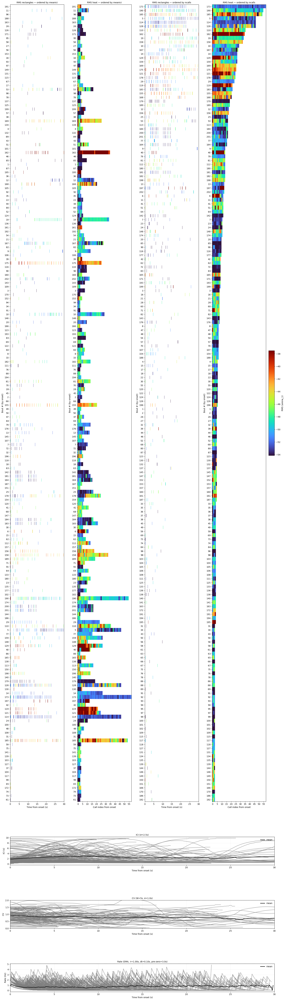

✅ Saved single figure (independent top-panel ordering): C:\Users\gg3065\Dropbox\Vocalizations_project\Figures\ALL_IN_ONE_97_98_99_109_110_111_112_113_114_115_116.pdf


In [33]:
# ================================
# ONE FIG: 4 ordered RMS panels (top) + stacked overlays (bottom) + RATE 
# Panels are ordered independently based on TOP_PANEL_KINDS entries.
# ================================
import re
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.patches import Rectangle
from matplotlib import gridspec

assert 'calc' in locals(), "Run the COMPUTATIONS cell first to build `calc`."

# ---- Choose orders per panel (independent) ----
# Syntax: "rms_rect@<order>[:rev]" or "rms_heat@<order>[:rev]"

# Each string has the form:
#     "rms_heat@<order>[:rev]"   OR   "rms_rect@<order>[:rev]"
#
# PANEL TYPES
#   rms_heat  : heatmap (rows=bouts, cols=call index)
#   rms_rect  : time-true rectangles (each call drawn with its duration)
#
# ORDERS (keys available in calc['orders'])
#   onset     : chronological by bout onset (baseline)
#   firstcall : sort by RMS of the FIRST call (high → low)
#   meanrms   : sort by MEAN RMS across the bout (high → low)
#   ncalls    : sort by NUMBER of calls in the bout (many → few)
#   meanici   : sort by MEAN ICI within first WINDOW_SEC seconds (short → long)
#   cv        : sort by CV(ICI) within first WINDOW_SEC seconds (regular → irregular)

TOP_PANEL_KINDS = [
    'rms_rect@meanici',      # rectangles ordered by mean ICI (base order)
    'rms_heat@meanici',  # heat ordered by mean ICI but reversed (high→low if base is low→high)
    'rms_rect@ncalls',   # rectangles by #calls, reversed
    'rms_heat@ncalls',      # heat by mean RMS (base order)
]

# ---- Which overlays to show at bottom (drawn as overlays; ordering not used here) ----
BOTTOM_OVERLAYS = ['ici_overlay', 'cv_overlay', 'rate_overlay']

# Slim colorbar appearance
CBAR_SHRINK, CBAR_PAD, CBAR_FRACTION, CBAR_ASPECT = 0.70, 0.01, 0.022, 18

FALLBACK_WIDTH = 0.05
LINE_ALPHA, LINE_WIDTH, SHOW_MEAN_LINE = 0.8, 1.4, True

# Pull from calc
per_bout_calls = calc['per_bout_calls']
R_onset        = calc['R_onset']
used_bout_ids  = calc['used_bout_ids']
bout_ord_by_id = calc['bout_ord_by_id']
orders_dict    = calc['orders']
vmin, vmax     = calc['vmin'], calc['vmax']
POST_TIME_LIMIT= calc['POST_TIME_LIMIT']
t_grid_pos     = calc['t_grid_pos']       # for ICI/CV/RMS
ici_mat        = calc.get('ici_smooth_mat')
cv_mat         = calc.get('cv_smooth_mat')
post_time      = calc['post_time']
max_calls      = calc['max_calls']

# Rate (EMA) precomputed in calc:
t_grid_rate = calc['t_grid_rate']
rate_mat    = calc['rate_mat']
TAU_RATE_SEC = calc['TAU_RATE_SEC']
stride_sec   = calc['stride_sec']
PRE_ZERO_SEC = calc['PRE_ZERO_SEC']

# Colormap for RMS
cmap = plt.get_cmap('turbo') if 'turbo' in plt.colormaps() else plt.get_cmap('viridis')
norm = mcolors.Normalize(vmin=vmin, vmax=vmax)

def parse_kind(kind_str):
    """
    Returns (panel_type, order_key, reverse_flag).
    kind_str example: 'rms_heat@meanici:rev' or 'rms_rect@ncalls'
    """
    m = re.match(r'^(rms_heat|rms_rect)@([a-z_]+)(?::(rev))?$', kind_str)
    if not m:
        raise ValueError(f"Bad TOP_PANEL_KINDS entry: {kind_str}")
    ptype, order_key, rev = m.group(1), m.group(2), (m.group(3) == 'rev')
    if order_key not in orders_dict:
        raise KeyError(f"Order '{order_key}' not found in calc['orders'] keys {list(orders_dict.keys())}")
    base = np.asarray(orders_dict[order_key])
    return ptype, order_key, (base[::-1] if rev else base)

def draw_rms_heat(ax, order_idx, title):
    im = ax.imshow(R_onset[order_idx, :], aspect='auto', interpolation='nearest',
                   cmap=cmap, norm=norm, origin='upper')
    ax.set_title(title, fontsize=10)
    ax.set_xlabel("Call index from onset")
    ax.set_ylabel("Bout # (by onset)")
    ax.set_yticks(np.arange(len(order_idx)))
    ax.set_yticklabels([bout_ord_by_id[used_bout_ids[i]] for i in order_idx])
    if max_calls <= 20:
        ax.set_xticks(np.arange(max_calls))
    else:
        step = max(1, max_calls // 10); ax.set_xticks(np.arange(0, max_calls, step))
    return im

def draw_rms_rect(ax, order_idx, title):
    row_h = 0.8
    x_max = POST_TIME_LIMIT if POST_TIME_LIMIT is not None else post_time
    for r, i in enumerate(order_idx):
        dfc = per_bout_calls[i]
        y = r + (1 - row_h) / 2.0
        for _, row in dfc.iterrows():
            sr, dur, rms = row['start_rel'], row['dur'], row['RMS_arena_1']
            if not np.isfinite(sr) or not np.isfinite(rms):
                continue
            w = dur if (np.isfinite(dur) and dur > 0) else FALLBACK_WIDTH
            ax.add_patch(Rectangle((sr, y), w, row_h,
                                   facecolor=cmap(norm(rms)), edgecolor='none'))
    ax.set_xlim(0, x_max)
    ax.set_ylim(0, len(order_idx))
    ax.invert_yaxis()  # to match the heatmap orientation (row 0 at top)
    ax.set_title(title, fontsize=10)
    ax.set_xlabel("Time from onset (s)")
    ax.set_ylabel("Bout # (by onset)")
    ax.set_yticks(np.arange(len(order_idx)) + 0.5)
    ax.set_yticklabels([bout_ord_by_id[used_bout_ids[i]] for i in order_idx])

def draw_overlay(ax, tgrid, mat, title, ylabel, ylim=None, color=None):
    for i in range(mat.shape[0]):
        y = mat[i, :]
        if np.all(np.isnan(y)): 
            continue
        ax.plot(tgrid, y, alpha=LINE_ALPHA, lw=LINE_WIDTH, color=color)
    if SHOW_MEAN_LINE and np.isfinite(mat).any():
        m = np.nanmean(mat, axis=0)
        ax.plot(tgrid, m, color='k', lw=2.0, label='mean')
        ax.legend(frameon=False, loc='upper right')
    ax.axvline(0, ls='--', c='k', alpha=0.5, lw=1)
    ax.set_xlim(0, post_time)
    if ylim is not None:
        ax.set_ylim(*ylim)
    ax.set_title(title, fontsize=10)
    ax.set_xlabel("Time from onset (s)")
    ax.set_ylabel(ylabel)
    ax.grid(True, linestyle='--', alpha=0.25)

# Layout/gaps (smaller gaps between bottom panels)
overlay_specs = {
    'ici_overlay' : (t_grid_pos,  calc['ici_smooth_mat'],  f"ICI (σ={calc['ICI_SMOOTH_SEC']}s)",              "ICI (s)", (None, None), 'tab:gray'),
    'cv_overlay'  : (t_grid_pos,  calc['cv_smooth_mat'],   f"CV (W={calc['CV_FWD_SEC']}s, σ={calc['CV_SMOOTH_SEC']}s)", "CV", (0, 2), 'tab:gray'),
    'rate_overlay': (t_grid_rate, rate_mat,                f"Rate (EMA, τ={TAU_RATE_SEC:.2f}s, dt={stride_sec:.2f}s, pre-zero={PRE_ZERO_SEC:.1f}s)", "Rate (Hz)", (None, None), 'tab:gray'),
}
chosen_overlays = [k for k in BOTTOM_OVERLAYS if overlay_specs.get(k, (None, None, None))[1] is not None]
n_over = len(chosen_overlays)

top_height     = 0.35 * len(used_bout_ids) + 3.0
overlay_height = 2.6   # was 3.0
fig_h = top_height + n_over * overlay_height + 1.0
fig_w = 22

fig = plt.figure(figsize=(fig_w, fig_h))
gs  = gridspec.GridSpec(nrows=1 + n_over, ncols=4,
                        height_ratios=[top_height] + [overlay_height]*n_over,
                        hspace=0.16,   # tighter vertical spacing between bottoms
                        wspace=0.25)

# Top row: four RMS panels (each with its own independent order)
top_axes, ims = [], []
for j, kind in enumerate(TOP_PANEL_KINDS[:4]):
    ax = fig.add_subplot(gs[0, j]); top_axes.append(ax)
    ptype, key, order_idx = parse_kind(kind)
    title = f"{'RMS heat' if ptype=='rms_heat' else 'RMS rectangles'} — ordered by {key}" + (" (rev)" if kind.endswith(":rev") else "")
    if ptype == 'rms_heat':
        im = draw_rms_heat(ax, order_idx, title); ims.append(im)
    else:
        draw_rms_rect(ax, order_idx, title)

# Slim shared colorbar
if ims:
    sm = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
    cbar = fig.colorbar(sm, ax=top_axes, location='right',
                        shrink=CBAR_SHRINK, pad=CBAR_PAD, fraction=CBAR_FRACTION, aspect=CBAR_ASPECT)
    cbar.set_label("RMS (arena_1)")

# Bottom overlays
row = 1
for name in chosen_overlays:
    tgrid, mat, title, ylabel, ylim, col = overlay_specs[name]
    ax = fig.add_subplot(gs[row, :])
    draw_overlay(ax, tgrid, mat, title, ylabel, ylim=ylim, color=col)
    row += 1

plt.show()

# Save
exp_str = "_".join(map(str, sorted(set(locals().get('exp_list', []))))) or "exps"
out_path = os.path.join(figs_path, f"ALL_IN_ONE_{exp_str}.pdf")
fig.savefig(out_path, bbox_inches="tight")
print(f"✅ Saved single figure (independent top-panel ordering): {out_path}")


Sanity check of constructed WAV paths (first 5 bouts):
  exp=235 file_num=  1 -> OK
  exp=235 file_num=  1 -> OK
  exp=235 file_num=  1 -> OK
  exp=235 file_num=  2 -> OK
  exp=235 file_num=  9 -> OK
Pre-bout data computed: 202 bouts; missing 1.
RMS win=50ms hop=40ms
RMS win=50ms hop=40ms


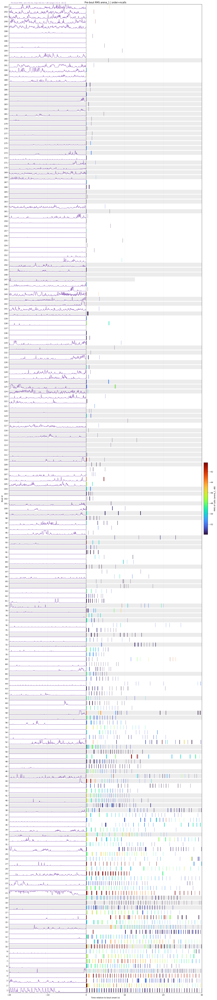

✅ Saved: C:\Users\gg3065\Dropbox\Vocalizations_project\Figures\prebout_rms_ncalls_235_237.pdf


In [51]:
# ============================================
# PRE-BOUT: RMS *or* Spectrogram + call rectangles
# with per-row NIGHT SHADING and FLEXIBLE SORT ORDER
# ============================================
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.patches import Rectangle
from scipy.io import wavfile
from scipy.signal import spectrogram

# --------- USER CHOICES ---------
PREBOUT_MODE = 'spec'       # 'rms' or 'spec'
ORDER_BY     = 'ncalls'     # 'onset' | 'firstcall' | 'meanrms' | 'ncalls' | 'meanici' | 'cv'
ORDER_REVERSE = False      # set True to flip the chosen ordering

# --------- KNOBS ---------
# pre-bout extraction
PRE_WINDOW_SEC   = 20.0        # seconds BEFORE bout onset to analyze (left of t=0)
ARENA_CHANNEL    = "channel_10"  # arena_1
AUDIO_PATTERNS   = [
    # Add more fallbacks if needed (order = priority)
    r"\\sanesstorage.cns.nyu.edu\archive\ginosar\Processed_data\Audio\{exp}\Averaged_wavs_w_annotations\{channel}_file_{file_num:03d}.wav",
]

# short-time RMS (used when PREBOUT_MODE = 'rms')
ST_RMS_WIN_SEC   = 0.050       # 50 ms windows
ST_RMS_HOP_SEC   = 0.040       # 
EPS              = 1e-12

# spectrogram (used when PREBOUT_MODE = 'spec')
SPEC_WIN_SEC     = 0.020       #  ms window
SPEC_HOP_SEC     = 0.010       #  ms hop
SPEC_FMAX_HZ     = 60000       # clip display up to this freq
SPEC_PCT_LOW, SPEC_PCT_HI = 5, 95  # robust color scale (per-bout strip)

# rectangles (calls after t=0)
POST_TIME_LIMIT  = 30.0        # seconds AFTER onset to display the call rectangles; None = all
FALLBACK_RECT_W  = 0.05        # sec, if a call has no stop time nor duration

# visuals
ROW_PAD    = 0.08
C_RECT     = plt.get_cmap('turbo') if 'turbo' in plt.colormaps() else plt.get_cmap('viridis')  # rectangles
C_SPEC     = plt.get_cmap('magma')   # spectrogram strips
FIG_W      = 16
FIG_H_PER  = 0.35                    # inches per bout row + padding
SHADE_ALPHA= 0.15                    # night shading alpha

# night (dark) definition for shading
NIGHT_START_HOUR = 20   # 20:00 local
NIGHT_END_HOUR   = 8    # 08:00 next day

# sorting window (for mean ICI / CV at onset)
WINDOW_SEC         = 10.0
CV_MIN_SAMPLES     = 3

# --------- REQUIREMENTS ---------
assert "alarm_calls" in locals(), "Need alarm_calls in scope."
assert "experiment_start_real" in locals(), "Need experiment_start_real in scope."

# ------------- Helpers -------------
def wav_path_for(exp, file_num, channel=ARENA_CHANNEL):
    for pat in AUDIO_PATTERNS:
        p = pat.format(exp=int(exp), file_num=int(file_num), channel=channel)
        if os.path.exists(p):
            return p
    return None

def read_wav_guarded(path):
    """Read WAV; return (rate, mono_float32). On error, return (None, None)."""
    try:
        rate, data = wavfile.read(path)
        if data.ndim > 1:
            data = data[:, 0]
        return rate, data.astype(np.float32, copy=False)
    except Exception:
        return None, None

def get_prev_file_segment(exp, file_num, end_sec_in_file, want_sec):
    """
    Collect up to `want_sec` seconds ending at `end_sec_in_file` from file {file_num},
    going into previous files as needed. Returns (wave(float32), rate).
    """
    segs = []
    remaining = float(want_sec)
    current_file = int(file_num)
    current_end = float(end_sec_in_file)
    got_rate = None
    while remaining > 1e-9 and current_file >= 1:
        p = wav_path_for(exp, current_file)
        rate, x = read_wav_guarded(p)
        if rate is None or x is None:
            break
        if got_rate is None:
            got_rate = rate
        n = len(x); dur = n / rate
        end_s = min(max(current_end, 0.0), dur)
        start_s = max(0.0, end_s - remaining)
        i0 = int(start_s * rate); i1 = int(end_s * rate)
        if i1 > i0:
            segs.append(x[i0:i1].copy())
            remaining -= (end_s - start_s)
        current_file -= 1
        current_end = float('inf')
    if not segs:
        return np.array([], dtype=np.float32), got_rate
    segs = segs[::-1]  # chronological
    return np.concatenate(segs, axis=0), got_rate

def short_time_rms_db(x, rate, win_sec=ST_RMS_WIN_SEC, hop_sec=ST_RMS_HOP_SEC, eps=EPS):
    """Frame x and compute RMS in dB. Returns (times_sec_from_segment_start, rms_db)."""
    if len(x) == 0 or rate is None:
        return np.array([]), np.array([])
    win = int(round(win_sec * rate))
    hop = int(round(hop_sec * rate))
    if win <= 1 or hop <= 0:
        return np.array([]), np.array([])
    n_frames = 1 + max(0, (len(x) - win) // hop)
    if n_frames <= 0:
        return np.array([]), np.array([])
    rms = np.empty(n_frames, dtype=np.float32)
    tsec = np.empty(n_frames, dtype=np.float32)
    for i in range(n_frames):
        i0 = i * hop
        i1 = i0 + win
        seg = x[i0:i1]
        tsec[i] = (i0 + win * 0.5) / rate
        rms[i] = 20.0 * np.log10(np.sqrt(np.mean(seg * seg)) + eps)
    return tsec, rms

def night_segments_for_row(t0_real, window_start_real, window_end_real,
                           night_start_hour=NIGHT_START_HOUR, night_end_hour=NIGHT_END_HOUR):
    """
    Return list of (rel_left_sec, rel_right_sec) segments (relative to t0_real)
    where absolute time overlaps the nightly window [night_start, next day night_end].
    """
    segs = []
    current = window_start_real.normalize() - pd.Timedelta(days=1)
    last    = window_end_real.normalize() + pd.Timedelta(days=1)
    while current <= last:
        ns = current + pd.Timedelta(hours=night_start_hour)
        ne = current + pd.Timedelta(days=1, hours=night_end_hour)
        left, right = max(window_start_real, ns), min(window_end_real, ne)
        if left < right:
            segs.append(((left - t0_real).total_seconds(), (right - t0_real).total_seconds()))
        current += pd.Timedelta(days=1)
    return segs

def row_yspan(row_idx, pad=ROW_PAD):
    return row_idx + pad, row_idx + 1 - pad

def ici_and_cv_in_window(t_rel, window_sec, cv_min_samples=CV_MIN_SAMPLES):
    """Compute mean ICI and CV of ICI using calls with 0<=t<=window."""
    t = t_rel[(t_rel >= 0) & (t_rel <= window_sec)]
    if t.size < 2: 
        return np.nan, np.nan
    ici = np.diff(t)
    if ici.size < 1: 
        return np.nan, np.nan
    mean_ici = float(np.mean(ici))
    cv_ici   = float(np.std(ici, ddof=1) / mean_ici) if (ici.size >= max(2, cv_min_samples) and mean_ici > 0) else np.nan
    return mean_ici, cv_ici

# ------------- Build bouts & onset info -------------
ac = alarm_calls.copy()
ac["bout_id"] = pd.to_numeric(ac["bout_id"], errors="coerce")
ac = ac[ac["bout_id"].notna()].copy()

idx_min = ac.groupby("bout_id")["start_time_experiment_sec"].idxmin()
onsets  = ac.loc[idx_min, ["bout_id", "start_time_experiment_sec", "exp", "file_num", "start_time_file_sec"]].copy()
onsets  = onsets.sort_values("start_time_experiment_sec").reset_index(drop=True)
used_bout_ids = onsets["bout_id"].tolist()

# onset real time map
onsets["onset_real"] = pd.to_datetime(onsets["start_time_experiment_sec"], unit="s", origin=experiment_start_real)
onset_real_by_id = dict(zip(onsets["bout_id"], onsets["onset_real"]))

# Per-bout call data (rectangles)
per_bout_calls = []
for b in used_bout_ids:
    g = ac[ac["bout_id"] == b].sort_values("start_time_experiment_sec").copy()
    t0 = g["start_time_experiment_sec"].iloc[0]
    g["start_rel"] = g["start_time_experiment_sec"] - t0
    if "duration_sec" in g.columns and g["duration_sec"].notna().any():
        g["dur"] = pd.to_numeric(g["duration_sec"], errors="coerce")
    elif "stop_time_experiment_sec" in g.columns:
        g["dur"] = (pd.to_numeric(g["stop_time_experiment_sec"], errors="coerce")
                    - pd.to_numeric(g["start_time_experiment_sec"], errors="coerce"))
    else:
        g["dur"] = np.nan
    # optional time limit for rectangles
    if POST_TIME_LIMIT is not None:
        g = g[g["start_rel"] <= POST_TIME_LIMIT]
    per_bout_calls.append(g[["start_rel", "dur", "RMS_arena_1"]].copy())

# Global RMS scale from call rectangles (used for both rectangles AND pre-bout RMS vertical mapping)
all_rms_vals = pd.concat(per_bout_calls, ignore_index=True)["RMS_arena_1"]
all_rms_vals = pd.to_numeric(all_rms_vals, errors="coerce")
finite_call_rms = all_rms_vals[np.isfinite(all_rms_vals)]
if finite_call_rms.empty:
    CALL_VMIN, CALL_VMAX = -60.0, -30.0
else:
    CALL_VMIN = np.percentile(finite_call_rms, 5)
    CALL_VMAX = np.percentile(finite_call_rms, 95)
    if np.isclose(CALL_VMIN, CALL_VMAX):
        CALL_VMIN, CALL_VMAX = float(finite_call_rms.min()), float(finite_call_rms.max())
rect_norm = mcolors.Normalize(vmin=CALL_VMIN, vmax=CALL_VMAX)

# ------------- Sorting metrics -------------
firstcall_rms = []
mean_rms      = []
call_counts   = []
mean_ici_win  = []
cv_ici_win    = []

for dfc in per_bout_calls:
    r = dfc["RMS_arena_1"].to_numpy()
    r = r[np.isfinite(r)]
    firstcall_rms.append(dfc["RMS_arena_1"].iloc[0] if len(dfc) > 0 else np.nan)
    mean_rms.append(np.nanmean(r) if r.size else np.nan)
    call_counts.append(int(len(dfc)))

# For ICI/CV need original call times (not time-limited)
for b in used_bout_ids:
    g0 = ac[ac["bout_id"] == b].sort_values("start_time_experiment_sec").copy()
    t0 = g0["start_time_experiment_sec"].iloc[0]
    t_rel_full = pd.to_numeric(g0["start_time_experiment_sec"], errors="coerce").to_numpy() - t0
    m, c = ici_and_cv_in_window(t_rel_full, WINDOW_SEC, cv_min_samples=CV_MIN_SAMPLES)
    mean_ici_win.append(m)
    cv_ici_win.append(c)

def order_index(name, reverse=False):
    """Return indices into used_bout_ids according to requested order."""
    n = len(used_bout_ids)
    base = np.arange(n)
    if name == 'onset':
        idx = base
    elif name == 'firstcall':
        a = np.asarray(firstcall_rms, float)
        idx = np.argsort(np.where(np.isfinite(a), -a, np.inf))  # high→low
    elif name == 'meanrms':
        a = np.asarray(mean_rms, float)
        idx = np.argsort(np.where(np.isfinite(a), -a, np.inf))  # high→low
    elif name == 'ncalls':
        a = np.asarray(call_counts, float)
        idx = np.argsort(np.where(np.isfinite(a), -a, np.inf))  # many→few
    elif name == 'meanici':
        a = np.asarray(mean_ici_win, float)
        idx = np.argsort(np.where(np.isfinite(a), a, np.inf))   # short→long (small first)
    elif name == 'cv':
        a = np.asarray(cv_ici_win, float)
        idx = np.argsort(np.where(np.isfinite(a), -a, np.inf))  # irregular→regular (high→low)
    else:
        raise ValueError(f"Unknown ORDER_BY='{name}'")
    return idx[::-1] if reverse else idx

order_idx = order_index(ORDER_BY, ORDER_REVERSE)

# ------------- Pre-bout extraction (in base order, then index at plot) -------------
pre_items = []    # list per bout (same order as used_bout_ids)
not_found = 0

print("Sanity check of constructed WAV paths (first 5 bouts):")
for _, r in onsets.head(5).iterrows():
    exp, fnum = int(r["exp"]), int(r["file_num"])
    p = wav_path_for(exp, fnum, ARENA_CHANNEL)
    print(f"  exp={exp} file_num={fnum:>3} -> {'OK' if p else '(not found)'}")

for _, r in onsets.iterrows():
    exp   = int(r["exp"])
    fnum  = int(r["file_num"])
    t0f   = float(r["start_time_file_sec"])  # onset inside the file
    wave, rate = get_prev_file_segment(exp, fnum, t0f, PRE_WINDOW_SEC)
    if wave.size == 0 or rate is None:
        pre_items.append(None)
        not_found += 1
        continue

    if PREBOUT_MODE == 'rms':
        t_local, rms_db = short_time_rms_db(wave, rate, ST_RMS_WIN_SEC, ST_RMS_HOP_SEC, EPS)
        t_rel = t_local - PRE_WINDOW_SEC   # [-PRE_WINDOW_SEC, ~0]
        pre_items.append({"t": t_rel, "y": rms_db})
    else:
        nperseg = max(8, int(round(SPEC_WIN_SEC * rate)))
        noverlap = max(0, int(round(SPEC_HOP_SEC * rate)))
        if noverlap >= nperseg:
            noverlap = nperseg - 1
        f, t, Pxx = spectrogram(wave, fs=rate, nperseg=nperseg, noverlap=noverlap,
                                scaling='density', mode='psd')
        keepf = f <= SPEC_FMAX_HZ
        f = f[keepf]; Pxx = Pxx[keepf, :]
        Sdb = 10.0 * np.log10(Pxx + EPS)
        t_rel = t - PRE_WINDOW_SEC         # [-PRE_WINDOW_SEC, ~0]
        pre_items.append({"t": t_rel, "f": f, "S": Sdb})

print(f"Pre-bout data computed: {len(onsets) - not_found} bouts; missing {not_found}.")

# ------------- Plot -------------
rows = len(used_bout_ids)
fig_h = 2.0 + FIG_H_PER * rows
fig, ax = plt.subplots(figsize=(FIG_W, fig_h), constrained_layout=False)

# Per-row night shading across [-PRE_WINDOW_SEC, POST_TIME_LIMIT]
for r, idx in enumerate(order_idx):
    b_id = used_bout_ids[idx]
    t0_real = onset_real_by_id[b_id]
    w0 = t0_real - pd.Timedelta(seconds=PRE_WINDOW_SEC)
    w1 = t0_real + pd.Timedelta(seconds=POST_TIME_LIMIT if POST_TIME_LIMIT is not None else 0)
    for rel_left, rel_right in night_segments_for_row(t0_real, w0, w1):
        left = max(-PRE_WINDOW_SEC, rel_left)
        right = min(POST_TIME_LIMIT if POST_TIME_LIMIT is not None else 0.0, rel_right) \
                if POST_TIME_LIMIT is not None else min(0.0, rel_right)
        if left < right:
            y0, y1 = row_yspan(r)
            ax.add_patch(Rectangle((left, y0), right - left, y1 - y0,
                                   facecolor='gray', alpha=SHADE_ALPHA, edgecolor='none'))

# Pre-bout panel (left of t=0) + call rectangles (right of t=0)
for r, idx in enumerate(order_idx):
    y0, y1 = row_yspan(r)

    # ---- left: pre-bout (RMS or Spectrogram) ----
    item = pre_items[idx]
    if item is not None:
        if PREBOUT_MODE == 'rms':
            t = item["t"]; y_db = item["y"]
            if np.isfinite(y_db).any():
                # map dB → row height using the call RMS scale
                y_norm = (np.clip(y_db, CALL_VMIN, CALL_VMAX) - CALL_VMIN) / max(1e-9, (CALL_VMAX - CALL_VMIN))
                y_plot = y0 + y_norm * (y1 - y0)
                m = (t >= -PRE_WINDOW_SEC) & (t <= 0.0) & np.isfinite(y_plot)
                ax.plot(t[m], y_plot[m], color='tab:purple', lw=1.5, alpha=0.9)
        else:
            t = item["t"]; f = item["f"]; S = item["S"]
            if t.size and f.size:
                v0 = np.percentile(S[np.isfinite(S)], SPEC_PCT_LOW) if np.isfinite(S).any() else -120
                v1 = np.percentile(S[np.isfinite(S)], SPEC_PCT_HI) if np.isfinite(S).any() else -30
                ax.imshow(S, aspect='auto', origin='lower', cmap=C_SPEC,
                          extent=[t.min(), min(0.0, t.max()), y0, y1],
                          vmin=v0, vmax=v1, interpolation='nearest')

    # ---- right: call rectangles (0..POST_TIME_LIMIT) ----
    dfc = per_bout_calls[idx]
    for _, row in dfc.iterrows():
        sr = row["start_rel"]; dur = row["dur"]; rms = row["RMS_arena_1"]
        if not np.isfinite(sr) or (POST_TIME_LIMIT is not None and sr > POST_TIME_LIMIT):
            continue
        w = dur if (np.isfinite(dur) and dur > 0) else FALLBACK_RECT_W
        ax.add_patch(Rectangle((sr, y0), w, (y1 - y0),
                               facecolor=C_RECT(rect_norm(rms) if np.isfinite(rms) else 0.0),
                               edgecolor='none'))

# Axes cosmetics
ax.set_xlim(-PRE_WINDOW_SEC, POST_TIME_LIMIT if POST_TIME_LIMIT is not None else 0.0)
ax.set_ylim(0, rows)
ax.set_xlabel("Time relative to bout onset (s)")
ax.set_ylabel("Bout #")
ax.set_yticks(np.arange(rows) + 0.5)
# Y tick labels are positions 1..N in the *sorted* view
ax.set_yticklabels(np.arange(1, rows + 1))
ax.axvline(0, ls='--', c='k', alpha=0.6)
ax.grid(True, axis='x', linestyle='--', alpha=0.25)

# Left-side info when using RMS pre-bout
# if PREBOUT_MODE == 'rms':
#     ax.text(-PRE_WINDOW_SEC + 0.5, rows + 0.5,
#             f"Pre-bout RMS dB range [{CALL_VMIN:.1f}, {CALL_VMAX:.1f}], ",
#             ha='left', va='top', fontsize=9, color='tab:purple')

# if PREBOUT_MODE == 'rms':
#     print(f"RMS win={ST_RMS_WIN_SEC*1000:.0f}ms hop={ST_RMS_HOP_SEC*1000:.0f}ms")
# else:
#     print(f"Spectrogram win={SPEC_WIN_SEC*1000:.0f}ms hop={SPEC_HOP_SEC*1000:.0f}ms ≤{SPEC_FMAX_HZ/1000:.0f}kHz")

# === Console + on-figure annotation for pre-bout panel ===
# if yours is named `ax_pre` use that; if it’s just `ax`, replace below.
pre_ax = ax  # <-- change to your axis var if different

if PREBOUT_MODE.lower().startswith('rms'):
    # Console
    print(f"RMS win={ST_RMS_WIN_SEC*1000:.0f}ms hop={ST_RMS_HOP_SEC*1000:.0f}ms")
    # On-figure
    pre_ax.text(
        -PRE_WINDOW_SEC + 0.5,               # x (seconds before onset)
        rows + 0.5,                          # y (just above top row)
        (f"Pre-bout RMS: win={ST_RMS_WIN_SEC*1000:.0f} ms, "
         f"hop={ST_RMS_HOP_SEC*1000:.0f} ms • "
         f"dB range [{CALL_VMIN:.1f}, {CALL_VMAX:.1f}]"),
        ha='left', va='top', fontsize=9, color='tab:purple'
    )

elif PREBOUT_MODE.lower().startswith('spec'):
    # If you also have a lower cutoff, set SPEC_FMIN_HZ; otherwise assume 0 Hz.
    fmin_k = (SPEC_FMIN_HZ / 1000.0) if 'SPEC_FMIN_HZ' in globals() else 0.0
    fmax_k = SPEC_FMAX_HZ / 1000.0

    # Console
    print(f"Spectrogram win={SPEC_WIN_SEC*1000:.0f}ms hop={SPEC_HOP_SEC*1000:.0f}ms "
          f"freq range {fmin_k:.1f}–{fmax_k:.1f} kHz")

    # On-figure
    pre_ax.text(
        -PRE_WINDOW_SEC + 0.5,
        rows + 0.5,
        (f"Pre-bout spectrogram: win={SPEC_WIN_SEC*1000:.0f} ms, "
         f"hop={SPEC_HOP_SEC*1000:.0f} ms • "
         f"{fmin_k:.1f}–{fmax_k:.1f} kHz"),
        ha='left', va='top', fontsize=9, color='tab:blue'
    )


# Colorbar for call rectangles (RMS arena_1)
sm = plt.cm.ScalarMappable(norm=rect_norm, cmap=C_RECT)
cbar = plt.colorbar(sm, ax=ax, fraction=0.02, pad=0.01, aspect=18)
cbar.set_label("RMS of calls (arena_1, dB)")

# Title
title_bits = [f"Pre-bout {'RMS' if PREBOUT_MODE=='rms' else 'Spectrogram'} arena_1"]
title_bits.append(f"order={ORDER_BY}{' (reversed)' if ORDER_REVERSE else ''}")
ax.set_title(" | ".join(title_bits))

plt.tight_layout()

if PREBOUT_MODE == 'rms':
    print(f"RMS win={ST_RMS_WIN_SEC*1000:.0f}ms hop={ST_RMS_HOP_SEC*1000:.0f}ms")
else:
    print(f"Spectrogram win={SPEC_WIN_SEC*1000:.0f}ms hop={SPEC_HOP_SEC*1000:.0f}ms ≤{SPEC_FMAX_HZ/1000:.0f}kHz")

# Save
exp_str = "_".join(map(str, sorted(set(locals().get('exp_list', []))))) or "exps"
out_path = os.path.join(locals().get("figs_path", os.getcwd()),
                        f"prebout_{PREBOUT_MODE}_{ORDER_BY}{'_rev' if ORDER_REVERSE else ''}_{exp_str}.pdf")
fig.savefig(out_path, bbox_inches="tight")
plt.show()
print(f"✅ Saved: {out_path}")


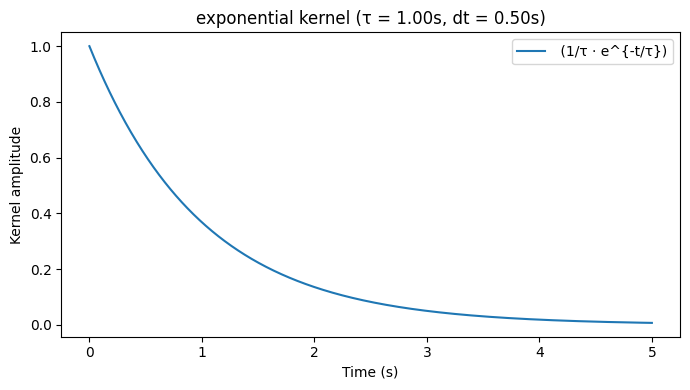

alpha = 0.393469
Half-life (time to 50%): 0.693 s
Sum of discrete taps: 0.995913 (should be ~1.0)


In [94]:
import numpy as np
import matplotlib.pyplot as plt

# --- choose your smoothing and sampling ---
tau_sec = 1      # EMA time-constant τ (seconds)
dt      = 0.5      # bin size (seconds)
K       = 5.0      # show up to K * τ on the x-axis

# ----- discrete EMA kernel (unit-sum on samples) -----
# EMA update: y[i] = (1-α) y[i-1] + α x[i]
alpha = 1.0 - np.exp(-dt / tau_sec)
# impulse response on *sampled rate* x[i] (Hz):  k[n] = α (1-α)^n,  n=0,1,2,...
N = int(np.ceil(K * tau_sec / dt)) + 1
n = np.arange(N)
k_discrete = alpha * (1.0 - alpha)**n           # unit-sum over n (∑ k_discrete = 1)

# time stamps for discrete taps (lag from "now")
t_discrete = n * dt

# ----- continuous one-sided exponential (area = 1) -----
t = np.linspace(0, K * tau_sec, 1000)
k_cont = (1.0 / tau_sec) * np.exp(-t / tau_sec)  # ∫_0^∞ k_cont dt = 1

# ----- plot -----
plt.figure(figsize=(7, 4))
plt.plot(t, k_cont, label=" (1/τ · e^{-t/τ})")
#stemlines, baseline = plt.stem(t_discrete, k_discrete, linefmt=' ', markerfmt='o', basefmt=' ')
plt.xlabel("Time (s)")
plt.ylabel("Kernel amplitude")
plt.title( "exponential kernel (τ = {:.2f}s, dt = {:.2f}s)".format(tau_sec, dt, alpha))
plt.legend()
plt.tight_layout()
plt.show()

# ----- a few useful numbers -----
t_half = np.log(2) * tau_sec          # time to 50% of initial amplitude
print(f"alpha = {alpha:.6f}")
print(f"Half-life (time to 50%): {t_half:.3f} s")
print(f"Sum of discrete taps: {k_discrete.sum():.6f} (should be ~1.0)")


In [ ]:
##############################